In [1]:
# @title Setup

! pip install stats
! pip install tensorflow_io

import os, numpy as np, pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
import stats
import math
import warnings
warnings.simplefilter('ignore')
from tqdm import tqdm
# from google.colab import drive
# drive.mount('/content/drive')
import os
# os.mkdir('/content/drive/MyDrive/dsp')
# os.chdir('/content/drive/MyDrive/EnergyResearch/WeatherResearch')


def plot_custom(fx,fy):
    fig = plt.figure(figsize = (fx,fy))
    ax = plt.axes()
    ax.spines['bottom'].set_color((0.9,0.9,0.9))
    ax.spines['top'].set_color((0.9,0.9,0.9))
    ax.spines['left'].set_color((0.9,0.9,0.9))
    ax.spines['right'].set_color((0.9,0.9,0.9))
    ax.grid(color='lightgrey', linestyle='-', linewidth=0.3)
    ax.set_facecolor((1.0,1.0,1.0))
    fig.patch.set_facecolor((0.9,0.9,0.9))
    fig.patch.set_alpha(0.05)
    return ax,fig

def plot_cosmos(x,xlabel,ylabel,title):
    x.spines['bottom'].set_color((0.9,0.9,0.9))
    x.spines['top'].set_color((0.9,0.9,0.9))
    x.spines['left'].set_color((0.9,0.9,0.9))
    x.spines['right'].set_color((0.9,0.9,0.9))
    x.grid(color='lightgrey', linestyle='-', linewidth=0.3)
    x.set_facecolor((1.0,1.0,1.0))
    x.set_xlabel(xlabel)
    x.set_ylabel(ylabel)
    x.set_title(title)
    fig.patch.set_facecolor((0.9,0.9,0.9))
    fig.patch.set_alpha(0.05)

def plot_texts(xlabel,ylabel,title):
  plt.xlabel(xlabel,fontsize = 13)
  plt.ylabel(ylabel,fontsize = 13)
  plt.title(title,fontsize = 25)
  plt.legend()

# os.chdir('M:\Research\EnergyImbalance\data')



from tensorflow.python.framework import dtypes
from tensorflow_io.bigquery import BigQueryClient
from tensorflow_io.bigquery import BigQueryReadSession
from google.cloud import bigquery
from google.oauth2 import service_account

project = 'revx-259410' # Project ID inserted based on the query results selected to explore
location = 'US' # Location inserted based on the query results selected to explore
client = bigquery.Client(project=project, location=location)


from google.colab import auth
from google.cloud import bigquery
from google.colab import data_table

project = 'revx-259410' # Project ID inserted based on the query results selected to explore
location = 'US' # Location inserted based on the query results selected to explore
client = bigquery.Client(project=project, location=location)
data_table.enable_dataframe_formatter()
auth.authenticate_user()

# from google.colab import drive
# drive.mount('/content/drive')

import os

import pickle
from google.cloud import storage
import numpy as np
from numpy.linalg import norm
from tqdm import tqdm
import tempfile
# Replace with your bucket name and desired destination path
# bucket_name = 'affle-ds'
# destination_blob_name = '/avishek/body/prod/site_similarities/site_bgmi_similarities.pkl'
# source_file_name = 'site_bgmi_similarities.pkl'

def upload_to_gcs(bucket_name, source_file_name, destination_blob_name):
    # Initialize a client
    storage_client = storage.Client()

    # Get the bucket
    bucket = storage_client.bucket(bucket_name)

    # Create a blob object
    blob = bucket.blob(destination_blob_name)

    print(blob)

    # Upload the file to GCS
    blob.upload_from_filename(source_file_name)

    print(f"File {source_file_name} uploaded to {destination_blob_name}.")

# # Upload the pickle file to GCS
# upload_to_gcs(bucket_name, source_file_name, destination_blob_name)

# Replace with your bucket name and file path in the bucket
# bucket_name = 'affle-ds'
# source_blob_name = '/avishek/body/prod/site_similarities/site_bgmi_similarities.pkl'
# source_file_name = 'site_bgmi_similarities.pkl'

def download_and_load_pickle(bucket_name, source_blob_name):
    # Initialize a client
    storage_client = storage.Client()

    # Get the bucket
    bucket = storage_client.bucket(bucket_name)

    # Create a blob object
    blob = bucket.blob(source_blob_name)

    # Use a temporary file
    with tempfile.NamedTemporaryFile() as temp_file:
        # Download the file from GCS
        blob.download_to_filename(temp_file.name)

        # Load the pickle file
        with open(temp_file.name, 'rb') as file:
            data = pickle.load(file)

    return data

# # Download and load the pickle file from GCS
# site_embedding = download_and_load_pickle(bucket_name, source_blob_name)
# print(site_embedding)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.6/127.6 kB 1.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for stats: filename=stats-0.1.2a0-py3-none-any.whl size=24282 sha256=c1affc97f65592e7fafd94ba9c4553da38ae1118cb94125cd74ef003685c8eec
  Stored in directory: /root/.cache/pip/wheels/c9/85/bc/3371b9bce1e4f7b8b638e8c968a4dbd74db171ee180c48f808
Successfully built stats
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 MB 29.9 MB/s eta 0:00:00


# EXPLORATION AND EXPERIMENTATION

# GHI

In [2]:
QUERY = f'''SELECT 0 as ll_label,* FROM revx-259410.Avishek_Explore.weather_data_UK_overall; '''
query_job = client.query(QUERY)  # API request
weather_data = query_job.result().to_dataframe()
weather_data.sort_values(['ll_label','date_hour'], ascending = True, inplace = True)
weather_data.drop_duplicates(inplace = True)

In [3]:
weather_data.columns

Index(['ll_label', 'date_hour', 'temperature_2m', 'relative_humidity_2m',
       'dew_point_2m', 'apparent_temperature', 'precipitation', 'rain',
       'snowfall', 'snow_depth', 'weather_code', 'pressure_msl',
       'surface_pressure', 'cloud_cover', 'cloud_cover_low', 'cloud_cover_mid',
       'cloud_cover_high', 'et0_fao_evapotranspiration',
       'vapour_pressure_deficit', 'wind_speed_10m', 'wind_speed_100m',
       'wind_direction_10m', 'wind_direction_100m', 'wind_gusts_10m',
       'soil_temperature_0_to_7cm', 'soil_temperature_7_to_28cm',
       'soil_temperature_28_to_100cm', 'soil_temperature_100_to_255cm',
       'soil_moisture_0_to_7cm', 'soil_moisture_7_to_28cm',
       'soil_moisture_28_to_100cm', 'soil_moisture_100_to_255cm',
       'shortwave_radiation', 'direct_radiation', 'diffuse_radiation',
       'direct_normal_irradiance', 'global_tilted_irradiance',
       'terrestrial_radiation', 'shortwave_radiation_instant',
       'direct_radiation_instant', 'diffuse_radiat

## Solar Irradiance Analysis - UK

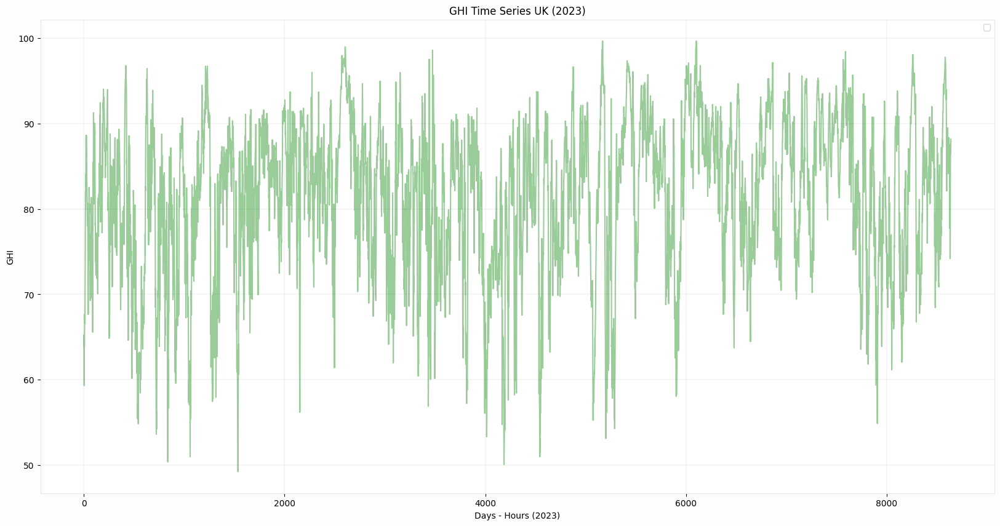

In [ ]:
fig = plt.figure(figsize = (20,10))
ax = plt.axes()

plt.plot(range(len(weather_data))[0:30*24*12],weather_data['shortwave_radiation'].values[-30*12*24:], alpha = 0.4, color = 'green')
plt.legend()
plot_cosmos(ax,'Days - Hours (2023)','GHI','GHI Time Series UK (2023)')
plt.show()

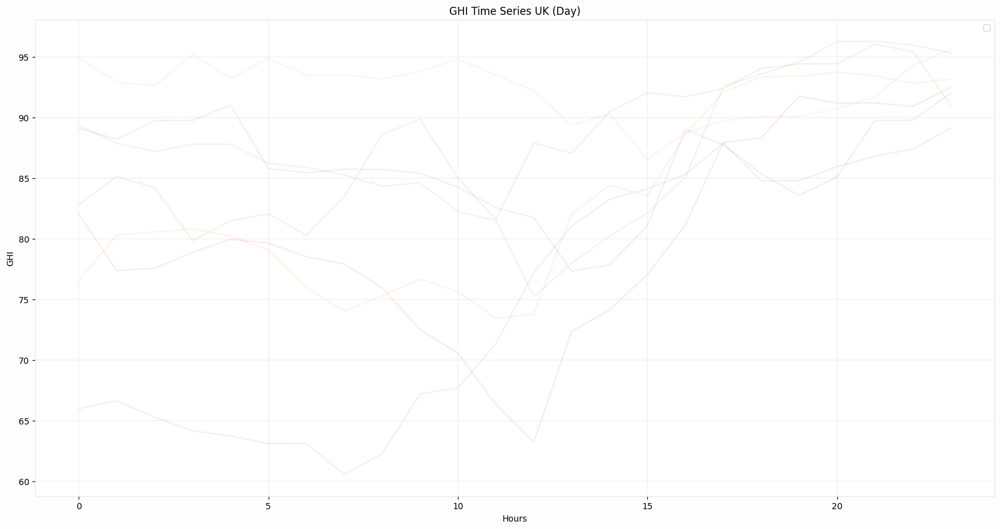

In [ ]:
fig = plt.figure(figsize = (20,10))
ax = plt.axes()
for ind, ll in weather_data[(weather_data['country'] == 'UK') & (weather_data['energy'] == 'Solar')][['lat','lon']].drop_duplicates().iterrows():
    temp = weather_data[(weather_data['country'] == 'UK') & \
                          (weather_data['lat'] == ll[0]) & \
                          (weather_data['lon'] == ll[1])]['shortwave_radiation']
    plt.plot(range(24),temp.values[-24:], alpha = 0.1)
plt.legend()
plot_cosmos(ax,'Hours','GHI','GHI Time Series UK (Day)')
plt.show()

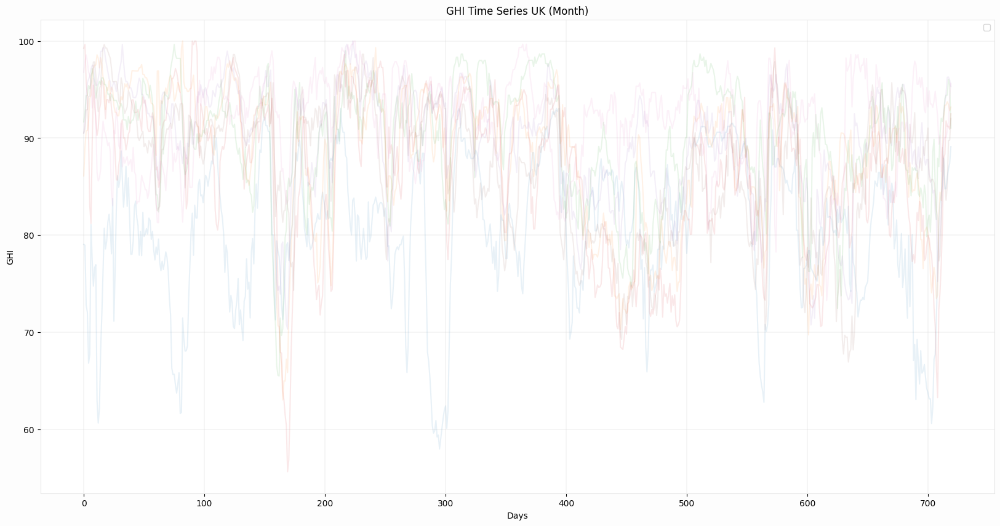

In [ ]:
fig = plt.figure(figsize = (20,10))
ax = plt.axes()
for ind, ll in weather_data[(weather_data['country'] == 'UK')  & (weather_data['energy'] == 'Solar')][['lat','lon']].drop_duplicates().iterrows():
    temp = weather_data[(weather_data['country'] == 'UK') & \
                          (weather_data['lat'] == ll[0]) & \
                          (weather_data['lon'] == ll[1])]['shortwave_radiation']
    plt.plot(range(30*24),temp.values[-30*24:], alpha = 0.1)
plt.legend()
plot_cosmos(ax,'Days','GHI','GHI Time Series UK (Month)')
plt.show()

In [ ]:
i = 0
for c in weather_data.columns:
  print(f"'{c}'",end = ', ')
  i += 1
  if i%6 == 0:
    print('\n')

'll_label', 'date_hour', 'temperature_2m', 'relative_humidity_2m', 'dew_point_2m', 'apparent_temperature', 

'precipitation', 'rain', 'snowfall', 'snow_depth', 'weather_code', 'pressure_msl', 

'surface_pressure', 'cloud_cover', 'cloud_cover_low', 'cloud_cover_mid', 'cloud_cover_high', 'et0_fao_evapotranspiration', 

'vapour_pressure_deficit', 'wind_speed_10m', 'wind_speed_100m', 'wind_direction_10m', 'wind_direction_100m', 'wind_gusts_10m', 

'soil_temperature_0_to_7cm', 'soil_temperature_7_to_28cm', 'soil_temperature_28_to_100cm', 'soil_temperature_100_to_255cm', 'soil_moisture_0_to_7cm', 'soil_moisture_7_to_28cm', 

'soil_moisture_28_to_100cm', 'soil_moisture_100_to_255cm', 'shortwave_radiation', 'direct_radiation', 'diffuse_radiation', 'direct_normal_irradiance', 

'global_tilted_irradiance', 'terrestrial_radiation', 'shortwave_radiation_instant', 'direct_radiation_instant', 'diffuse_radiation_instant', 'direct_normal_irradiance_instant', 

'global_tilted_irradiance_instant', 'terr

In [ ]:
weather_data.fillna(0,inplace = True)

In [ ]:
TIME_FEATURE = ['date_hour']
TARGET_FEATURES = ['temperature_2m','shortwave_radiation']
FEATURES = [ 'temperature_2m', 'relative_humidity_2m', 'dew_point_2m', 'apparent_temperature',
'precipitation', 'rain', 'snowfall', 'snow_depth', 'weather_code', 'pressure_msl',
'surface_pressure', 'cloud_cover', 'cloud_cover_low', 'cloud_cover_mid', 'cloud_cover_high', 'et0_fao_evapotranspiration',
'vapour_pressure_deficit', 'wind_speed_10m', 'wind_speed_100m', 'wind_direction_10m', 'wind_direction_100m', 'wind_gusts_10m',
'soil_temperature_0_to_7cm', 'soil_temperature_7_to_28cm', 'soil_temperature_28_to_100cm', 'soil_temperature_100_to_255cm',
'soil_moisture_0_to_7cm', 'soil_moisture_7_to_28cm',
'soil_moisture_28_to_100cm', 'soil_moisture_100_to_255cm', 'shortwave_radiation',
'direct_radiation', 'diffuse_radiation', 'direct_normal_irradiance',
'global_tilted_irradiance', 'terrestrial_radiation', 'shortwave_radiation_instant',
'direct_radiation_instant', 'diffuse_radiation_instant', 'direct_normal_irradiance_instant',
'global_tilted_irradiance_instant', 'terrestrial_radiation_instant']

GEO_FEATURES = ['ll_label']

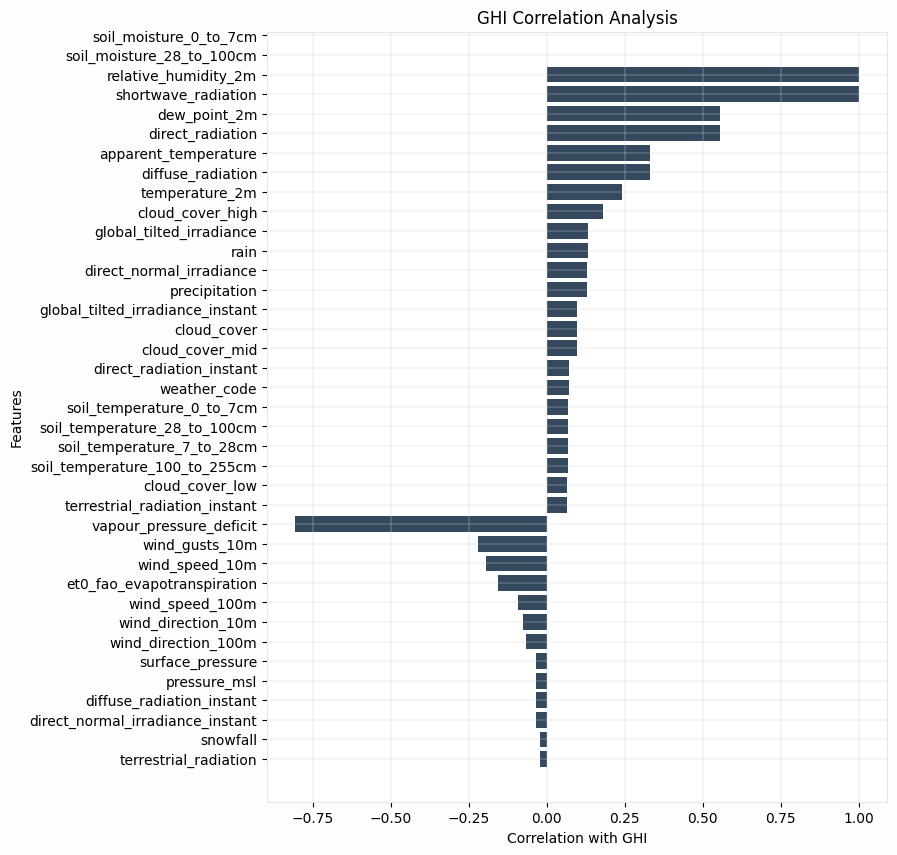

In [ ]:
# @title Features Importance Analysis
# @markdown Which features can help us determine GHI accuartely?

from scipy.stats import pearsonr

# # Calculate Pearson correlation coefficient
# pearson_correlation, p_value = pearsonr(x, y)

# print("Pearson Correlation Coefficient:", pearson_correlation)
# print("P-value:", p_value)

corr_list = []
corr_col = []

for col in FEATURES:
  corr_list.append(pearsonr(weather_data[col],weather_data[TARGET_FEATURES[1]])[0])
  corr_col.append(col)

corr_df = pd.DataFrame(np.array([corr_col,corr_list]).T , columns = ['Features','Correlation with GHI'])
corr_df.sort_values('Correlation with GHI',ascending = True,inplace = True)
corr_df['Correlation with GHI'] = corr_df['Correlation with GHI'].astype(float)

fig = plt.figure(figsize = (8,10))
ax = plt.axes()
plt.barh(corr_df['Features'],corr_df['Correlation with GHI'], color = '#34495e')
plot_cosmos(ax,'Correlation with GHI','Features','GHI Correlation Analysis')

In [ ]:
corr_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 120 entries, 83 to 0
Data columns (total 2 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   Features                      120 non-null    object
 1   Correlation with Temperature  120 non-null    object
dtypes: object(2)
memory usage: 2.8+ KB


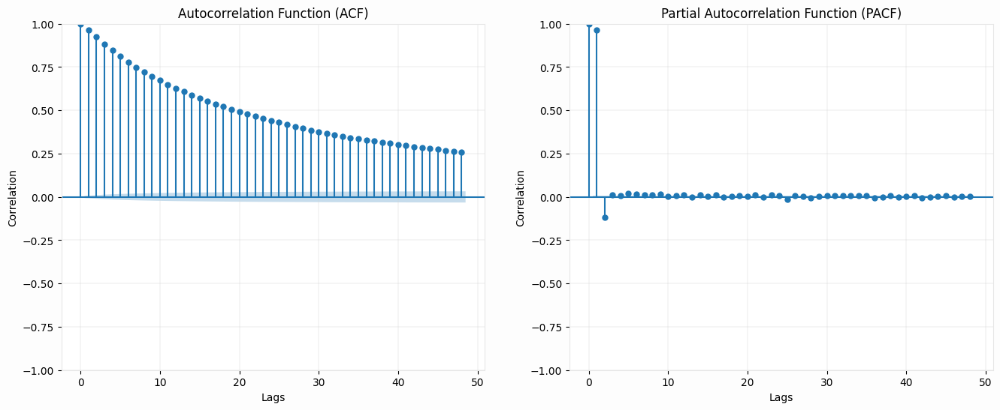

In [ ]:
# @title ACF and PACF

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()

# Loop through each unique location
for ll in unique_locations:
    # Filter the data for the specific location
    location_data = weather_data[(weather_data['ll_label'] == ll) ]

    # Extract the temperature_2m series for ACF and PACF
    temp_series = location_data['shortwave_radiation'].dropna()

    # Plot ACF and PACF
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    # fig.suptitle(f'Location: ({ll})', fontsize=16)

    plot_acf(temp_series, ax=axes[0], lags=48)
    plot_cosmos(axes[0],'Lags','Correlation','Autocorrelation Function (ACF)')

    plot_pacf(temp_series, ax=axes[1], lags=48)
    plot_cosmos(axes[1],'Lags','Correlation','Partial Autocorrelation Function (PACF)')

    plt.show()

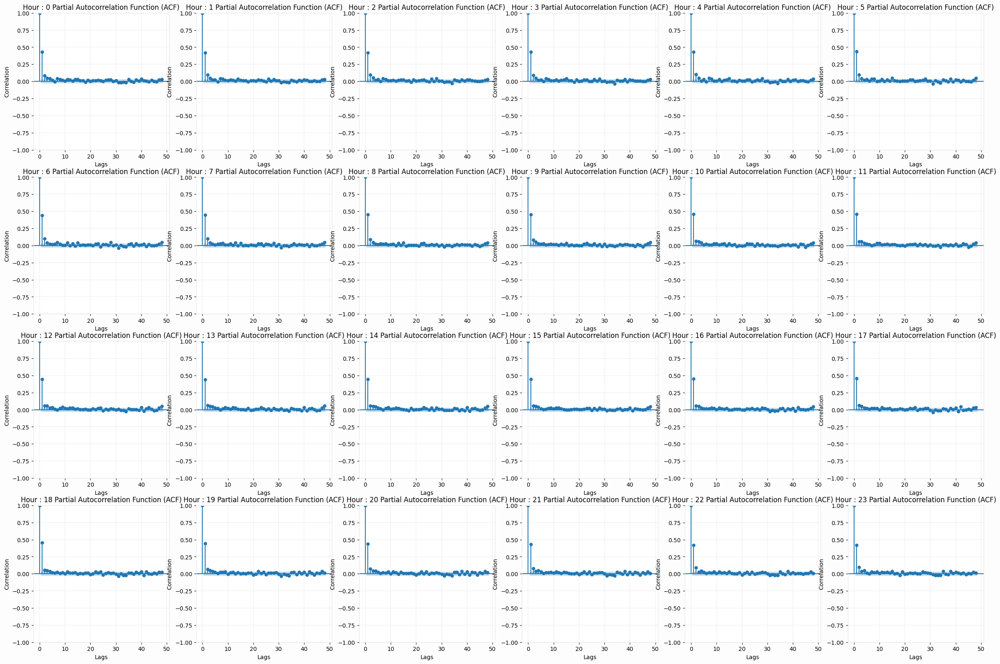

In [ ]:
# @title ACF and PACF

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

weather_data['ll_label'] = 0

# Get unique latitude and longitude combinations
hours = weather_data['hour'].unique()

fig, axes = plt.subplots(4, 6, figsize=(30, 20))
i = 0
j = 0

# Loop through each unique location
for h in hours:
    # Filter the data for the specific location
    location_data = weather_data[(weather_data['hour'] == h) ]

    # Extract the temperature_2m series for ACF and PACF
    temp_series = location_data['shortwave_radiation'].dropna()

    # Plot ACF and PACF

    # fig.suptitle(f'Location: ({ll})', fontsize=16)

    plot_pacf(temp_series, ax=axes[i][j], lags=48)
    plot_cosmos(axes[i][j],'Lags','Correlation',f'Hour : {h} Partial Autocorrelation Function (ACF)')
    j+=1
    # plot_pacf(temp_series, ax=axes[i][j], lags=48)
    # plot_cosmos(axes[i][j],'Lags','Correlation',f'Hour : {h} Partial Autocorrelation Function (PACF)')

    if j > 5:
      i += 1
      j = 0

plt.show()

In [ ]:
# @title Stationarity Test (Augmented Dickey Fuller)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller

# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()

# Loop through each unique location
for ll in unique_locations:
    # Filter the data for the specific location
    location_data = weather_data[(weather_data['ll_label'] == ll) ]

    # Extract the temperature_2m series for ACF and PACF
    temp_series = location_data['shortwave_radiation'].dropna()

    # # Plot ACF and PACF
    # fig, axes = plt.subplots(1, 1, figsize=(16, 6))
    # fig.suptitle(f'Location: ({ll})', fontsize=16)

    # # Plot the time series
    # plt.plot(range(len(temp_series)),temp_series, alpha = 0.3, color = 'tomato')

    # plot_cosmos(axes,'time','GHI',f'GHI Time Series')

    # Perform the Augmented Dickey-Fuller test
    result = adfuller(temp_series)

    # Output the results
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

    # Interpretation
    if result[1] > 0.05:
        print("Fail to reject the null hypothesis (non-stationary).")
    else:
        print("Reject the null hypothesis (stationary).")

    plt.show()


ADF Statistic: -29.21208390804767
p-value: 0.0
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567
Reject the null hypothesis (stationary).


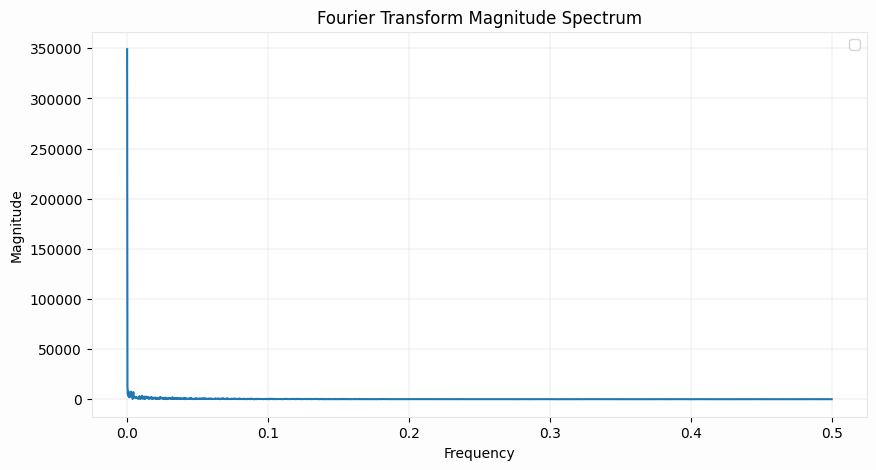

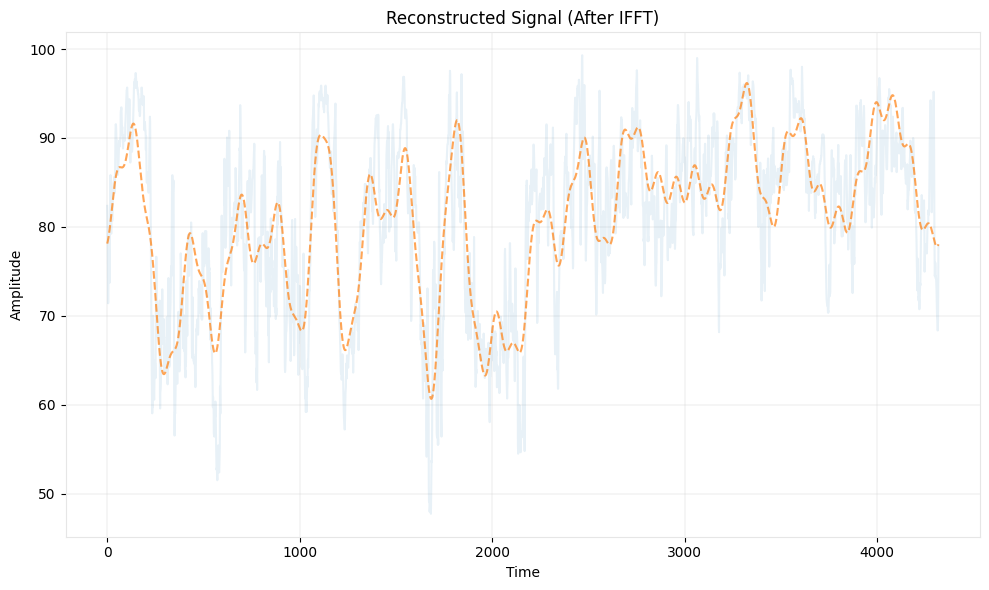

In [ ]:
# @title Seasonality Test using FFT
filtered_data = weather_data[(weather_data['country'] == 'UK')]

# Get unique latitude and longitude combinations
unique_locations = filtered_data['ll_label'].unique()

fourier_locs = dict()
fig,ax = plt.subplots(1,1,figsize=(10, 5))
# ax1 = plt.axes()
# Loop through each unique location
i = 0
j = 0
k = 0
for ll in unique_locations:

    # Filter the data for the specific location
    location_data = filtered_data[(filtered_data['ll_label'] == ll)]
    time_series = location_data['shortwave_radiation'].dropna()[0:180*24]


    # Assuming `time_series` is your time series data
    fft_result = np.fft.fft(time_series)
    fft_freq = np.fft.fftfreq(len(time_series))

    # Only keep the positive frequencies (the FFT result is symmetric)
    positive_frequencies = fft_freq[:len(fft_freq)//2]
    positive_fft_result = np.abs(fft_result[:len(fft_result)//2])

    fourier_locs[ll] = {'fft_result': fft_result, 'fft_freq': fft_freq}

    # Plotting the magnitude spectrum

    plt.plot(positive_frequencies, positive_fft_result)
    plot_cosmos(ax,'Frequency','Magnitude',f'Fourier Transform Magnitude Spectrum')
    ax.legend()

    k += 1

    if k >= 2:
        k = 0
        j+=1


# plot_cosmos(ax1,'Frequency','Magnitude','Magnitude Spectrum')
plt.show()

magnitudes = np.abs(fft_result)

top_n = 30
# Find indices of the top N frequencies
top_indices = np.argsort(magnitudes)[-top_n:]

# Create a new FFT result array, keeping only the top frequencies
filtered_fft_result = np.zeros_like(fft_result)
filtered_fft_result[top_indices] = fft_result[top_indices]

# Perform Inverse Fast Fourier Transform (IFFT) using only the top frequencies
reconstructed_signal = np.fft.ifft(filtered_fft_result)


# Plot the original and reconstructed signals
plt.figure(figsize=(10, 6))
ax = plt.axes()

plt.plot(range(len(time_series)), time_series, label='Original Signal', alpha = 0.1)
plt.plot(range(len(reconstructed_signal)), reconstructed_signal.real, label='Reconstructed Signal', linestyle='--', alpha = 0.7)

plot_cosmos(ax,'Time','Amplitude',f'Reconstructed Signal (After IFFT)')

plt.tight_layout()
plt.show()

In [ ]:
for k,v in fourier_locs.items():
  top_indices = np.argpartition(-fourier_locs[k]['fft_result'], 3)[:3]
  print(top_indices)
  # print(np.argmax(fourier_locs[k]['fft_result'].real))
  # print(fourier_locs[k]['fft_result'].real)
  print(fourier_locs[k]['fft_freq'][top_indices])

[    0 26277    27]
[ 0.         -0.00102646  0.00102646]
[    0    27 26277]
[ 0.          0.00102646 -0.00102646]
[26277     0    27]
[-0.00102646  0.          0.00102646]
[    0 25205  1099]
[ 0.         -0.04178072  0.04178072]
[    0    27 26277]
[ 0.          0.00102646 -0.00102646]
[25205     0  1099]
[-0.04178072  0.          0.04178072]
[25205     0  1099]
[-0.04178072  0.          0.04178072]


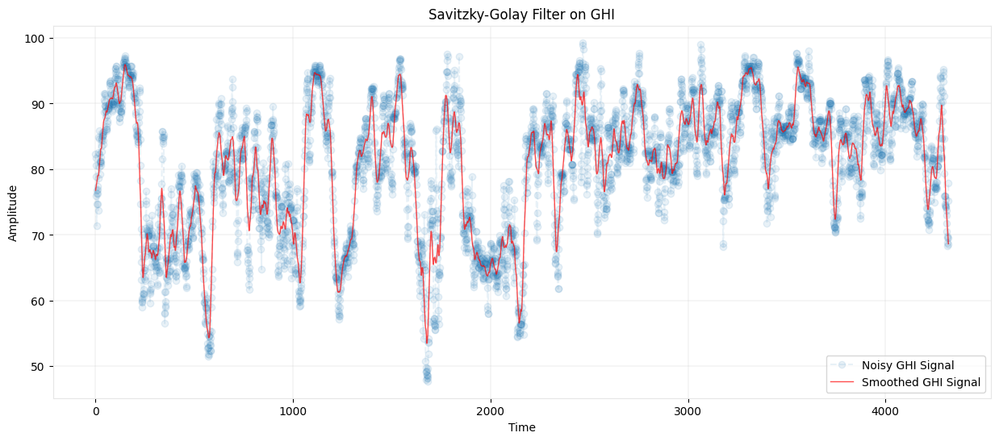

In [ ]:
# @title Savitzky-Golay

import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter

# Generate a noisy sine wave signal
np.random.seed(0)  # For reproducibility
t = range(len(weather_data.iloc[:180*24]))
signal = weather_data['shortwave_radiation'].iloc[:180*24]

# Apply the Savitzky-Golay filter
window_length = 24  # Must be an odd number
polyorder = 1  # The degree of the polynomial used to fit the samples
smoothed_signal = savgol_filter(signal, window_length, polyorder)

# Plot the original and smoothed signals
plt.figure(figsize=(15, 6))
ax = plt.axes()
plt.plot(t, signal, label='Noisy GHI Signal', linestyle='--', marker='o', alpha = 0.1)
plt.plot(t, smoothed_signal, label='Smoothed GHI Signal', color='red', linewidth=1, alpha = 0.7)
plot_cosmos(ax,'Time','Amplitude',f'Savitzky-Golay Filter on GHI')
# plt.title('Savitzky-Golay Filter')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()
plt.show()


In [ ]:
# @title SARIMAX modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data[weather_data['ll_label'] == ll]
  sarimax_model = sm.tsa.SARIMAX(np.array(temp[TARGET_FEATURES[1]].iloc[1:-24]),
                                order=(6, 2, 6),
                                seasonal_order=(0, 0, 0, int(1/0.00102646)),
                                enforce_stationarity=True,
                                enforce_invertibility=True,
                                time_varying_regression = True,
                                mle_regression = False,
                                exog=np.array(temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[0:-25,:]))
  sarimax_fit = sarimax_model.fit(disp=True)

  with open(f'GHI_{ll}_forecast.pkl', 'wb') as file:
      pickle.dump(sarimax_model, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_{ll}_forecast.pkl'

  source_file_name = f'GHI_{ll}_forecast.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break
sarimax_fit.summary()
res = sarimax_model.filter(sarimax_fit.params)
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# Graph
fig, ax = plt.subplots(figsize=(15,4))
npre = 4

# Plot predictions
# predict.predicted_mean[-100:].plot(ax=ax, style='r--', label='One-step-ahead forecast')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:])), predict.predicted_mean[-100:], color = 'tomato', label = 'forecast', linestyle = '--')
ci = predict_ci[-100:]
ax.fill_between(range(len(temp[TARGET_FEATURES[1]].iloc[-100:])), ci[:,0], ci[:,1], color='r', alpha=0.1)
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:])), temp[TARGET_FEATURES[1]].iloc[-125:-25], color = '#76D7C4', label = 'Historical')
legend = ax.legend(loc='lower right')
plot_cosmos(ax,'Hours','GHI','GHI Forecast')
plt.legend()
plt.show()
# Make predictions
predictions = sarimax_fit.forecast(steps=24, exog = temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-48:-24,:])
predict = sarimax_fit.predict(steps=24, exog = temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-48:-24,:])
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24])), temp[TARGET_FEATURES[1]].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), temp[TARGET_FEATURES[1]].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), predictions, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','GHI','GHI Forecast')
plt.legend()
plt.show()

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast.pkl, None>
File GHI_0_forecast.pkl uploaded to avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast.pkl.


In [ ]:
# @title ARIMAX modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data[weather_data['ll_label'] == ll]
  arimax_model = sm.tsa.SARIMAX(np.array(temp[TARGET_FEATURES[1]].iloc[-2000:-24]),
                                order=(6, 0, 3),
                                # seasonal_order=(0, 0, 0, int(1/0.001)),
                                exog=np.array(temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-2000:-24,:]))
  sarimax_fit_arimax = arimax_model.fit(disp=True)

  with open(f'GHI_{ll}_forecast_ARIMAX.pkl', 'wb') as file:
      pickle.dump(sarimax_fit_arimax, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_{ll}_forecast_ARIMAX.pkl'

  source_file_name = f'GHI_{ll}_forecast_ARIMAX.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break

<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_ARIMAX.pkl, None>
File GHI_0_forecast_ARIMAX.pkl uploaded to avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_ARIMAX.pkl.


In [ ]:
sarimax_fit_arimax.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 1976
Model:               SARIMAX(6, 0, 3)   Log Likelihood               23308.505
Date:                Tue, 09 Jul 2024   AIC                         -46591.010
Time:                        15:45:26   BIC                         -46518.355
Sample:                             0   HQIC                        -46564.316
                               - 1976                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             1.0000   9.29e-08   1.08e+07      0.000       1.000       1.000
x2         -8.574e-07   8.95e-08     -9.580      0.000   -1.03e-06   -6.82e-07
x3         -1.463e-06   1.54e-07     -9.481      0.000   -1.77e-06   -1.16e-06
ar.L1        3.26e-19   4.97e-13   6.57e-07      1.000   -9.73e-13    9.73e-13
ar.L2       6.303e-19      5e-13   1.26e-06      1.000   -9.79e-13    9.79e-13
ar.L3       9.563e-19   4.92e-13   1.94e-06      1.000   -9.65e-13    9.65e-13
ar.L4       1.239e-18   4.65e-13   2.66e-06      1.000   -9.12e-13    9.12e-13
ar.L5       1.565e-18   4.38e-13   3.58e-06      1.000   -8.58e-13    8.58e-13
ar.L6       1.869e-18    3.9e-13    4.8e-06      1.000   -7.63e-13    7.63e-13
ma.L1       -3.26e-19   4.97e-13  -6.57e-07      1.000   -9.73e-13    9.73e-13
ma.L2      -6.303e-19      5e-13  -1.26e-06      1.000   -9.79e-13    9.79e-13
ma.L3      -9.563e-19   4.92e-13  -1.94e-06      1.000   -9.65e-13    9.65e-13
sigma2      2.307e-12   5.11e-11      0.045      0.964   -9.78e-11    1.02e-10
===================================================================================
Ljung-Box (L1) (Q):                1749.68   Jarque-Bera (JB):                52.20
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.75   Skew:                            -0.40
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.01
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 7.18e+27. Standard errors may be unstable.
"""

In [ ]:
# Make predictions
predictions_arimax = sarimax_fit_arimax.forecast(steps=24, exog = temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-24:,:])

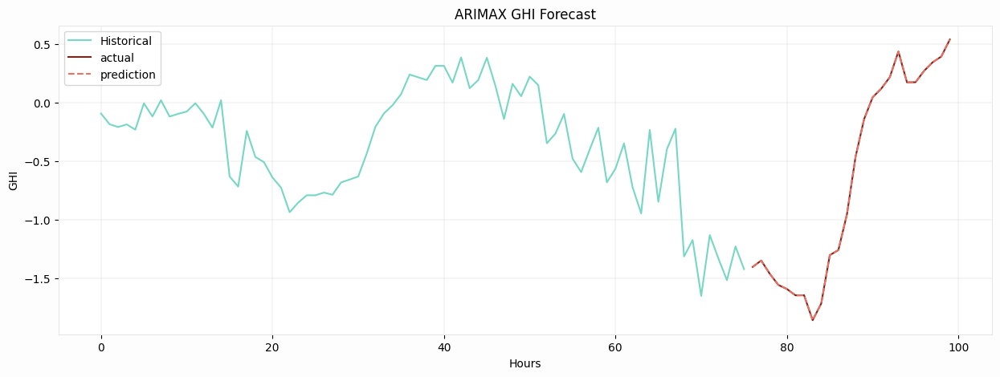

In [ ]:
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24])), temp[TARGET_FEATURES[1]].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), temp[TARGET_FEATURES[1]].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), predictions_arimax, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','GHI','ARIMAX GHI Forecast')
plt.legend()
plt.show()

<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_SARIMAA.pkl, None>
File GHI_0_forecast_SARIMA.pkl uploaded to avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_SARIMAA.pkl.


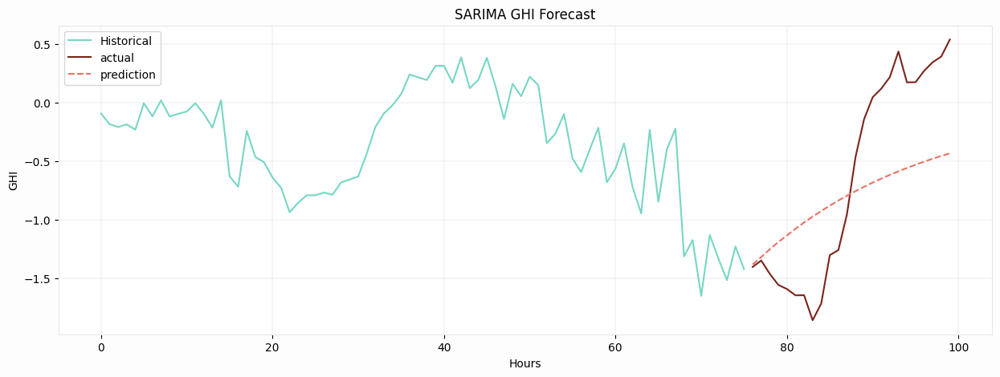

In [ ]:
# @title SARIMA modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data[weather_data['ll_label'] == ll]
  sarima_model = sm.tsa.SARIMAX(np.array(temp[TARGET_FEATURES[1]].iloc[:-24]),
                                order=(6, 0, 3),
                                seasonal_order=(0, 0, 0, int(1/0.001))
                                # exog=np.array(temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-2000:-24,:])
                                )
  sarimax_fit_sarima = sarima_model.fit(disp=True)

  with open(f'GHI_{ll}_forecast_SARIMA.pkl', 'wb') as file:
      pickle.dump(sarimax_fit_sarima, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_{ll}_forecast_SARIMAA.pkl'

  source_file_name = f'GHI_{ll}_forecast_SARIMA.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break
sarimax_fit_sarima.summary()
# Make predictions
predictions_sarima = sarimax_fit_sarima.forecast(steps=24)
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24])), temp[TARGET_FEATURES[1]].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), temp[TARGET_FEATURES[1]].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), predictions_sarima, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','GHI','SARIMA GHI Forecast')
plt.legend()
plt.show()

# TEMPERATURE

In [ ]:
QUERY = f'''SELECT 0 as ll_label,* FROM revx-259410.Avishek_Explore.weather_data_UK_overall; '''
query_job = client.query(QUERY)  # API request
weather_data = query_job.result().to_dataframe()
weather_data.sort_values(['ll_label','date_hour'], ascending = True, inplace = True)
weather_data.drop_duplicates(inplace = True)

In [ ]:
weather_data.fillna(0,inplace = True)

## Temperature Analysis - UK

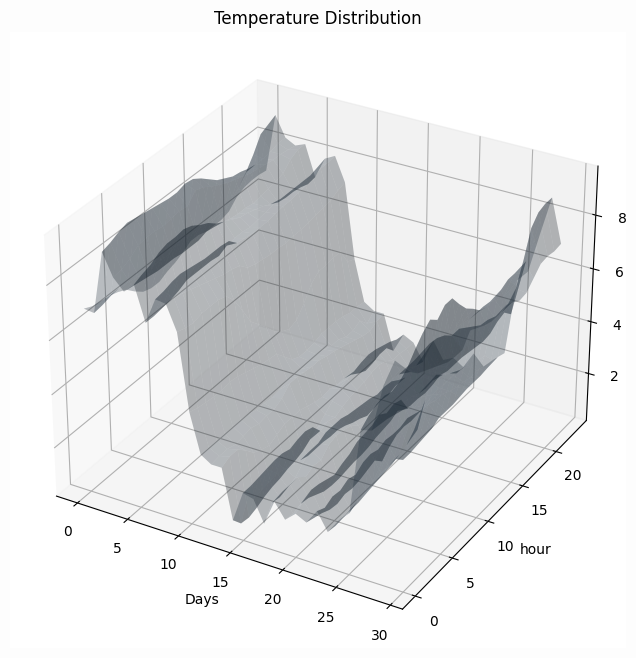

In [ ]:
# @title Temperature Distribution UK

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import pandas as pd

from sklearn.preprocessing import LabelEncoder

# Initialize the LabelEncoder
label_encoder = LabelEncoder()
weather_data['date'] = weather_data['date_hour'].dt.date
# Encode 'color' column
weather_data['date_encoded'] = label_encoder.fit_transform(weather_data['date'])

# Pivot the data to get 2D arrays
pivot_table = weather_data.iloc[:24*30].pivot(index='hour', columns='date_encoded', values='temperature_2m').fillna(0)

# Ensure X, Y, and Z are 2D arrays
X, Y = np.meshgrid(pivot_table.columns, pivot_table.index)
Z = pivot_table.values

X = np.asarray(X, dtype=int)
Y = np.asarray(Y, dtype=int)
Z = np.asarray(Z, dtype=float)

if np.isnan(Z).any():
    print("Warning: Data contains NaN values.")
    Z = np.nan_to_num(Z)  # Replace NaNs with zero

# Create figure and 3D axis
fig = plt.figure(figsize = (30,8))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
ax.plot_surface(X, Y, Z,  alpha = 0.3, color = '#273746')

# Add labels
ax.set_xlabel('Date')
ax.set_ylabel('Hour')
ax.set_zlabel('Temperature')

# Optionally, add a title or custom function for additional customization
ax.set_title('Temperature Distribution')

plot_cosmos(ax,'Days','hour','Temperature Distribution')

# Show the plot
plt.show()

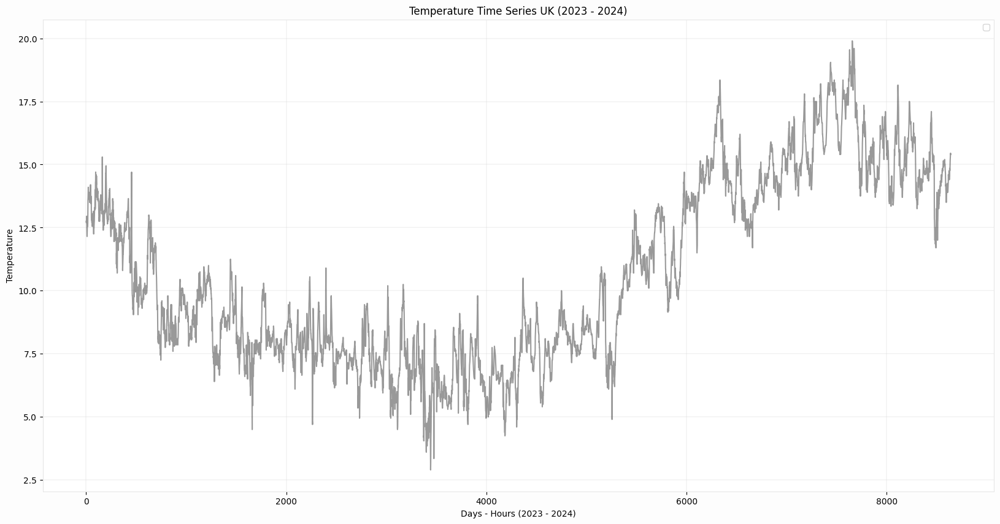

In [ ]:
fig = plt.figure(figsize = (20,10))
ax = plt.axes()

plt.plot(range(len(weather_data))[0:30*24*12],weather_data['temperature_2m'].values[-30*12*24:], alpha = 0.4, color = 'black')
plt.legend()
plot_cosmos(ax,'Days - Hours (2023 - 2024)','Temperature','Temperature Time Series UK (2023 - 2024)')
plt.show()

In [ ]:
weather_data['date_hour'].values[-30*36*24:].max()

numpy.datetime64('2024-07-01T23:00:00.000000')

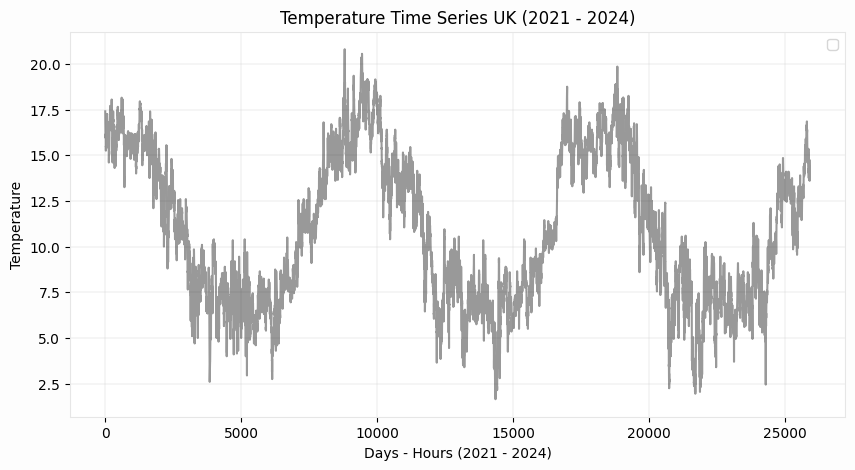

In [ ]:
fig = plt.figure(figsize = (10,5))
ax = plt.axes()

plt.plot(range(len(weather_data))[0:30*24*36],weather_data['temperature_2m'].values[-30*36*24:], alpha = 0.4, color = 'black')
plt.legend()
plot_cosmos(ax,'Days - Hours (2021 - 2024)','Temperature','Temperature Time Series UK (2021 - 2024)')
plt.show()

In [ ]:
i = 0
for c in weather_data.columns:
  print(f"'{c}'",end = ', ')
  i += 1
  if i%6 == 0:
    print('\n')

'll_label', 'date_hour', 'temperature_2m', 'relative_humidity_2m', 'dew_point_2m', 'apparent_temperature', 

'precipitation', 'rain', 'snowfall', 'snow_depth', 'weather_code', 'pressure_msl', 

'surface_pressure', 'cloud_cover', 'cloud_cover_low', 'cloud_cover_mid', 'cloud_cover_high', 'et0_fao_evapotranspiration', 

'vapour_pressure_deficit', 'wind_speed_10m', 'wind_speed_100m', 'wind_direction_10m', 'wind_direction_100m', 'wind_gusts_10m', 

'soil_temperature_0_to_7cm', 'soil_temperature_7_to_28cm', 'soil_temperature_28_to_100cm', 'soil_temperature_100_to_255cm', 'soil_moisture_0_to_7cm', 'soil_moisture_7_to_28cm', 

'soil_moisture_28_to_100cm', 'soil_moisture_100_to_255cm', 'shortwave_radiation', 'direct_radiation', 'diffuse_radiation', 'direct_normal_irradiance', 

'global_tilted_irradiance', 'terrestrial_radiation', 'shortwave_radiation_instant', 'direct_radiation_instant', 'diffuse_radiation_instant', 'direct_normal_irradiance_instant', 

'global_tilted_irradiance_instant', 'terr

In [ ]:
weather_data.fillna(0,inplace = True)

In [ ]:
TIME_FEATURE = ['date_hour']
TARGET_FEATURES = ['temperature_2m','shortwave_radiation']
FEATURES = ['relative_humidity_2m', 'dew_point_2m', 'apparent_temperature',
'precipitation', 'rain', 'snowfall', 'snow_depth', 'weather_code', 'pressure_msl',
'surface_pressure', 'cloud_cover', 'cloud_cover_low', 'cloud_cover_mid', 'cloud_cover_high', 'et0_fao_evapotranspiration',
'vapour_pressure_deficit', 'wind_speed_10m', 'wind_speed_100m', 'wind_direction_10m', 'wind_direction_100m', 'wind_gusts_10m',
'soil_temperature_0_to_7cm', 'soil_temperature_7_to_28cm', 'soil_temperature_28_to_100cm', 'soil_temperature_100_to_255cm',
'soil_moisture_0_to_7cm', 'soil_moisture_7_to_28cm',
'soil_moisture_28_to_100cm', 'soil_moisture_100_to_255cm', 'shortwave_radiation',
'direct_radiation', 'diffuse_radiation', 'direct_normal_irradiance',
'global_tilted_irradiance', 'terrestrial_radiation', 'shortwave_radiation_instant',
'direct_radiation_instant', 'diffuse_radiation_instant', 'direct_normal_irradiance_instant',
'global_tilted_irradiance_instant', 'terrestrial_radiation_instant']

GEO_FEATURES = ['ll_label']

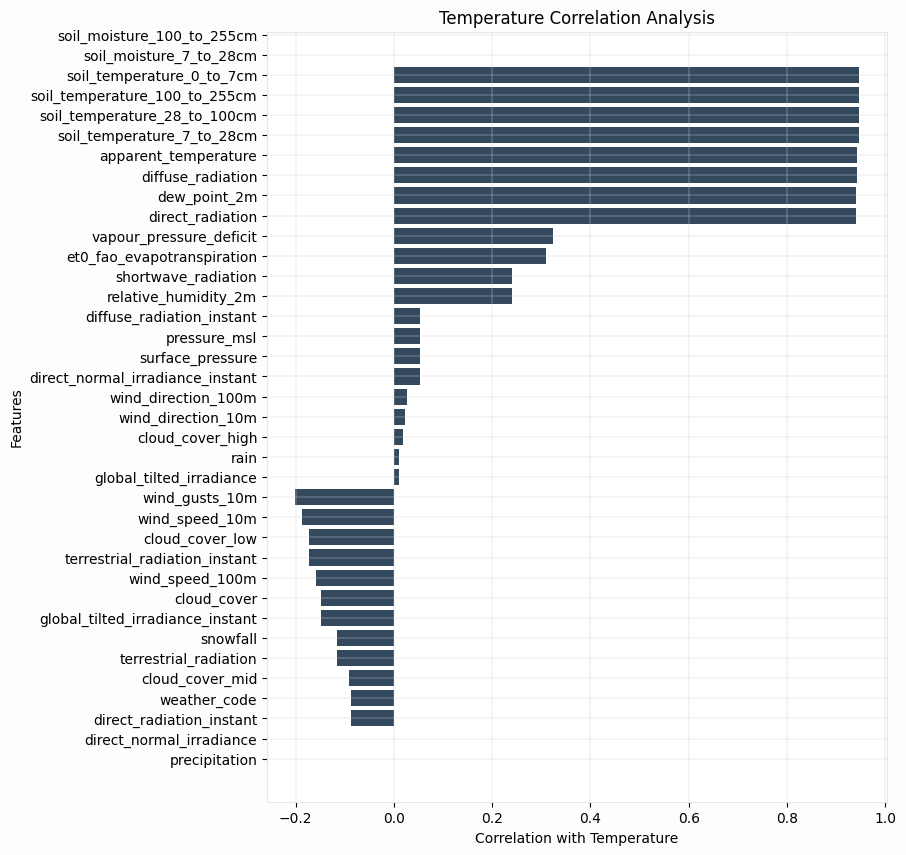

In [ ]:
# @title Features Importance Analysis
# @markdown Which features can help us determine GHI accuartely?

from scipy.stats import pearsonr

# # Calculate Pearson correlation coefficient
# pearson_correlation, p_value = pearsonr(x, y)

# print("Pearson Correlation Coefficient:", pearson_correlation)
# print("P-value:", p_value)

corr_list = []
corr_col = []

for col in FEATURES:
  corr_list.append(pearsonr(weather_data[col],weather_data[TARGET_FEATURES[0]])[0])
  corr_col.append(col)

corr_df = pd.DataFrame(np.array([corr_col,corr_list]).T , columns = ['Features','Correlation with Temperature'])
corr_df.sort_values('Correlation with Temperature',ascending = True,inplace = True)
corr_df['Correlation with Temperature'] = corr_df['Correlation with Temperature'].astype(float)

fig = plt.figure(figsize = (8,10))
ax = plt.axes()
plt.barh(corr_df['Features'],corr_df['Correlation with Temperature'], color = '#34495e')
plot_cosmos(ax,'Correlation with Temperature','Features','Temperature Correlation Analysis')

In [ ]:
corr_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 120 entries, 83 to 0
Data columns (total 2 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   Features                      120 non-null    object
 1   Correlation with Temperature  120 non-null    object
dtypes: object(2)
memory usage: 2.8+ KB


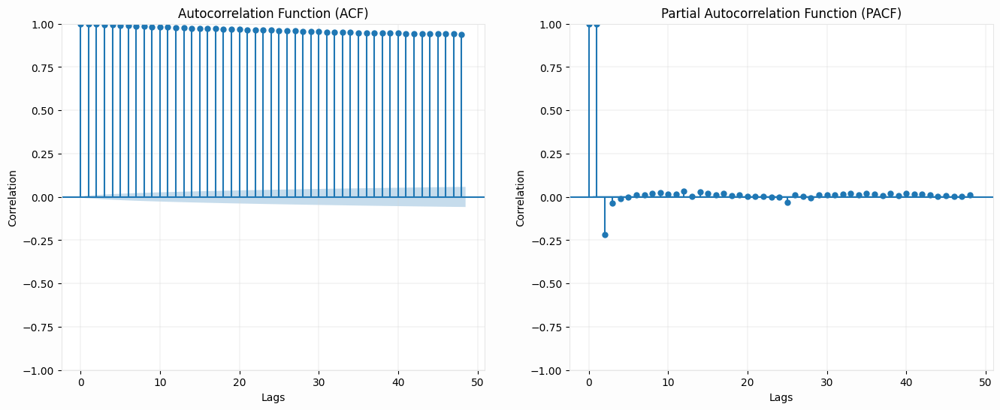

In [ ]:
# @title ACF and PACF

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()

# Loop through each unique location
for ll in unique_locations:
    # Filter the data for the specific location
    location_data = weather_data[(weather_data['ll_label'] == ll) ]

    # Extract the temperature_2m series for ACF and PACF
    temp_series = location_data['temperature_2m'].dropna()

    # Plot ACF and PACF
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    # fig.suptitle(f'Location: ({ll})', fontsize=16)

    plot_acf(temp_series, ax=axes[0], lags=48)
    plot_cosmos(axes[0],'Lags','Correlation','Autocorrelation Function (ACF)')

    plot_pacf(temp_series, ax=axes[1], lags=48)
    plot_cosmos(axes[1],'Lags','Correlation','Partial Autocorrelation Function (PACF)')

    plt.show()

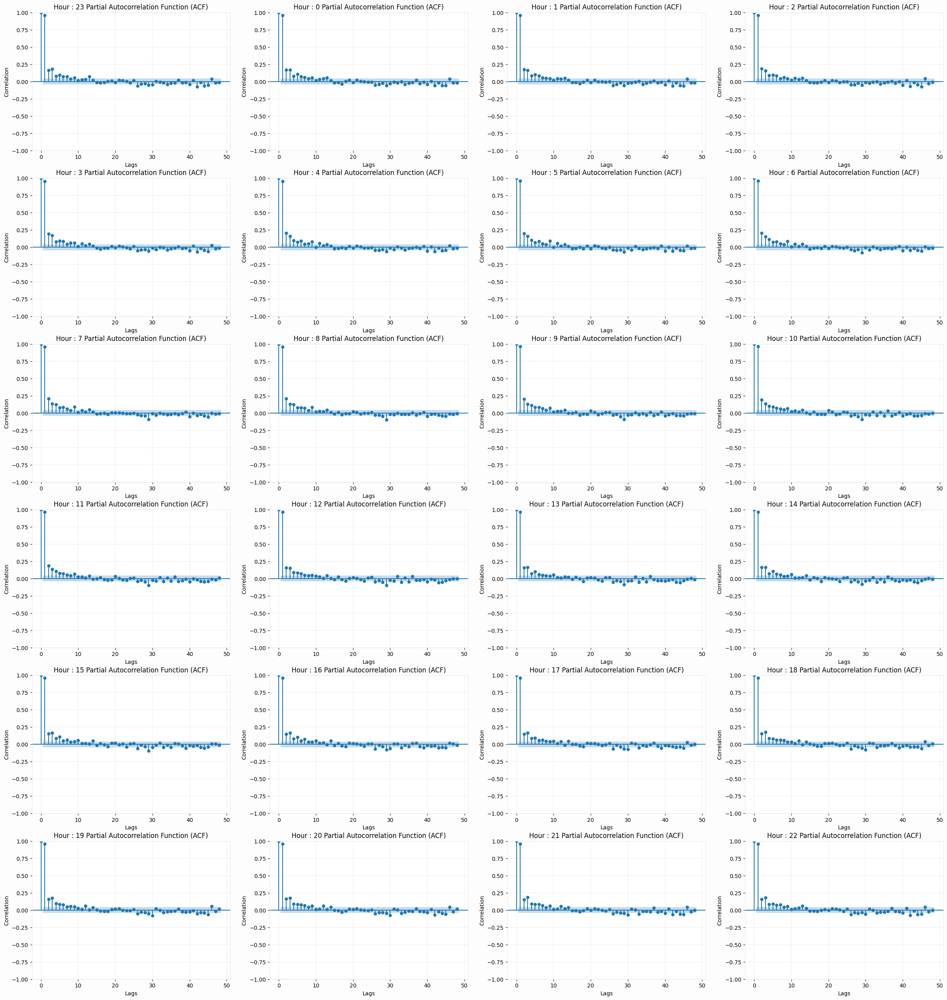

In [ ]:
# @title ACF and PACF

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

weather_data['ll_label'] = 0

# Get unique latitude and longitude combinations
hours = weather_data['hour'].unique()

fig, axes = plt.subplots(6, 4, figsize=(30, 32))
i = 0
j = 0

# Loop through each unique location
for h in hours:
    # Filter the data for the specific location
    location_data = weather_data[(weather_data['hour'] == h) ]

    # Extract the temperature_2m series for ACF and PACF
    temp_series = location_data['temperature_2m'].dropna()

    # Plot ACF and PACF

    # fig.suptitle(f'Location: ({ll})', fontsize=16)

    plot_pacf(temp_series, ax=axes[i][j], lags=48)
    plot_cosmos(axes[i][j],'Lags','Correlation',f'Hour : {h} Partial Autocorrelation Function (ACF)')
    j+=1
    # plot_pacf(temp_series, ax=axes[i][j], lags=48)
    # plot_cosmos(axes[i][j],'Lags','Correlation',f'Hour : {h} Partial Autocorrelation Function (PACF)')

    if j > 3:
      i += 1
      j = 0

plt.show()

In [ ]:
# @title Stationarity Test (Augmented Dickey Fuller)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller

# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()

# Loop through each unique location
for ll in unique_locations:
    # Filter the data for the specific location
    location_data = weather_data[(weather_data['ll_label'] == ll) ]

    # Extract the temperature_2m series for ACF and PACF
    temp_series = location_data['temperature_2m'].dropna()

    # # Plot ACF and PACF
    # fig, axes = plt.subplots(1, 1, figsize=(16, 6))
    # fig.suptitle(f'Location: ({ll})', fontsize=16)

    # # Plot the time series
    # plt.plot(range(len(temp_series)),temp_series, alpha = 0.3, color = 'tomato')

    # plot_cosmos(axes,'time','GHI',f'GHI Time Series')

    # Perform the Augmented Dickey-Fuller test
    result = adfuller(temp_series)

    # Output the results
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

    # Interpretation
    if result[1] > 0.05:
        print("Fail to reject the null hypothesis (non-stationary).")
    else:
        print("Reject the null hypothesis (stationary).")

    plt.show()


ADF Statistic: -5.814756628629071
p-value: 4.318398216180401e-07
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567
Reject the null hypothesis (stationary).


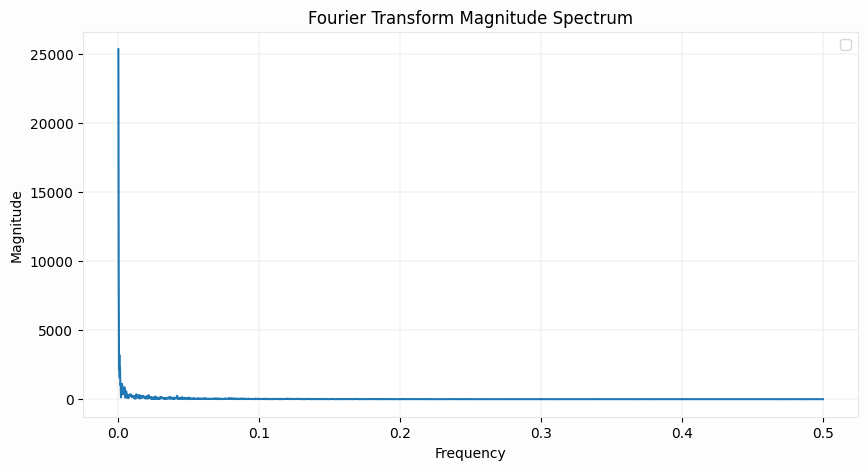

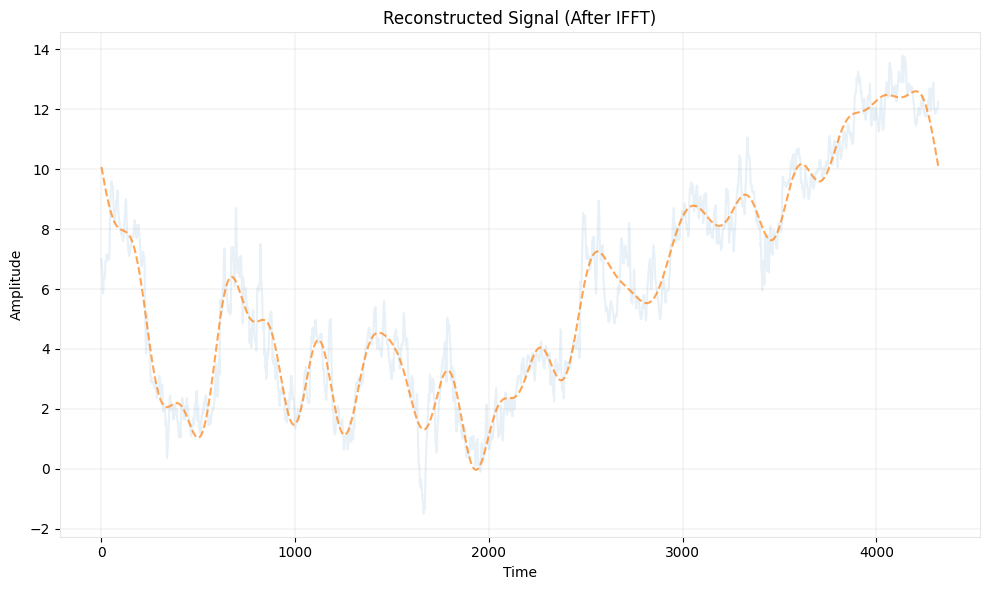

In [ ]:
# @title Seasonality Test using FFT
filtered_data = weather_data[(weather_data['country'] == 'UK')]

# Get unique latitude and longitude combinations
unique_locations = filtered_data['ll_label'].unique()

fourier_locs = dict()
fig,ax = plt.subplots(1,1,figsize=(10, 5))
# ax1 = plt.axes()
# Loop through each unique location
i = 0
j = 0
k = 0
for ll in unique_locations:

    # Filter the data for the specific location
    location_data = filtered_data[(filtered_data['ll_label'] == ll)]
    time_series = location_data['temperature_2m'].dropna()[0:180*24]


    # Assuming `time_series` is your time series data
    fft_result = np.fft.fft(time_series)
    fft_freq = np.fft.fftfreq(len(time_series))

    # Only keep the positive frequencies (the FFT result is symmetric)
    positive_frequencies = fft_freq[:len(fft_freq)//2]
    positive_fft_result = np.abs(fft_result[:len(fft_result)//2])

    fourier_locs[ll] = {'fft_result': fft_result, 'fft_freq': fft_freq}

    # Plotting the magnitude spectrum

    plt.plot(positive_frequencies, positive_fft_result)
    plot_cosmos(ax,'Frequency','Magnitude',f'Fourier Transform Magnitude Spectrum')
    ax.legend()

    k += 1

    if k >= 2:
        k = 0
        j+=1


# plot_cosmos(ax1,'Frequency','Magnitude','Magnitude Spectrum')
plt.show()

magnitudes = np.abs(fft_result)

top_n = 30
# Find indices of the top N frequencies
top_indices = np.argsort(magnitudes)[-top_n:]

# Create a new FFT result array, keeping only the top frequencies
filtered_fft_result = np.zeros_like(fft_result)
filtered_fft_result[top_indices] = fft_result[top_indices]

# Perform Inverse Fast Fourier Transform (IFFT) using only the top frequencies
reconstructed_signal = np.fft.ifft(filtered_fft_result)


# Plot the original and reconstructed signals
plt.figure(figsize=(10, 6))
ax = plt.axes()

plt.plot(range(len(time_series)), time_series, label='Original Signal', alpha = 0.1)
plt.plot(range(len(reconstructed_signal)), reconstructed_signal.real, label='Reconstructed Signal', linestyle='--', alpha = 0.7)

plot_cosmos(ax,'Time','Amplitude',f'Reconstructed Signal (After IFFT)')

plt.tight_layout()
plt.show()

In [ ]:
for k,v in fourier_locs.items():
  top_indices = np.argpartition(-fourier_locs[k]['fft_result'], 3)[:3]
  print(top_indices)
  # print(np.argmax(fourier_locs[k]['fft_result'].real))
  # print(fourier_locs[k]['fft_result'].real)
  print(fourier_locs[k]['fft_freq'][top_indices])

[   0 4319    1]
[ 0.         -0.00023148  0.00023148]


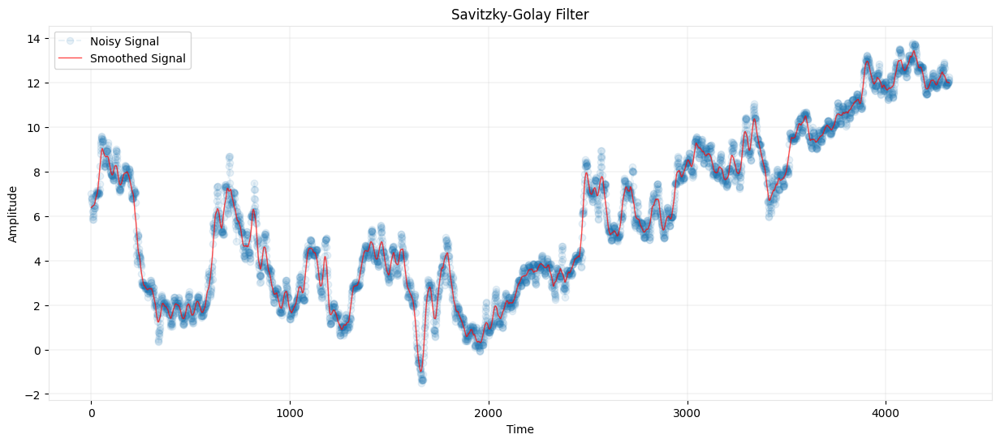

In [ ]:
# @title Savitzky-Golay

import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter

# Generate a noisy sine wave signal
np.random.seed(0)  # For reproducibility
t = range(len(weather_data.iloc[:180*24]))
signal = weather_data['temperature_2m'].iloc[:180*24]

# Apply the Savitzky-Golay filter
window_length = 24  # Must be an odd number
polyorder = 1  # The degree of the polynomial used to fit the samples
smoothed_signal = savgol_filter(signal, window_length, polyorder)

# Plot the original and smoothed signals
plt.figure(figsize=(15, 6))
ax = plt.axes()
plt.plot(t, signal, label='Noisy Signal', linestyle='--', marker='o', alpha = 0.1)
plt.plot(t, smoothed_signal, label='Smoothed Signal', color='red', linewidth=1, alpha = 0.7)
plot_cosmos(ax,'Time','Amplitude',f'Savitzky-Golay Filter')
plt.title('Savitzky-Golay Filter')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()
plt.show()


In [ ]:
# @title SARIMAX modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data[weather_data['ll_label'] == ll]
  sarimax_model = sm.tsa.SARIMAX(np.array(temp[TARGET_FEATURES[0]].iloc[1:-24]),
                                order=(6, 2, 6),
                                seasonal_order=(0, 0, 0, int(1/0.00102646)),
                                enforce_stationarity=True,
                                enforce_invertibility=True,
                                time_varying_regression = True,
                                mle_regression = False,
                                exog=np.array(temp[['relative_humidity_2m','shortwave_radiation','vapour_pressure_deficit']].iloc[0:-25,:]))
  sarimax_fit = sarimax_model.fit(disp=True)

  with open(f'GHI_{ll}_forecast.pkl', 'wb') as file:
      pickle.dump(sarimax_model, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/GHI/models/temperature_sarimax_{ll}_forecast.pkl'

  source_file_name = f'GHI_{ll}_forecast.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break

<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/GHI/models/temperature_sarimax_0_forecast.pkl, None>
File GHI_0_forecast.pkl uploaded to avishek/body/Research/weather_forecast/experiment/GHI/models/temperature_sarimax_0_forecast.pkl.


In [ ]:
sarimax_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:               100775
Model:               SARIMAX(6, 2, 6)   Log Likelihood              -63023.060
Date:                Sat, 24 Aug 2024   AIC                         126078.121
Time:                        14:45:10   BIC                         126230.450
Sample:                             0   HQIC                        126124.333
                             - 100775                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1       4.852e-07      0.173    2.8e-06      1.000      -0.340       0.340
ar.L2       2.685e-06      0.453   5.92e-06      1.000      -0.889       0.889
ar.L3       3.555e-06      0.784   4.53e-06      1.000      -1.537       1.537
ar.L4       2.983e-06      1.131   2.64e-06      1.000      -2.216       2.216
ar.L5       4.365e-06      1.468   2.97e-06      1.000      -2.877       2.877
ar.L6       3.587e-06      1.766   2.03e-06      1.000      -3.462       3.462
ma.L1         -0.0088      0.328     -0.027      0.979      -0.652       0.634
ma.L2         -0.0086      0.365     -0.024      0.981      -0.725       0.707
ma.L3         -0.0085      0.326     -0.026      0.979      -0.648       0.631
ma.L4         -0.0089      0.340     -0.026      0.979      -0.674       0.657
ma.L5         -0.0089      0.354     -0.025      0.980      -0.703       0.686
ma.L6         -0.0088      0.329     -0.027      0.979      -0.653       0.635
var.x1      2.774e-05   2.82e-05      0.984      0.325   -2.75e-05     8.3e-05
var.x2      2.761e-05   2.82e-05      0.980      0.327   -2.76e-05    8.28e-05
var.x3         0.9991      0.069     14.579      0.000       0.865       1.133
sigma2         0.0427      0.023      1.866      0.062      -0.002       0.088
===================================================================================
Ljung-Box (L1) (Q):                 593.41   Jarque-Bera (JB):            815449.01
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               2.18   Skew:                            -0.18
Prob(H) (two-sided):                  0.00   Kurtosis:                        16.93
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 7.12e+17. Standard errors may be unstable.
"""

In [ ]:
res = sarimax_model.filter(sarimax_fit.params)
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()

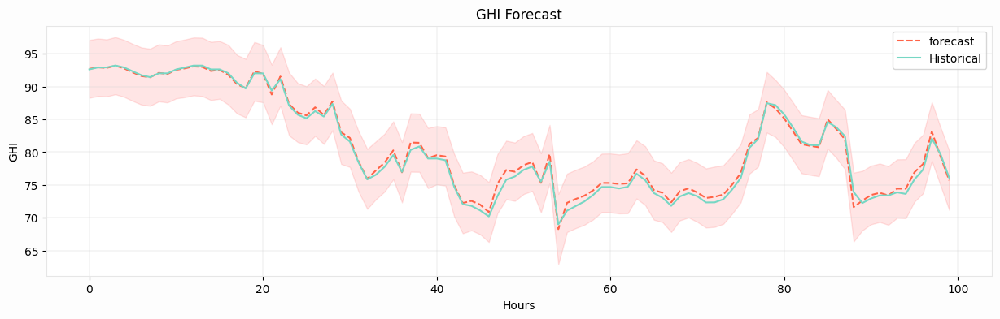

In [ ]:
# Graph
fig, ax = plt.subplots(figsize=(15,4))
npre = 4

# Plot predictions
# predict.predicted_mean[-100:].plot(ax=ax, style='r--', label='One-step-ahead forecast')
plt.plot(range(len(temp[TARGET_FEATURES[0]].iloc[-100:])), predict.predicted_mean[-100:], color = 'tomato', label = 'forecast', linestyle = '--')
ci = predict_ci[-100:]
ax.fill_between(range(len(temp[TARGET_FEATURES[1]].iloc[-100:])), ci[:,0], ci[:,1], color='r', alpha=0.1)
plt.plot(range(len(temp[TARGET_FEATURES[0]].iloc[-100:])), temp[TARGET_FEATURES[1]].iloc[-125:-25], color = '#76D7C4', label = 'Historical')
legend = ax.legend(loc='lower right')
plot_cosmos(ax,'Hours','GHI','GHI Forecast')
plt.legend()
plt.show()

In [ ]:
# Make predictions
predictions = sarimax_fit.forecast(steps=24, exog = temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-48:-24,:])
predict = sarimax_fit.predict(steps=24, exog = temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-48:-24,:])

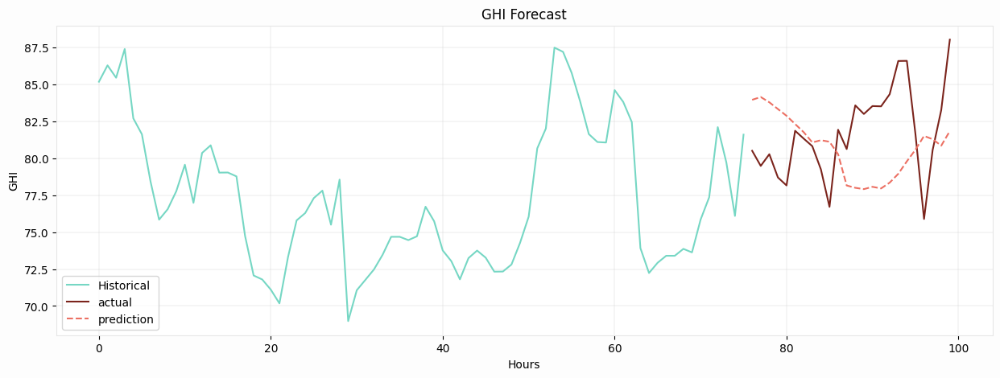

In [ ]:
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24])), temp[TARGET_FEATURES[1]].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), temp[TARGET_FEATURES[1]].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), predictions, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','GHI','GHI Forecast')
plt.legend()
plt.show()

In [ ]:
# @title ARIMAX modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data[weather_data['ll_label'] == ll]
  arimax_model = sm.tsa.SARIMAX(np.array(temp[TARGET_FEATURES[1]].iloc[-2000:-24]),
                                order=(6, 0, 3),
                                # seasonal_order=(0, 0, 0, int(1/0.001)),
                                exog=np.array(temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-2000:-24,:]))
  sarimax_fit_arimax = arimax_model.fit(disp=True)

  with open(f'GHI_{ll}_forecast_ARIMAX.pkl', 'wb') as file:
      pickle.dump(sarimax_fit_arimax, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_{ll}_forecast_ARIMAX.pkl'

  source_file_name = f'GHI_{ll}_forecast_ARIMAX.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break

<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_ARIMAX.pkl, None>
File GHI_0_forecast_ARIMAX.pkl uploaded to avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_ARIMAX.pkl.


In [ ]:
sarimax_fit_arimax.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 1976
Model:               SARIMAX(6, 0, 3)   Log Likelihood               23308.505
Date:                Tue, 09 Jul 2024   AIC                         -46591.010
Time:                        15:45:26   BIC                         -46518.355
Sample:                             0   HQIC                        -46564.316
                               - 1976                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             1.0000   9.29e-08   1.08e+07      0.000       1.000       1.000
x2         -8.574e-07   8.95e-08     -9.580      0.000   -1.03e-06   -6.82e-07
x3         -1.463e-06   1.54e-07     -9.481      0.000   -1.77e-06   -1.16e-06
ar.L1        3.26e-19   4.97e-13   6.57e-07      1.000   -9.73e-13    9.73e-13
ar.L2       6.303e-19      5e-13   1.26e-06      1.000   -9.79e-13    9.79e-13
ar.L3       9.563e-19   4.92e-13   1.94e-06      1.000   -9.65e-13    9.65e-13
ar.L4       1.239e-18   4.65e-13   2.66e-06      1.000   -9.12e-13    9.12e-13
ar.L5       1.565e-18   4.38e-13   3.58e-06      1.000   -8.58e-13    8.58e-13
ar.L6       1.869e-18    3.9e-13    4.8e-06      1.000   -7.63e-13    7.63e-13
ma.L1       -3.26e-19   4.97e-13  -6.57e-07      1.000   -9.73e-13    9.73e-13
ma.L2      -6.303e-19      5e-13  -1.26e-06      1.000   -9.79e-13    9.79e-13
ma.L3      -9.563e-19   4.92e-13  -1.94e-06      1.000   -9.65e-13    9.65e-13
sigma2      2.307e-12   5.11e-11      0.045      0.964   -9.78e-11    1.02e-10
===================================================================================
Ljung-Box (L1) (Q):                1749.68   Jarque-Bera (JB):                52.20
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.75   Skew:                            -0.40
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.01
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 7.18e+27. Standard errors may be unstable.
"""

In [ ]:
# Make predictions
predictions_arimax = sarimax_fit_arimax.forecast(steps=24, exog = temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-24:,:])

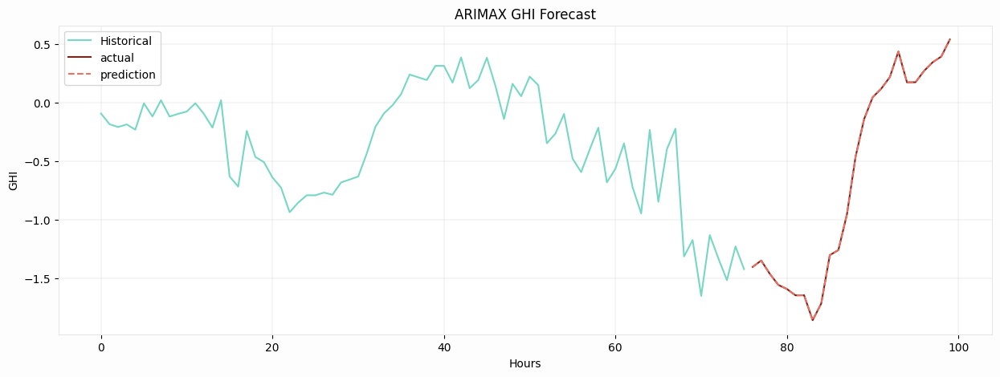

In [ ]:
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24])), temp[TARGET_FEATURES[1]].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), temp[TARGET_FEATURES[1]].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), predictions_arimax, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','GHI','ARIMAX GHI Forecast')
plt.legend()
plt.show()

<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_SARIMAA.pkl, None>
File GHI_0_forecast_SARIMA.pkl uploaded to avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_SARIMAA.pkl.


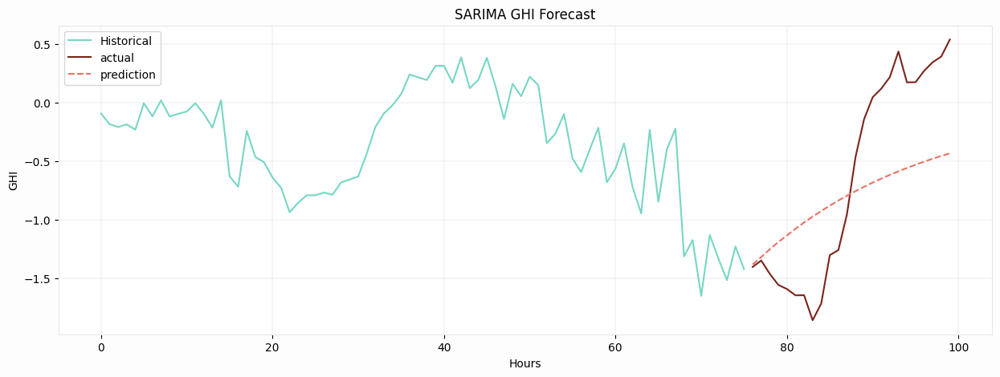

In [ ]:
# @title SARIMA modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data[weather_data['ll_label'] == ll]
  sarima_model = sm.tsa.SARIMAX(np.array(temp[TARGET_FEATURES[1]].iloc[:-24]),
                                order=(6, 0, 3),
                                seasonal_order=(0, 0, 0, int(1/0.001))
                                # exog=np.array(temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-2000:-24,:])
                                )
  sarimax_fit_sarima = sarima_model.fit(disp=True)

  with open(f'GHI_{ll}_forecast_SARIMA.pkl', 'wb') as file:
      pickle.dump(sarimax_fit_sarima, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_{ll}_forecast_SARIMAA.pkl'

  source_file_name = f'GHI_{ll}_forecast_SARIMA.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break
sarimax_fit_sarima.summary()
# Make predictions
predictions_sarima = sarimax_fit_sarima.forecast(steps=24)
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24])), temp[TARGET_FEATURES[1]].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), temp[TARGET_FEATURES[1]].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), predictions_sarima, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','GHI','SARIMA GHI Forecast')
plt.legend()
plt.show()

# Wind Speed Analysis - UK

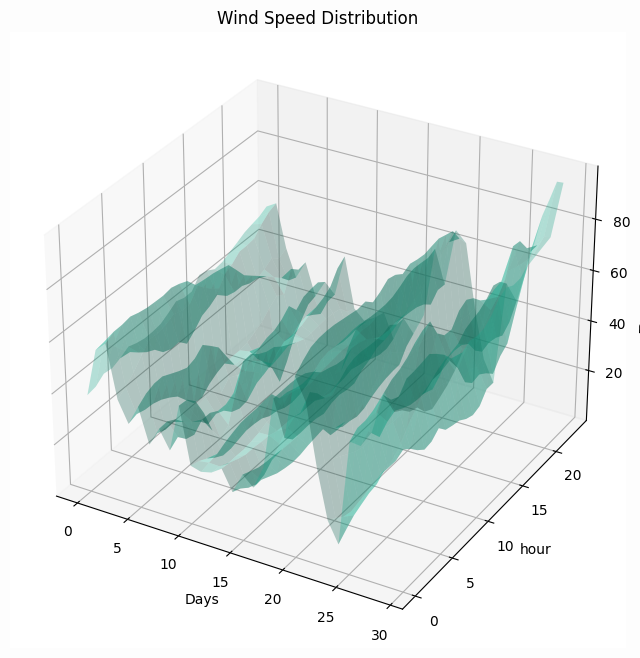

In [ ]:
# @title Wind Speed Distribution UK

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import pandas as pd

from sklearn.preprocessing import LabelEncoder

# Initialize the LabelEncoder
label_encoder = LabelEncoder()
weather_data['date'] = weather_data['date_hour'].dt.date
# Encode 'color' column
weather_data['date_encoded'] = label_encoder.fit_transform(weather_data['date'])

# Pivot the data to get 2D arrays
pivot_table = weather_data.iloc[:24*30].pivot(index='hour', columns='date_encoded', values='wind_speed_100m').fillna(0)

# Ensure X, Y, and Z are 2D arrays
X, Y = np.meshgrid(pivot_table.columns, pivot_table.index)
Z = pivot_table.values

X = np.asarray(X, dtype=int)
Y = np.asarray(Y, dtype=int)
Z = np.asarray(Z, dtype=float)

if np.isnan(Z).any():
    print("Warning: Data contains NaN values.")
    Z = np.nan_to_num(Z)  # Replace NaNs with zero

# Create figure and 3D axis
fig = plt.figure(figsize = (30,8))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
ax.plot_surface(X, Y, Z,  alpha = 0.3, color = '#1abc9c')

# Add labels
ax.set_xlabel('Date')
ax.set_ylabel('Hour')
ax.set_zlabel('Temperature')

# Optionally, add a title or custom function for additional customization
ax.set_title('Wind Speed Distribution')

plot_cosmos(ax,'Days','hour','Wind Speed Distribution')

# Show the plot
plt.show()

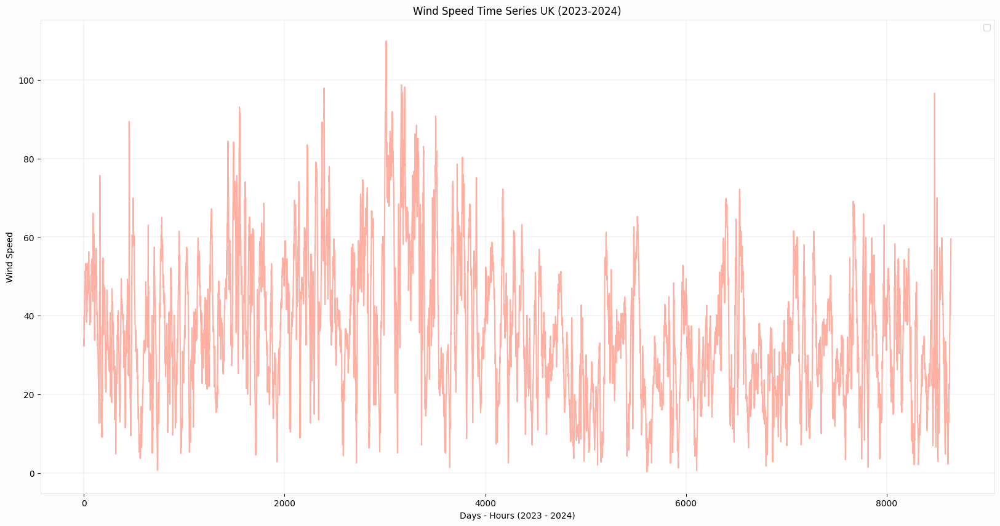

In [ ]:
fig = plt.figure(figsize = (20,10))
ax = plt.axes()

plt.plot(range(len(weather_data))[0:30*24*12],weather_data['wind_speed_100m'].values[-30*12*24:], alpha = 0.5, color = 'tomato')
plt.legend()
plot_cosmos(ax,'Days - Hours (2023 - 2024)','Wind Speed','Wind Speed Time Series UK (2023-2024)')
plt.show()

In [ ]:
i = 0
for c in weather_data.columns:
  print(f"'{c}'",end = ', ')
  i += 1
  if i%6 == 0:
    print('\n')

'll_label', 'date_hour', 'temperature_2m', 'relative_humidity_2m', 'dew_point_2m', 'apparent_temperature', 

'precipitation', 'rain', 'snowfall', 'snow_depth', 'weather_code', 'pressure_msl', 

'surface_pressure', 'cloud_cover', 'cloud_cover_low', 'cloud_cover_mid', 'cloud_cover_high', 'et0_fao_evapotranspiration', 

'vapour_pressure_deficit', 'wind_speed_10m', 'wind_speed_100m', 'wind_direction_10m', 'wind_direction_100m', 'wind_gusts_10m', 

'soil_temperature_0_to_7cm', 'soil_temperature_7_to_28cm', 'soil_temperature_28_to_100cm', 'soil_temperature_100_to_255cm', 'soil_moisture_0_to_7cm', 'soil_moisture_7_to_28cm', 

'soil_moisture_28_to_100cm', 'soil_moisture_100_to_255cm', 'shortwave_radiation', 'direct_radiation', 'diffuse_radiation', 'direct_normal_irradiance', 

'global_tilted_irradiance', 'terrestrial_radiation', 'shortwave_radiation_instant', 'direct_radiation_instant', 'diffuse_radiation_instant', 'direct_normal_irradiance_instant', 

'global_tilted_irradiance_instant', 'terr

In [ ]:
weather_data.fillna(0,inplace = True)

In [ ]:
TIME_FEATURE = ['date_hour']
TARGET_FEATURES = ['wind_speed_100m','shortwave_radiation']
FEATURES = [ 'temperature_2m', 'relative_humidity_2m', 'dew_point_2m', 'apparent_temperature',
'precipitation', 'rain', 'snowfall', 'snow_depth', 'weather_code', 'pressure_msl',
'surface_pressure', 'cloud_cover', 'cloud_cover_low', 'cloud_cover_mid', 'cloud_cover_high', 'et0_fao_evapotranspiration',
'vapour_pressure_deficit', 'wind_speed_10m', 'wind_speed_100m', 'wind_direction_10m', 'wind_direction_100m', 'wind_gusts_10m',
'soil_temperature_0_to_7cm', 'soil_temperature_7_to_28cm', 'soil_temperature_28_to_100cm', 'soil_temperature_100_to_255cm',
'soil_moisture_0_to_7cm', 'soil_moisture_7_to_28cm',
'soil_moisture_28_to_100cm', 'soil_moisture_100_to_255cm', 'shortwave_radiation',
'direct_radiation', 'diffuse_radiation', 'direct_normal_irradiance',
'global_tilted_irradiance', 'terrestrial_radiation', 'shortwave_radiation_instant',
'direct_radiation_instant', 'diffuse_radiation_instant', 'direct_normal_irradiance_instant',
'global_tilted_irradiance_instant', 'terrestrial_radiation_instant']

GEO_FEATURES = ['ll_label']

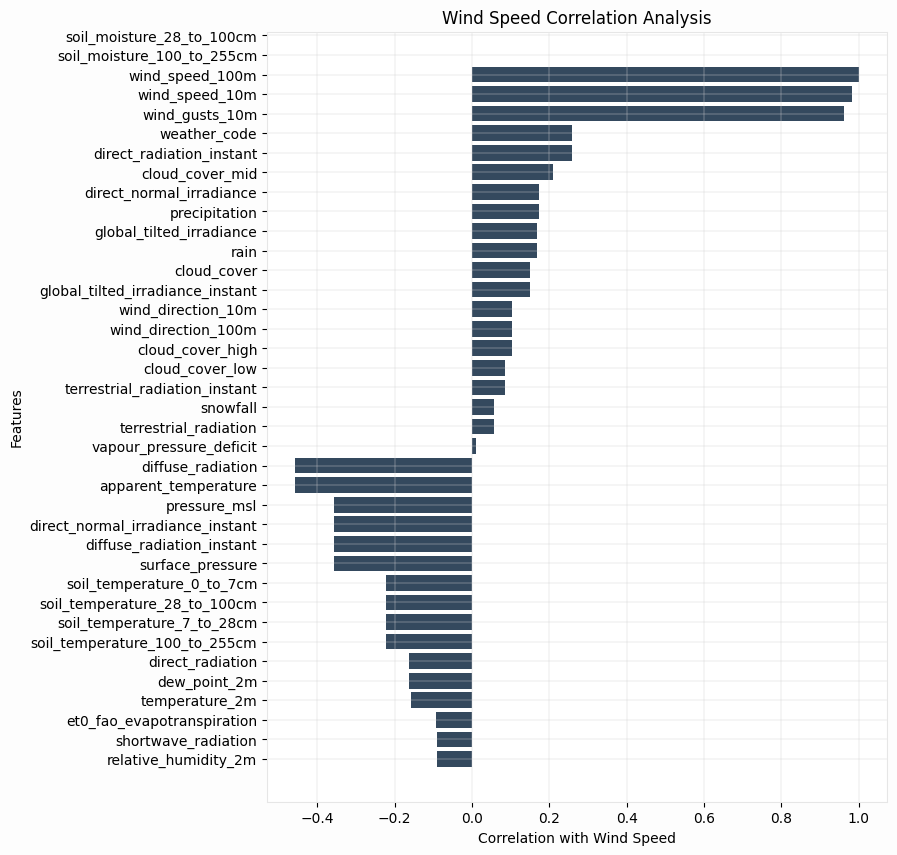

In [ ]:
# @title Features Importance Analysis
# @markdown Which features can help us determine GHI accuartely?

from scipy.stats import pearsonr

# # Calculate Pearson correlation coefficient
# pearson_correlation, p_value = pearsonr(x, y)

# print("Pearson Correlation Coefficient:", pearson_correlation)
# print("P-value:", p_value)

corr_list = []
corr_col = []

for col in FEATURES:
  corr_list.append(pearsonr(weather_data[col],weather_data[TARGET_FEATURES[0]])[0])
  corr_col.append(col)

corr_df = pd.DataFrame(np.array([corr_col,corr_list]).T , columns = ['Features','Correlation with Wind Speed'])
corr_df.sort_values('Correlation with Wind Speed',ascending = True,inplace = True)
corr_df['Correlation with Wind Speed'] = corr_df['Correlation with Wind Speed'].astype(float)

fig = plt.figure(figsize = (8,10))
ax = plt.axes()
plt.barh(corr_df['Features'],corr_df['Correlation with Wind Speed'], color = '#34495e')
plot_cosmos(ax,'Correlation with Wind Speed','Features','Wind Speed Correlation Analysis')

In [ ]:
corr_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 120 entries, 83 to 0
Data columns (total 2 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   Features                      120 non-null    object
 1   Correlation with Temperature  120 non-null    object
dtypes: object(2)
memory usage: 2.8+ KB


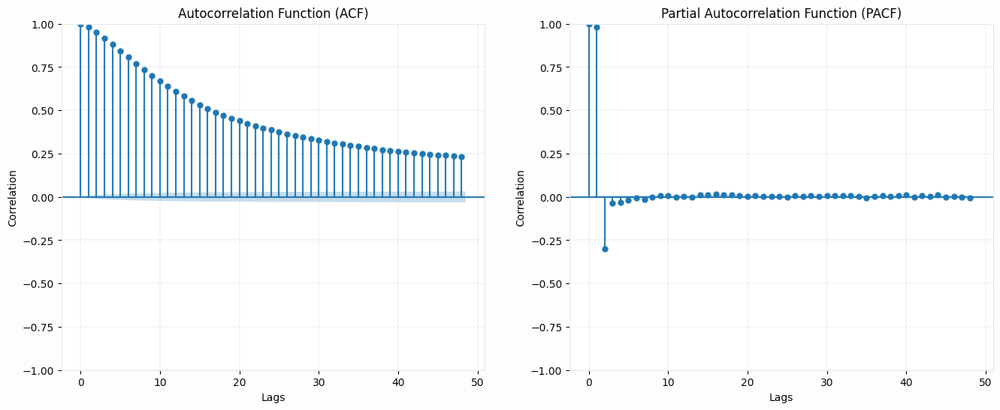

In [ ]:
# @title ACF and PACF

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()

# Loop through each unique location
for ll in unique_locations:
    # Filter the data for the specific location
    location_data = weather_data[(weather_data['ll_label'] == ll) ]

    # Extract the temperature_2m series for ACF and PACF
    temp_series = location_data['wind_speed_100m'].dropna()

    # Plot ACF and PACF
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    # fig.suptitle(f'Location: ({ll})', fontsize=16)

    plot_acf(temp_series, ax=axes[0], lags=48)
    plot_cosmos(axes[0],'Lags','Correlation','Autocorrelation Function (ACF)')

    plot_pacf(temp_series, ax=axes[1], lags=48)
    plot_cosmos(axes[1],'Lags','Correlation','Partial Autocorrelation Function (PACF)')

    plt.show()

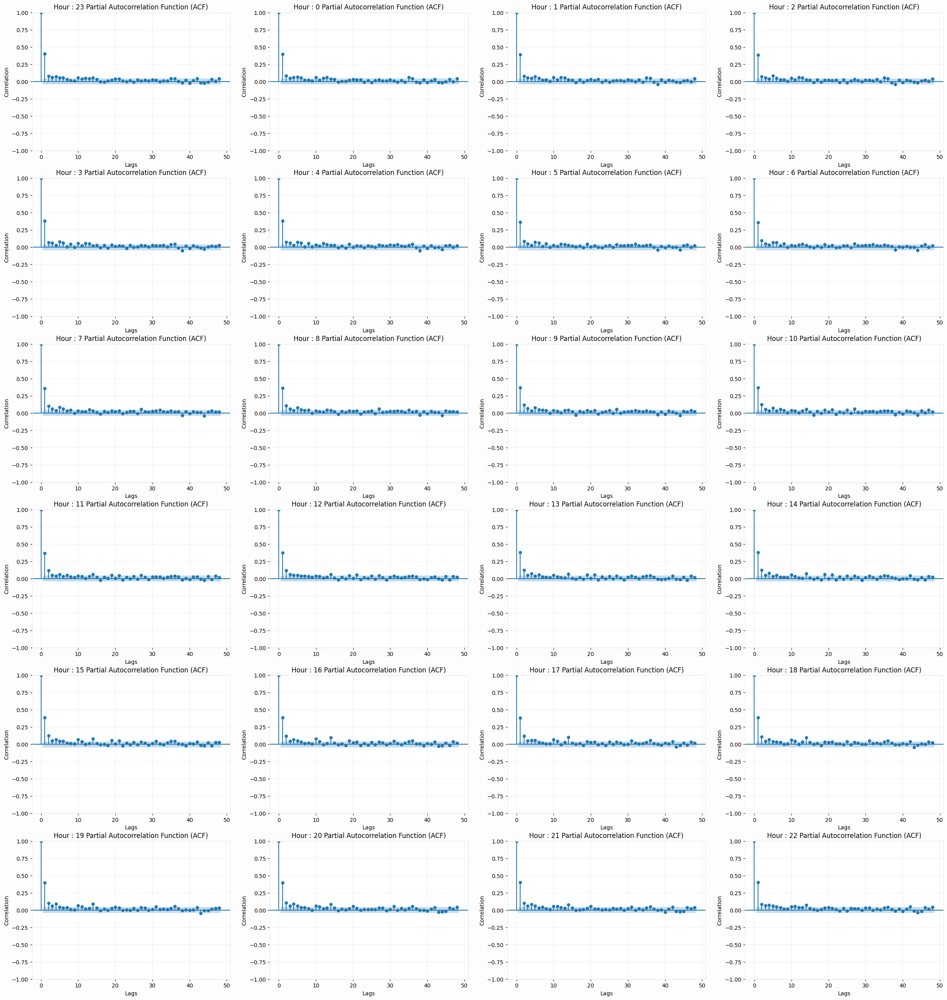

In [ ]:
# @title ACF and PACF

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

weather_data['ll_label'] = 0

# Get unique latitude and longitude combinations
hours = weather_data['hour'].unique()

fig, axes = plt.subplots(6, 4, figsize=(30, 32))
i = 0
j = 0

# Loop through each unique location
for h in hours:
    # Filter the data for the specific location
    location_data = weather_data[(weather_data['hour'] == h) ]

    # Extract the temperature_2m series for ACF and PACF
    temp_series = location_data['wind_speed_100m'].dropna()

    # Plot ACF and PACF

    # fig.suptitle(f'Location: ({ll})', fontsize=16)

    plot_pacf(temp_series, ax=axes[i][j], lags=48)
    plot_cosmos(axes[i][j],'Lags','Correlation',f'Hour : {h} Partial Autocorrelation Function (ACF)')
    j+=1
    # plot_pacf(temp_series, ax=axes[i][j], lags=48)
    # plot_cosmos(axes[i][j],'Lags','Correlation',f'Hour : {h} Partial Autocorrelation Function (PACF)')

    if j > 3:
      i += 1
      j = 0

plt.show()

In [ ]:
# @title Stationarity Test (Augmented Dickey Fuller)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller

# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()

# Loop through each unique location
for ll in unique_locations:
    # Filter the data for the specific location
    location_data = weather_data[(weather_data['ll_label'] == ll) ]

    # Extract the temperature_2m series for ACF and PACF
    temp_series = location_data['wind_speed_100m'].dropna()

    # # Plot ACF and PACF
    # fig, axes = plt.subplots(1, 1, figsize=(16, 6))
    # fig.suptitle(f'Location: ({ll})', fontsize=16)

    # # Plot the time series
    # plt.plot(range(len(temp_series)),temp_series, alpha = 0.3, color = 'tomato')

    # plot_cosmos(axes,'time','GHI',f'GHI Time Series')

    # Perform the Augmented Dickey-Fuller test
    result = adfuller(temp_series)

    # Output the results
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

    # Interpretation
    if result[1] > 0.05:
        print("Fail to reject the null hypothesis (non-stationary).")
    else:
        print("Reject the null hypothesis (stationary).")

    plt.show()


ADF Statistic: -27.16042040846057
p-value: 0.0
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567
Reject the null hypothesis (stationary).


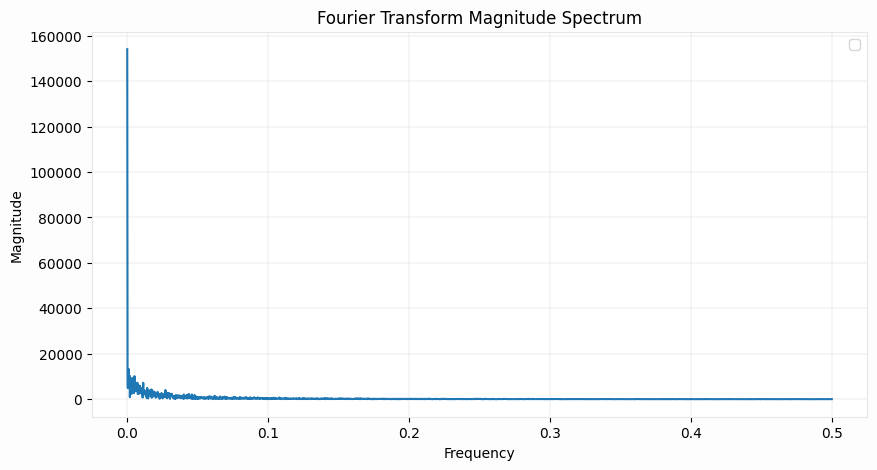

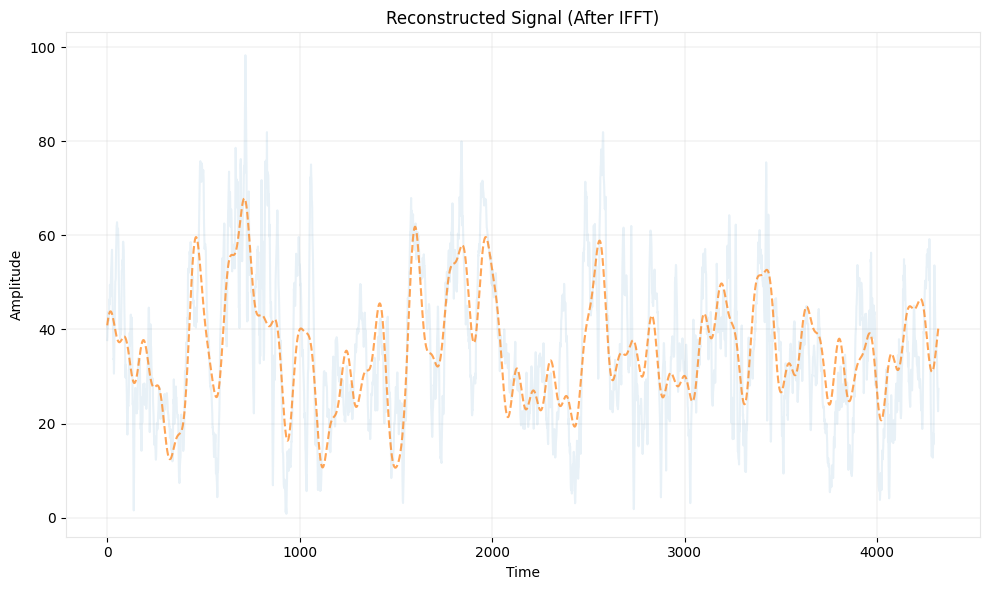

In [ ]:
# @title Seasonality Test using FFT
filtered_data = weather_data[(weather_data['country'] == 'UK')]

# Get unique latitude and longitude combinations
unique_locations = filtered_data['ll_label'].unique()

fourier_locs = dict()
fig,ax = plt.subplots(1,1,figsize=(10, 5))
# ax1 = plt.axes()
# Loop through each unique location
i = 0
j = 0
k = 0
for ll in unique_locations:

    # Filter the data for the specific location
    location_data = filtered_data[(filtered_data['ll_label'] == ll)]
    time_series = location_data['wind_speed_100m'].dropna()[0:180*24]


    # Assuming `time_series` is your time series data
    fft_result = np.fft.fft(time_series)
    fft_freq = np.fft.fftfreq(len(time_series))

    # Only keep the positive frequencies (the FFT result is symmetric)
    positive_frequencies = fft_freq[:len(fft_freq)//2]
    positive_fft_result = np.abs(fft_result[:len(fft_result)//2])

    fourier_locs[ll] = {'fft_result': fft_result, 'fft_freq': fft_freq}

    # Plotting the magnitude spectrum

    plt.plot(positive_frequencies, positive_fft_result)
    plot_cosmos(ax,'Frequency','Magnitude',f'Fourier Transform Magnitude Spectrum')
    ax.legend()

    k += 1

    if k >= 2:
        k = 0
        j+=1


# plot_cosmos(ax1,'Frequency','Magnitude','Magnitude Spectrum')
plt.show()

magnitudes = np.abs(fft_result)

top_n = 30
# Find indices of the top N frequencies
top_indices = np.argsort(magnitudes)[-top_n:]

# Create a new FFT result array, keeping only the top frequencies
filtered_fft_result = np.zeros_like(fft_result)
filtered_fft_result[top_indices] = fft_result[top_indices]

# Perform Inverse Fast Fourier Transform (IFFT) using only the top frequencies
reconstructed_signal = np.fft.ifft(filtered_fft_result)


# Plot the original and reconstructed signals
plt.figure(figsize=(10, 6))
ax = plt.axes()

plt.plot(range(len(time_series)), time_series, label='Original Signal', alpha = 0.1)
plt.plot(range(len(reconstructed_signal)), reconstructed_signal.real, label='Reconstructed Signal', linestyle='--', alpha = 0.7)

plot_cosmos(ax,'Time','Amplitude',f'Reconstructed Signal (After IFFT)')

plt.tight_layout()
plt.show()

In [ ]:
for k,v in fourier_locs.items():
  top_indices = np.argpartition(-fourier_locs[k]['fft_result'], 3)[:3]
  print(top_indices)
  # print(np.argmax(fourier_locs[k]['fft_result'].real))
  # print(fourier_locs[k]['fft_result'].real)
  print(fourier_locs[k]['fft_freq'][top_indices])

[   0 4319    1]
[ 0.         -0.00023148  0.00023148]


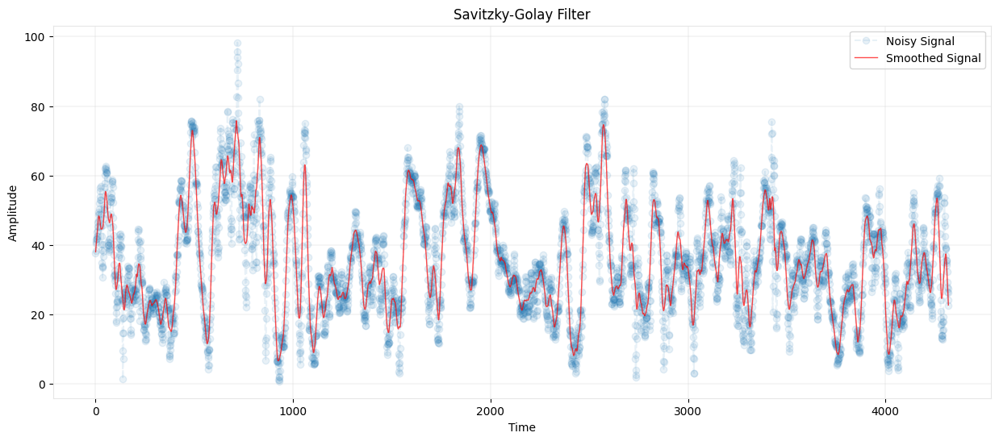

In [ ]:
# @title Savitzky-Golay

import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter

# Generate a noisy sine wave signal
np.random.seed(0)  # For reproducibility
t = range(len(weather_data.iloc[:180*24]))
signal = weather_data['wind_speed_100m'].iloc[:180*24]

# Apply the Savitzky-Golay filter
window_length = 24  # Must be an odd number
polyorder = 1  # The degree of the polynomial used to fit the samples
smoothed_signal = savgol_filter(signal, window_length, polyorder)

# Plot the original and smoothed signals
plt.figure(figsize=(15, 6))
ax = plt.axes()
plt.plot(t, signal, label='Noisy Signal', linestyle='--', marker='o', alpha = 0.1)
plt.plot(t, smoothed_signal, label='Smoothed Signal', color='red', linewidth=1, alpha = 0.7)
plot_cosmos(ax,'Time','Amplitude',f'Savitzky-Golay Filter')
plt.title('Savitzky-Golay Filter')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()
plt.show()


In [ ]:
# @title SARIMAX modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data[weather_data['ll_label'] == ll]
  sarimax_model = sm.tsa.SARIMAX(np.array(temp[TARGET_FEATURES[0]].iloc[1:-24]),
                                order=(6, 2, 6),
                                seasonal_order=(0, 0, 0, int(1/0.00102646)),
                                enforce_stationarity=True,
                                enforce_invertibility=True,
                                time_varying_regression = True,
                                mle_regression = False,
                                exog=np.array(temp[['relative_humidity_2m','shortwave_radiation','vapour_pressure_deficit']].iloc[0:-25,:]))
  sarimax_fit = sarimax_model.fit(disp=True)

  with open(f'GHI_{ll}_forecast.pkl', 'wb') as file:
      pickle.dump(sarimax_model, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/GHI/models/temperature_sarimax_{ll}_forecast.pkl'

  source_file_name = f'GHI_{ll}_forecast.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break

<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/GHI/models/temperature_sarimax_0_forecast.pkl, None>
File GHI_0_forecast.pkl uploaded to avishek/body/Research/weather_forecast/experiment/GHI/models/temperature_sarimax_0_forecast.pkl.


In [ ]:
sarimax_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:               100775
Model:               SARIMAX(6, 2, 6)   Log Likelihood              -63023.060
Date:                Sat, 24 Aug 2024   AIC                         126078.121
Time:                        14:45:10   BIC                         126230.450
Sample:                             0   HQIC                        126124.333
                             - 100775                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1       4.852e-07      0.173    2.8e-06      1.000      -0.340       0.340
ar.L2       2.685e-06      0.453   5.92e-06      1.000      -0.889       0.889
ar.L3       3.555e-06      0.784   4.53e-06      1.000      -1.537       1.537
ar.L4       2.983e-06      1.131   2.64e-06      1.000      -2.216       2.216
ar.L5       4.365e-06      1.468   2.97e-06      1.000      -2.877       2.877
ar.L6       3.587e-06      1.766   2.03e-06      1.000      -3.462       3.462
ma.L1         -0.0088      0.328     -0.027      0.979      -0.652       0.634
ma.L2         -0.0086      0.365     -0.024      0.981      -0.725       0.707
ma.L3         -0.0085      0.326     -0.026      0.979      -0.648       0.631
ma.L4         -0.0089      0.340     -0.026      0.979      -0.674       0.657
ma.L5         -0.0089      0.354     -0.025      0.980      -0.703       0.686
ma.L6         -0.0088      0.329     -0.027      0.979      -0.653       0.635
var.x1      2.774e-05   2.82e-05      0.984      0.325   -2.75e-05     8.3e-05
var.x2      2.761e-05   2.82e-05      0.980      0.327   -2.76e-05    8.28e-05
var.x3         0.9991      0.069     14.579      0.000       0.865       1.133
sigma2         0.0427      0.023      1.866      0.062      -0.002       0.088
===================================================================================
Ljung-Box (L1) (Q):                 593.41   Jarque-Bera (JB):            815449.01
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               2.18   Skew:                            -0.18
Prob(H) (two-sided):                  0.00   Kurtosis:                        16.93
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 7.12e+17. Standard errors may be unstable.
"""

In [ ]:
res = sarimax_model.filter(sarimax_fit.params)
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()

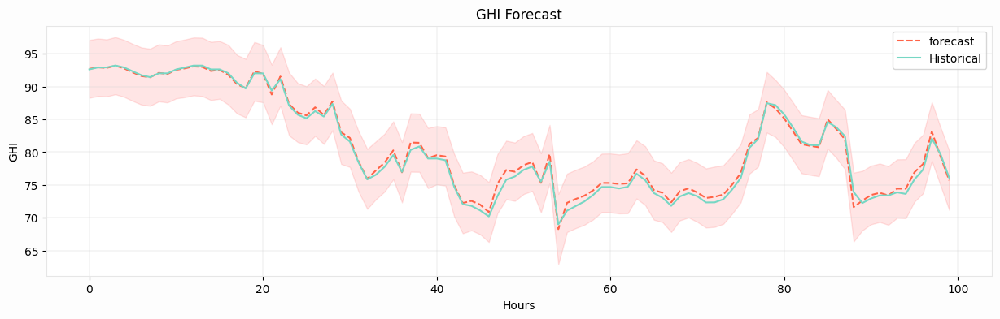

In [ ]:
# Graph
fig, ax = plt.subplots(figsize=(15,4))
npre = 4

# Plot predictions
# predict.predicted_mean[-100:].plot(ax=ax, style='r--', label='One-step-ahead forecast')
plt.plot(range(len(temp[TARGET_FEATURES[0]].iloc[-100:])), predict.predicted_mean[-100:], color = 'tomato', label = 'forecast', linestyle = '--')
ci = predict_ci[-100:]
ax.fill_between(range(len(temp[TARGET_FEATURES[1]].iloc[-100:])), ci[:,0], ci[:,1], color='r', alpha=0.1)
plt.plot(range(len(temp[TARGET_FEATURES[0]].iloc[-100:])), temp[TARGET_FEATURES[1]].iloc[-125:-25], color = '#76D7C4', label = 'Historical')
legend = ax.legend(loc='lower right')
plot_cosmos(ax,'Hours','GHI','GHI Forecast')
plt.legend()
plt.show()

In [ ]:
# Make predictions
predictions = sarimax_fit.forecast(steps=24, exog = temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-48:-24,:])
predict = sarimax_fit.predict(steps=24, exog = temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-48:-24,:])

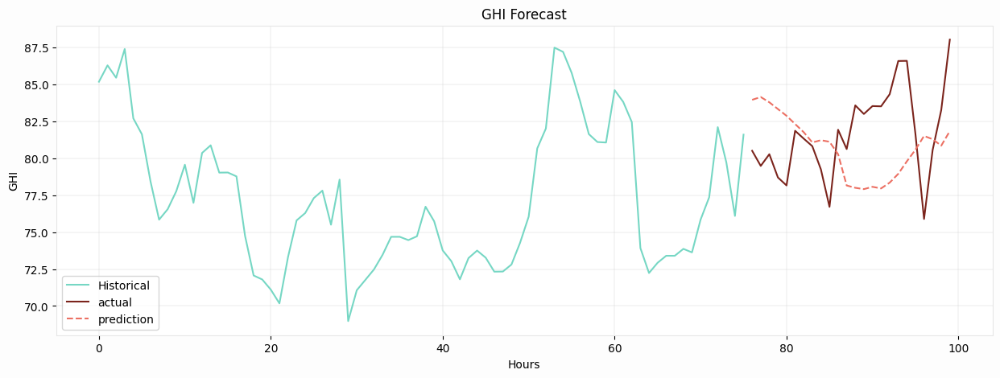

In [ ]:
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24])), temp[TARGET_FEATURES[1]].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), temp[TARGET_FEATURES[1]].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), predictions, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','GHI','GHI Forecast')
plt.legend()
plt.show()

In [ ]:
# @title ARIMAX modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data[weather_data['ll_label'] == ll]
  arimax_model = sm.tsa.SARIMAX(np.array(temp[TARGET_FEATURES[1]].iloc[-2000:-24]),
                                order=(6, 0, 3),
                                # seasonal_order=(0, 0, 0, int(1/0.001)),
                                exog=np.array(temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-2000:-24,:]))
  sarimax_fit_arimax = arimax_model.fit(disp=True)

  with open(f'GHI_{ll}_forecast_ARIMAX.pkl', 'wb') as file:
      pickle.dump(sarimax_fit_arimax, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_{ll}_forecast_ARIMAX.pkl'

  source_file_name = f'GHI_{ll}_forecast_ARIMAX.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break

<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_ARIMAX.pkl, None>
File GHI_0_forecast_ARIMAX.pkl uploaded to avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_ARIMAX.pkl.


In [ ]:
sarimax_fit_arimax.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 1976
Model:               SARIMAX(6, 0, 3)   Log Likelihood               23308.505
Date:                Tue, 09 Jul 2024   AIC                         -46591.010
Time:                        15:45:26   BIC                         -46518.355
Sample:                             0   HQIC                        -46564.316
                               - 1976                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             1.0000   9.29e-08   1.08e+07      0.000       1.000       1.000
x2         -8.574e-07   8.95e-08     -9.580      0.000   -1.03e-06   -6.82e-07
x3         -1.463e-06   1.54e-07     -9.481      0.000   -1.77e-06   -1.16e-06
ar.L1        3.26e-19   4.97e-13   6.57e-07      1.000   -9.73e-13    9.73e-13
ar.L2       6.303e-19      5e-13   1.26e-06      1.000   -9.79e-13    9.79e-13
ar.L3       9.563e-19   4.92e-13   1.94e-06      1.000   -9.65e-13    9.65e-13
ar.L4       1.239e-18   4.65e-13   2.66e-06      1.000   -9.12e-13    9.12e-13
ar.L5       1.565e-18   4.38e-13   3.58e-06      1.000   -8.58e-13    8.58e-13
ar.L6       1.869e-18    3.9e-13    4.8e-06      1.000   -7.63e-13    7.63e-13
ma.L1       -3.26e-19   4.97e-13  -6.57e-07      1.000   -9.73e-13    9.73e-13
ma.L2      -6.303e-19      5e-13  -1.26e-06      1.000   -9.79e-13    9.79e-13
ma.L3      -9.563e-19   4.92e-13  -1.94e-06      1.000   -9.65e-13    9.65e-13
sigma2      2.307e-12   5.11e-11      0.045      0.964   -9.78e-11    1.02e-10
===================================================================================
Ljung-Box (L1) (Q):                1749.68   Jarque-Bera (JB):                52.20
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.75   Skew:                            -0.40
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.01
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 7.18e+27. Standard errors may be unstable.
"""

In [ ]:
# Make predictions
predictions_arimax = sarimax_fit_arimax.forecast(steps=24, exog = temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-24:,:])

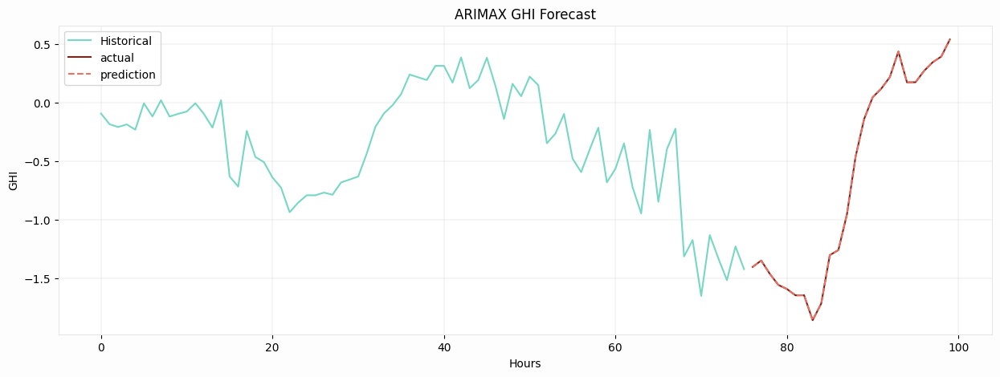

In [ ]:
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24])), temp[TARGET_FEATURES[1]].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), temp[TARGET_FEATURES[1]].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), predictions_arimax, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','GHI','ARIMAX GHI Forecast')
plt.legend()
plt.show()

<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_SARIMAA.pkl, None>
File GHI_0_forecast_SARIMA.pkl uploaded to avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_SARIMAA.pkl.


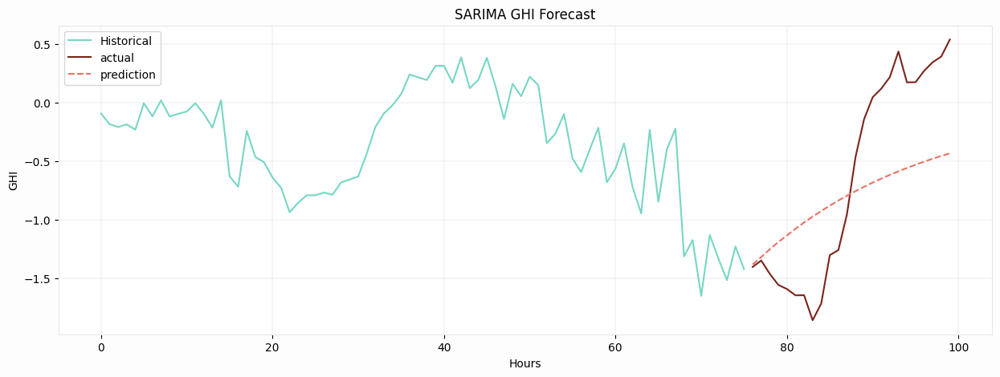

In [ ]:
# @title SARIMA modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data[weather_data['ll_label'] == ll]
  sarima_model = sm.tsa.SARIMAX(np.array(temp[TARGET_FEATURES[1]].iloc[:-24]),
                                order=(6, 0, 3),
                                seasonal_order=(0, 0, 0, int(1/0.001))
                                # exog=np.array(temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-2000:-24,:])
                                )
  sarimax_fit_sarima = sarima_model.fit(disp=True)

  with open(f'GHI_{ll}_forecast_SARIMA.pkl', 'wb') as file:
      pickle.dump(sarimax_fit_sarima, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_{ll}_forecast_SARIMAA.pkl'

  source_file_name = f'GHI_{ll}_forecast_SARIMA.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break
sarimax_fit_sarima.summary()
# Make predictions
predictions_sarima = sarimax_fit_sarima.forecast(steps=24)
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24])), temp[TARGET_FEATURES[1]].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), temp[TARGET_FEATURES[1]].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), predictions_sarima, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','GHI','SARIMA GHI Forecast')
plt.legend()
plt.show()

# Load

In [4]:
QUERY = f'''SELECT TIMESTAMP(a.utc_timestamp) AS utc_timestamp,
                    GB_GBN_load_actual_entsoe_transparency,
                    GB_GBN_load_forecast_entsoe_transparency,
                    GB_GBN_price_day_ahead,
                    GB_GBN_solar_capacity,
                    GB_GBN_solar_generation_actual,
                    GB_GBN_solar_profile,
                    GB_GBN_wind_capacity,
                    GB_GBN_wind_generation_actual,
                    GB_GBN_wind_profile,
                    GB_GBN_wind_offshore_capacity,
                    GB_GBN_wind_offshore_generation_actual,
                    GB_GBN_wind_offshore_profile,
                    GB_GBN_wind_onshore_capacity,
                    GB_GBN_wind_onshore_generation_actual,
                    GB_GBN_wind_onshore_profile,
                    b.*
FROM revx-259410.Avishek_Explore.load_supply_timeseries a
LEFT JOIN revx-259410.Avishek_Explore.weather_data_UK_overall b
ON TIMESTAMP(a.utc_timestamp) = b.date_hour; '''
query_job = client.query(QUERY)  # API request
weather_data = query_job.result().to_dataframe()

In [8]:
weather_data['Year'] = weather_data['utc_timestamp'].dt.year

In [9]:
weather_data.groupby('Year')[['GB_GBN_solar_capacity','GB_GBN_wind_capacity']].sum()

,GB_GBN_solar_capacity,GB_GBN_wind_capacity
Year,,
2014,2664.0,11554.0
2015,40354084.0,109846511.0
2016,61171136.0,121597260.0
2017,70168980.0,138619401.0
2018,71674922.0,164410084.0
2019,71734004.0,177347339.0
2020,0.0,0.0


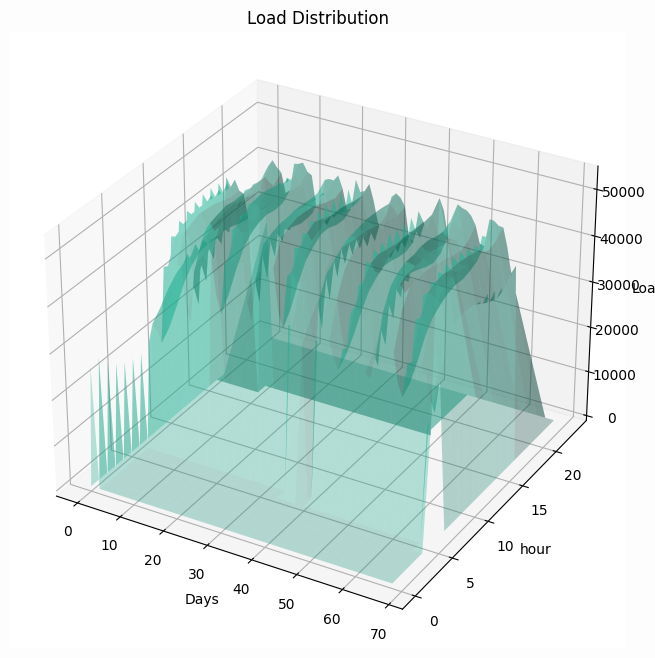

In [ ]:
# @title Load Distribution UK

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import pandas as pd

from sklearn.preprocessing import LabelEncoder

# Initialize the LabelEncoder
label_encoder = LabelEncoder()
weather_data['date'] = weather_data['date_hour'].dt.date
# Encode 'color' column
weather_data['date_encoded'] = label_encoder.fit_transform(weather_data['date'])

# Pivot the data to get 2D arrays
pivot_table = weather_data.iloc[:24*30].pivot(index='hour', columns='date_encoded', values='GB_GBN_load_actual_entsoe_transparency').fillna(0)

# Ensure X, Y, and Z are 2D arrays
X, Y = np.meshgrid(pivot_table.columns, pivot_table.index)
Z = pivot_table.values

X = np.asarray(X, dtype=int)
Y = np.asarray(Y, dtype=int)
Z = np.asarray(Z, dtype=float)

if np.isnan(Z).any():
    print("Warning: Data contains NaN values.")
    Z = np.nan_to_num(Z)  # Replace NaNs with zero

# Create figure and 3D axis
fig = plt.figure(figsize = (30,8))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
ax.plot_surface(X, Y, Z,  alpha = 0.3, color = '#1abc9c')

# Add labels
ax.set_xlabel('Date')
ax.set_ylabel('Hour')
ax.set_zlabel('Load')

# Optionally, add a title or custom function for additional customization
ax.set_title('Load Distribution')

plot_cosmos(ax,'Days','hour','Load Distribution')

# Show the plot
plt.show()

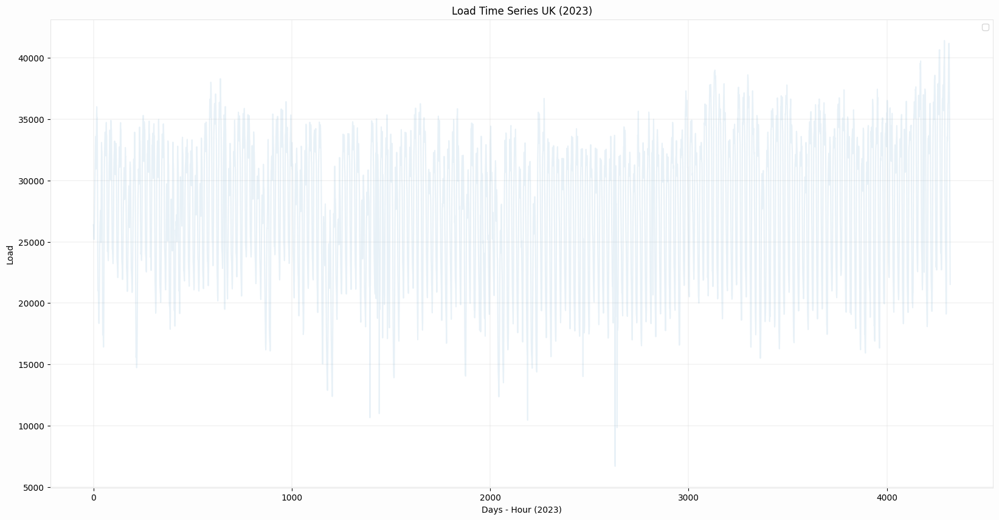

In [ ]:
fig = plt.figure(figsize = (20,10))
ax = plt.axes()

plt.plot(range(len(weather_data))[0:30*24*6],weather_data['GB_GBN_load_actual_entsoe_transparency'].values[-30*6*24:], alpha = 0.1)
plt.legend()
plot_cosmos(ax,'Days - Hour (2023)','Load','Load Time Series UK (2023)')
plt.show()

In [ ]:
i = 0
for c in weather_data.columns:
  print(f"'{c}'",end = ', ')
  i += 1
  if i%6 == 0:
    print('\n')

'll_label', 'date_hour', 'temperature_2m', 'relative_humidity_2m', 'dew_point_2m', 'apparent_temperature', 

'precipitation', 'rain', 'snowfall', 'snow_depth', 'weather_code', 'pressure_msl', 

'surface_pressure', 'cloud_cover', 'cloud_cover_low', 'cloud_cover_mid', 'cloud_cover_high', 'et0_fao_evapotranspiration', 

'vapour_pressure_deficit', 'wind_speed_10m', 'wind_speed_100m', 'wind_direction_10m', 'wind_direction_100m', 'wind_gusts_10m', 

'soil_temperature_0_to_7cm', 'soil_temperature_7_to_28cm', 'soil_temperature_28_to_100cm', 'soil_temperature_100_to_255cm', 'soil_moisture_0_to_7cm', 'soil_moisture_7_to_28cm', 

'soil_moisture_28_to_100cm', 'soil_moisture_100_to_255cm', 'shortwave_radiation', 'direct_radiation', 'diffuse_radiation', 'direct_normal_irradiance', 

'global_tilted_irradiance', 'terrestrial_radiation', 'shortwave_radiation_instant', 'direct_radiation_instant', 'diffuse_radiation_instant', 'direct_normal_irradiance_instant', 

'global_tilted_irradiance_instant', 'terr

In [ ]:
weather_data.fillna(0,inplace = True)

In [ ]:
TIME_FEATURE = ['date_hour']
TARGET_FEATURES = ['GB_GBN_load_actual_entsoe_transparency','shortwave_radiation']
FEATURES = [ 'temperature_2m', 'relative_humidity_2m', 'dew_point_2m', 'apparent_temperature',
'precipitation', 'rain', 'snowfall', 'snow_depth', 'weather_code', 'pressure_msl',
'surface_pressure', 'cloud_cover', 'cloud_cover_low', 'cloud_cover_mid', 'cloud_cover_high', 'et0_fao_evapotranspiration',
'vapour_pressure_deficit', 'wind_speed_10m', 'wind_speed_100m', 'wind_direction_10m', 'wind_direction_100m', 'wind_gusts_10m',
'soil_temperature_0_to_7cm', 'soil_temperature_7_to_28cm', 'soil_temperature_28_to_100cm', 'soil_temperature_100_to_255cm',
'soil_moisture_0_to_7cm', 'soil_moisture_7_to_28cm',
'soil_moisture_28_to_100cm', 'soil_moisture_100_to_255cm', 'shortwave_radiation',
'direct_radiation', 'diffuse_radiation', 'direct_normal_irradiance',
'global_tilted_irradiance', 'terrestrial_radiation', 'shortwave_radiation_instant',
'direct_radiation_instant', 'diffuse_radiation_instant', 'direct_normal_irradiance_instant',
'global_tilted_irradiance_instant', 'terrestrial_radiation_instant']

GEO_FEATURES = ['ll_label']

In [ ]:
weather_data.fillna(method = 'ffill',inplace = True)
weather_data.fillna(method = 'bfill',inplace = True)
weather_data.fillna(0,inplace = True)

In [ ]:
weather_data

,utc_timestamp,GB_GBN_load_actual_entsoe_transparency,GB_GBN_load_forecast_entsoe_transparency,GB_GBN_price_day_ahead,GB_GBN_solar_capacity,GB_GBN_solar_generation_actual,GB_GBN_solar_profile,GB_GBN_wind_capacity,GB_GBN_wind_generation_actual,GB_GBN_wind_profile,...,shortwave_radiation_instant,direct_radiation_instant,diffuse_radiation_instant,direct_normal_irradiance_instant,global_tilted_irradiance_instant,terrestrial_radiation_instant,lat,lon,country,hour
0,2014-12-31 23:00:00+00:00,26758.0,32057.0,32.00,2664.0,13.0,0.0049,11554.0,782.0,0.0676,...,0.0,3.0,1024.300049,1024.300049,90.000000,43.0,55.3781,3.436,UK,23
1,2015-01-01 00:00:00+00:00,26758.0,32057.0,32.00,2669.0,13.0,0.0049,11555.0,782.0,0.0676,...,0.0,1.0,1023.900024,1023.900024,46.800003,26.0,55.3781,3.436,UK,0
2,2015-01-01 01:00:00+00:00,27166.0,31738.0,32.00,2669.0,13.0,0.0049,11555.0,782.0,0.0676,...,0.0,1.0,1022.900024,1022.900024,39.900002,21.0,55.3781,3.436,UK,1
3,2015-01-01 02:00:00+00:00,24472.0,30690.0,32.00,2669.0,13.0,0.0049,11555.0,785.0,0.0680,...,0.0,1.0,1023.700012,1023.700012,37.200001,11.0,55.3781,3.436,UK,2
4,2015-01-01 03:00:00+00:00,23003.0,28442.0,32.00,2669.0,13.0,0.0049,11555.0,776.0,0.0672,...,0.0,0.0,1021.400024,1021.400024,8.099999,9.0,55.3781,3.436,UK,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50396,2020-09-05 18:00:00+00:00,33017.0,29356.0,58.60,8256.0,78.0,0.0000,20612.0,5135.0,0.1724,...,0.0,51.0,1014.400024,1014.400024,39.000000,20.0,55.3781,3.436,UK,18
50397,2020-09-24 04:00:00+00:00,23627.0,22402.0,39.73,8256.0,0.0,0.0000,20612.0,5544.0,0.1724,...,0.0,51.0,985.900024,985.900024,24.299999,27.0,55.3781,3.436,UK,4
50398,2020-09-25 04:00:00+00:00,21916.0,22402.0,39.11,8256.0,0.0,0.0000,20612.0,8483.0,0.1724,...,0.0,63.0,992.599976,992.599976,100.000000,100.0,55.3781,3.436,UK,4
50399,2020-09-28 17:00:00+00:00,40578.0,36834.0,75.42,8256.0,55.0,0.0000,20612.0,2964.0,0.1724,...,0.0,3.0,1009.700012,1009.700012,100.000000,100.0,55.3781,3.436,UK,17


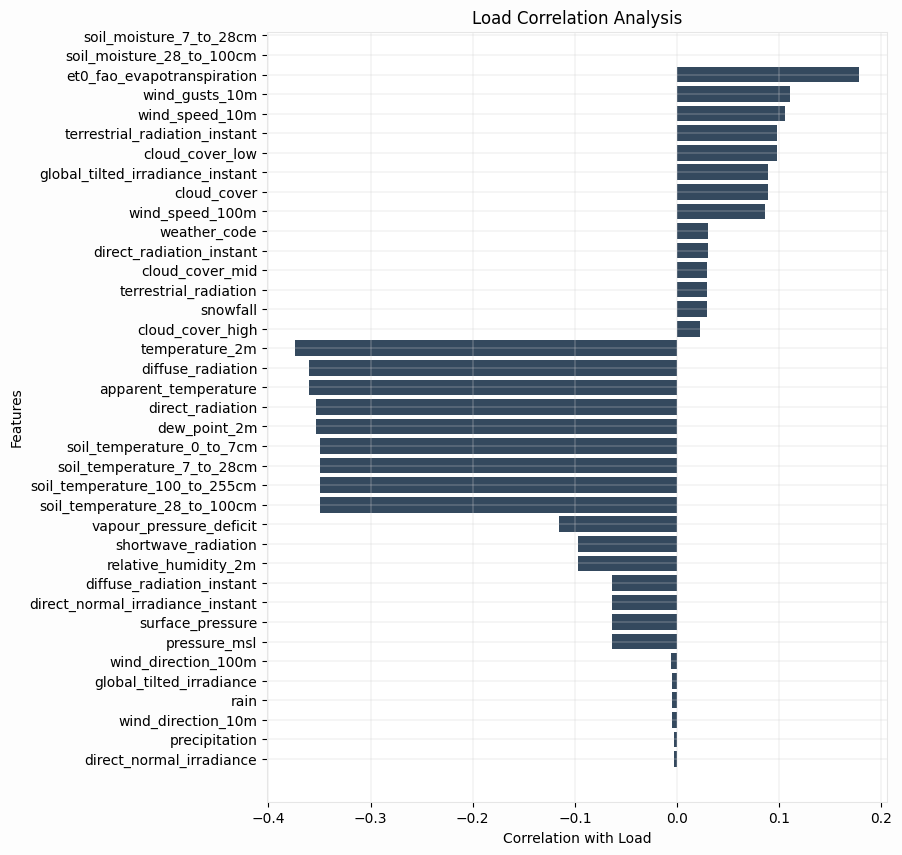

In [ ]:
# @title Features Importance Analysis
# @markdown Which features can help us determine GHI accuartely?

from scipy.stats import pearsonr

# # Calculate Pearson correlation coefficient
# pearson_correlation, p_value = pearsonr(x, y)

# print("Pearson Correlation Coefficient:", pearson_correlation)
# print("P-value:", p_value)

corr_list = []
corr_col = []

for col in FEATURES:
  corr_list.append(pearsonr(weather_data[col],weather_data[TARGET_FEATURES[0]])[0])
  corr_col.append(col)

corr_df = pd.DataFrame(np.array([corr_col,corr_list]).T , columns = ['Features','Correlation with Load'])
corr_df.sort_values('Correlation with Load',ascending = True,inplace = True)
corr_df['Correlation with Load'] = corr_df['Correlation with Load'].astype(float)

fig = plt.figure(figsize = (8,10))
ax = plt.axes()
plt.barh(corr_df['Features'],corr_df['Correlation with Load'], color = '#34495e')
plot_cosmos(ax,'Correlation with Load','Features','Load Correlation Analysis')

In [ ]:
corr_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 120 entries, 83 to 0
Data columns (total 2 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   Features                      120 non-null    object
 1   Correlation with Temperature  120 non-null    object
dtypes: object(2)
memory usage: 2.8+ KB


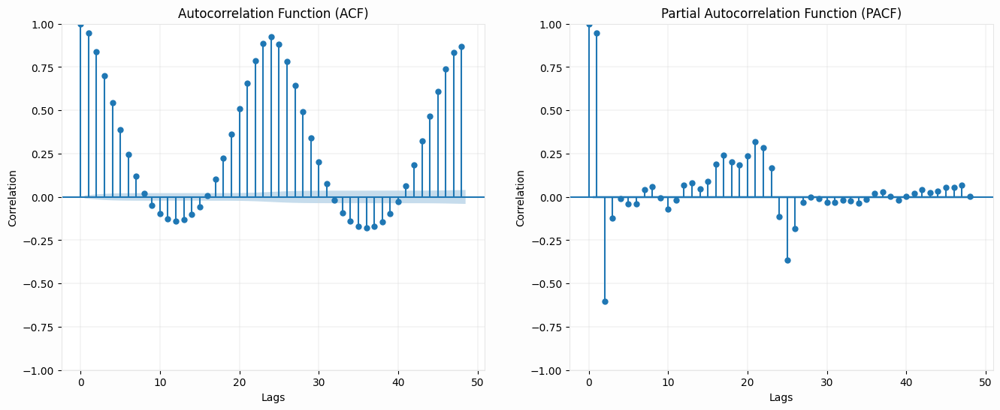

In [ ]:
# @title ACF and PACF

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

weather_data['ll_label'] = 0

# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()

# Loop through each unique location
for ll in unique_locations:
    # Filter the data for the specific location
    location_data = weather_data[(weather_data['ll_label'] == ll) ]

    # Extract the temperature_2m series for ACF and PACF
    temp_series = location_data['GB_GBN_load_actual_entsoe_transparency'].dropna()

    # Plot ACF and PACF
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    # fig.suptitle(f'Location: ({ll})', fontsize=16)

    plot_acf(temp_series, ax=axes[0], lags=48)
    plot_cosmos(axes[0],'Lags','Correlation','Autocorrelation Function (ACF)')

    plot_pacf(temp_series, ax=axes[1], lags=48)
    plot_cosmos(axes[1],'Lags','Correlation','Partial Autocorrelation Function (PACF)')

    plt.show()

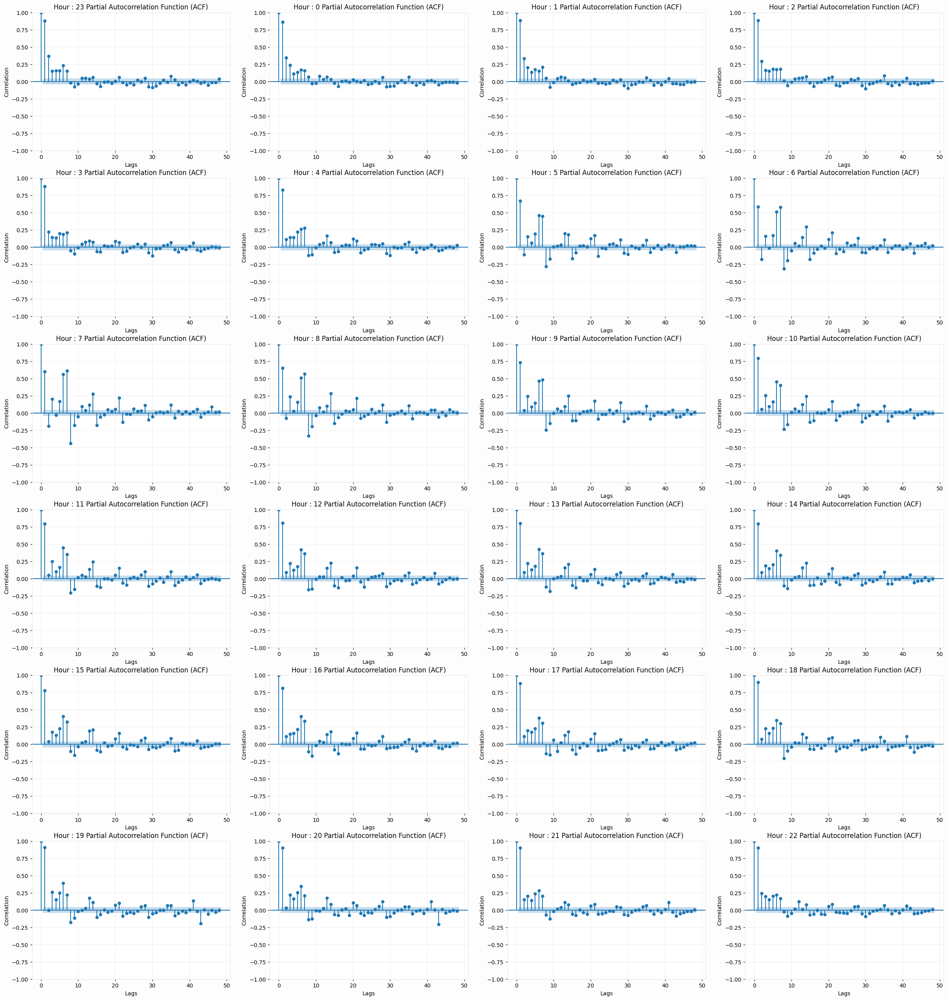

In [ ]:
# @title ACF and PACF

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

weather_data['ll_label'] = 0

# Get unique latitude and longitude combinations
hours = weather_data['hour'].unique()

fig, axes = plt.subplots(6, 4, figsize=(30, 32))
i = 0
j = 0

# Loop through each unique location
for h in hours:
    # Filter the data for the specific location
    location_data = weather_data[(weather_data['hour'] == h) ]

    # Extract the temperature_2m series for ACF and PACF
    temp_series = location_data['GB_GBN_load_actual_entsoe_transparency'].dropna()

    # Plot ACF and PACF

    # fig.suptitle(f'Location: ({ll})', fontsize=16)

    plot_pacf(temp_series, ax=axes[i][j], lags=48)
    plot_cosmos(axes[i][j],'Lags','Correlation',f'Hour : {h} Partial Autocorrelation Function (ACF)')
    j+=1
    # plot_pacf(temp_series, ax=axes[i][j], lags=48)
    # plot_cosmos(axes[i][j],'Lags','Correlation',f'Hour : {h} Partial Autocorrelation Function (PACF)')

    if j > 3:
      i += 1
      j = 0

plt.show()

In [ ]:
# @title Stationarity Test (Augmented Dickey Fuller)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller

# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()

# Loop through each unique location
for ll in unique_locations:
    # Filter the data for the specific location
    location_data = weather_data[(weather_data['ll_label'] == ll) ]

    # Extract the temperature_2m series for ACF and PACF
    temp_series = location_data['GB_GBN_load_actual_entsoe_transparency'].dropna()

    # # Plot ACF and PACF
    # fig, axes = plt.subplots(1, 1, figsize=(16, 6))
    # fig.suptitle(f'Location: ({ll})', fontsize=16)

    # # Plot the time series
    # plt.plot(range(len(temp_series)),temp_series, alpha = 0.3, color = 'tomato')

    # plot_cosmos(axes,'time','GHI',f'GHI Time Series')

    # Perform the Augmented Dickey-Fuller test
    result = adfuller(temp_series)

    # Output the results
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

    # Interpretation
    if result[1] > 0.05:
        print("Fail to reject the null hypothesis (non-stationary).")
    else:
        print("Reject the null hypothesis (stationary).")

    plt.show()


ADF Statistic: -8.370068325614628
p-value: 2.677126120410801e-13
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567
Reject the null hypothesis (stationary).


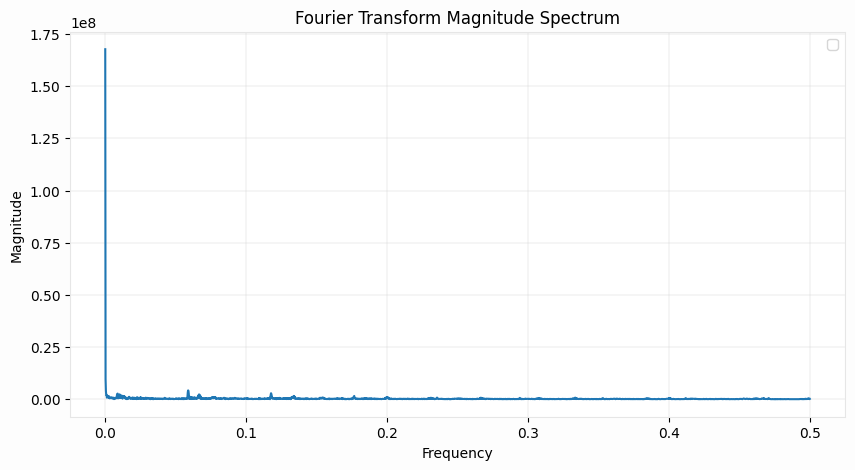

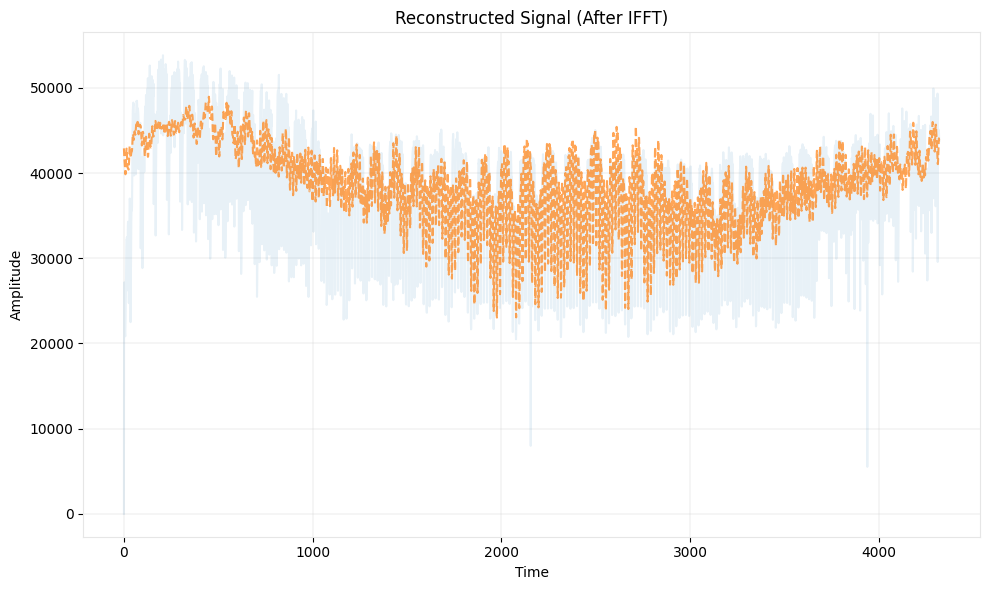

In [ ]:
# @title Seasonality Test using FFT
filtered_data = weather_data[(weather_data['country'] == 'UK')]

# Get unique latitude and longitude combinations
unique_locations = filtered_data['ll_label'].unique()

fourier_locs = dict()
fig,ax = plt.subplots(1,1,figsize=(10, 5))
# ax1 = plt.axes()
# Loop through each unique location
i = 0
j = 0
k = 0
for ll in unique_locations:

    # Filter the data for the specific location
    location_data = filtered_data[(filtered_data['ll_label'] == ll)]
    time_series = location_data['GB_GBN_load_actual_entsoe_transparency'].dropna()[0:180*24]


    # Assuming `time_series` is your time series data
    fft_result = np.fft.fft(time_series)
    fft_freq = np.fft.fftfreq(len(time_series))

    # Only keep the positive frequencies (the FFT result is symmetric)
    positive_frequencies = fft_freq[:len(fft_freq)//2]
    positive_fft_result = np.abs(fft_result[:len(fft_result)//2])

    fourier_locs[ll] = {'fft_result': fft_result, 'fft_freq': fft_freq}

    # Plotting the magnitude spectrum

    plt.plot(positive_frequencies, positive_fft_result)
    plot_cosmos(ax,'Frequency','Magnitude',f'Fourier Transform Magnitude Spectrum')
    ax.legend()

    k += 1

    if k >= 2:
        k = 0
        j+=1


# plot_cosmos(ax1,'Frequency','Magnitude','Magnitude Spectrum')
plt.show()

magnitudes = np.abs(fft_result)

top_n = 30
# Find indices of the top N frequencies
top_indices = np.argsort(magnitudes)[-top_n:]

# Create a new FFT result array, keeping only the top frequencies
filtered_fft_result = np.zeros_like(fft_result)
filtered_fft_result[top_indices] = fft_result[top_indices]

# Perform Inverse Fast Fourier Transform (IFFT) using only the top frequencies
reconstructed_signal = np.fft.ifft(filtered_fft_result)


# Plot the original and reconstructed signals
plt.figure(figsize=(10, 6))
ax = plt.axes()

plt.plot(range(len(time_series)), time_series, label='Original Signal', alpha = 0.1)
plt.plot(range(len(reconstructed_signal)), reconstructed_signal.real, label='Reconstructed Signal', linestyle='--', alpha = 0.7)

plot_cosmos(ax,'Time','Amplitude',f'Reconstructed Signal (After IFFT)')

plt.tight_layout()
plt.show()

In [ ]:
for k,v in fourier_locs.items():
  top_indices = np.argpartition(-fourier_locs[k]['fft_result'], 3)[:3]
  print(top_indices)
  # print(np.argmax(fourier_locs[k]['fft_result'].real))
  # print(fourier_locs[k]['fft_result'].real)
  print(fourier_locs[k]['fft_freq'][top_indices])

[   0 4319    1]
[ 0.         -0.00023148  0.00023148]


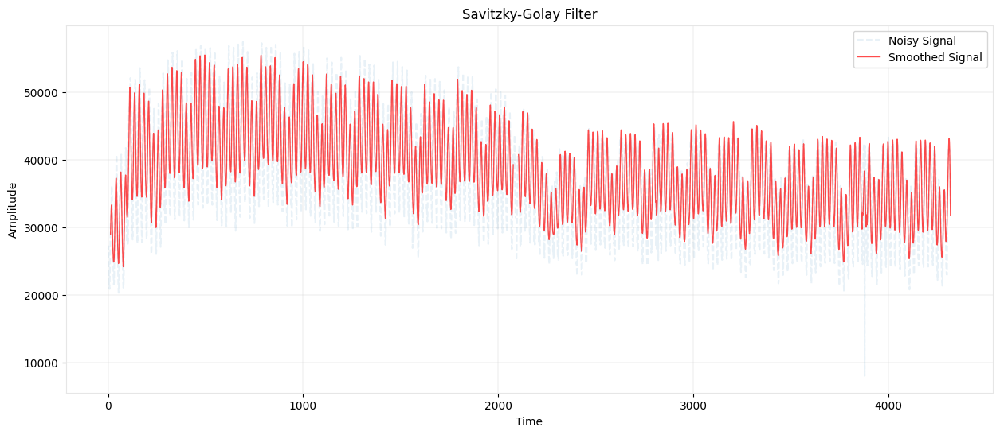

In [ ]:
# @title Savitzky-Golay

import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter

# Generate a noisy sine wave signal
np.random.seed(0)  # For reproducibility
t = range(len(weather_data.iloc[:180*24]))
signal = weather_data['GB_GBN_load_actual_entsoe_transparency'].iloc[:180*24]

# Apply the Savitzky-Golay filter
window_length = 24  # Must be an odd number
polyorder = 3  # The degree of the polynomial used to fit the samples
smoothed_signal = savgol_filter(signal, window_length, polyorder)

# Plot the original and smoothed signals
plt.figure(figsize=(15, 6))
ax = plt.axes()
plt.plot(t, signal, label='Noisy Signal', linestyle='--',  alpha = 0.1)
plt.plot(t, smoothed_signal, label='Smoothed Signal', color='red', linewidth=1, alpha = 0.7)
plot_cosmos(ax,'Time','Amplitude',f'Savitzky-Golay Filter')
plt.title('Savitzky-Golay Filter')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()
plt.show()


In [ ]:
# @title SARIMAX modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data[weather_data['ll_label'] == ll]
  sarimax_model = sm.tsa.SARIMAX(np.array(temp[TARGET_FEATURES[0]].iloc[1:-24]),
                                order=(6, 2, 6),
                                seasonal_order=(0, 0, 0, int(1/0.00102646)),
                                enforce_stationarity=True,
                                enforce_invertibility=True,
                                time_varying_regression = True,
                                mle_regression = False,
                                exog=np.array(temp[['relative_humidity_2m','shortwave_radiation','vapour_pressure_deficit']].iloc[0:-25,:]))
  sarimax_fit = sarimax_model.fit(disp=True)

  with open(f'GHI_{ll}_forecast.pkl', 'wb') as file:
      pickle.dump(sarimax_model, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/GHI/models/temperature_sarimax_{ll}_forecast.pkl'

  source_file_name = f'GHI_{ll}_forecast.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/GHI/models/temperature_sarimax_0_forecast.pkl, None>
File GHI_0_forecast.pkl uploaded to avishek/body/Research/weather_forecast/experiment/GHI/models/temperature_sarimax_0_forecast.pkl.


In [ ]:
sarimax_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                50376
Model:               SARIMAX(6, 2, 6)   Log Likelihood             -455670.164
Date:                Sun, 01 Sep 2024   AIC                         911372.328
Time:                        18:21:20   BIC                         911513.562
Sample:                             0   HQIC                        911416.554
                              - 50376                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1622      0.027      5.974      0.000       0.109       0.215
ar.L2          0.2536      0.030      8.517      0.000       0.195       0.312
ar.L3         -0.1889      0.028     -6.859      0.000      -0.243      -0.135
ar.L4          0.0228      0.027      0.856      0.392      -0.029       0.075
ar.L5         -0.0027      0.019     -0.142      0.887      -0.040       0.035
ar.L6         -0.3113      0.007    -41.992      0.000      -0.326      -0.297
ma.L1          0.4876      0.002    242.042      0.000       0.484       0.492
ma.L2         -0.2127      0.014    -15.555      0.000      -0.239      -0.186
ma.L3         -0.2627      0.018    -14.312      0.000      -0.299      -0.227
ma.L4          0.0137      0.017      0.821      0.412      -0.019       0.046
ma.L5          0.0183      0.017      1.083      0.279      -0.015       0.051
ma.L6         -0.0462      0.014     -3.415      0.001      -0.073      -0.020
var.x1         0.9797      0.254      3.859      0.000       0.482       1.477
var.x2         0.9794      0.253      3.874      0.000       0.484       1.475
var.x3         0.9998   1198.310      0.001      0.999   -2347.644    2349.644
sigma2       4.65e+06      5.565   8.36e+05      0.000    4.65e+06    4.65e+06
===================================================================================
Ljung-Box (L1) (Q):                  55.52   Jarque-Bera (JB):           6599718.08
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.79   Skew:                             1.92
Prob(H) (two-sided):                  0.00   Kurtosis:                        58.94
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 3.2e+23. Standard errors may be unstable.
"""

In [ ]:
res = sarimax_model.filter(sarimax_fit.params)
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()

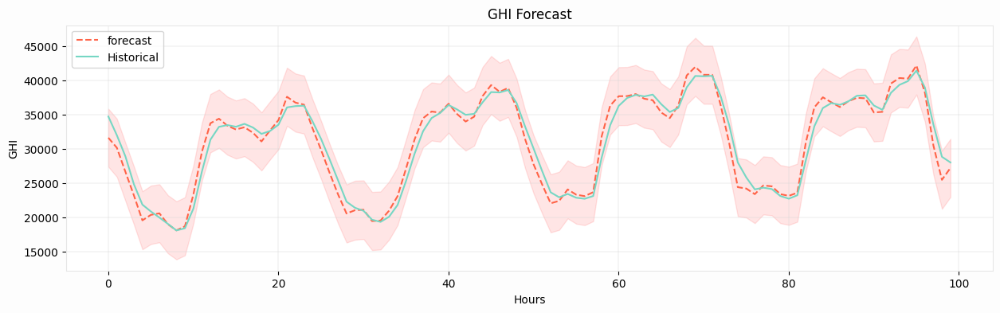

In [ ]:
# Graph
fig, ax = plt.subplots(figsize=(15,4))
npre = 4

# Plot predictions
# predict.predicted_mean[-100:].plot(ax=ax, style='r--', label='One-step-ahead forecast')
plt.plot(range(len(temp[TARGET_FEATURES[0]].iloc[-100:])), predict.predicted_mean[-100:], color = 'tomato', label = 'forecast', linestyle = '--')
ci = predict_ci[-100:]
ax.fill_between(range(len(temp[TARGET_FEATURES[1]].iloc[-100:])), ci[:,0], ci[:,1], color='r', alpha=0.1)
plt.plot(range(len(temp[TARGET_FEATURES[0]].iloc[-100:])), temp[TARGET_FEATURES[0]].iloc[-125:-25], color = '#76D7C4', label = 'Historical')
legend = ax.legend(loc='lower right')
plot_cosmos(ax,'Hours','GHI','GHI Forecast')
plt.legend()
plt.show()

In [ ]:
# Make predictions
predictions = sarimax_fit.forecast(steps=24, exog = temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-24:,:])
predict = sarimax_fit.predict(steps=24, exog = temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-24:,:])

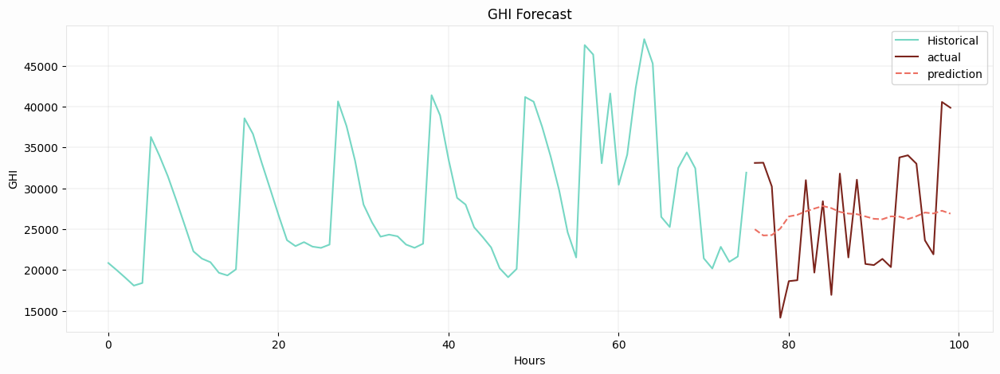

In [ ]:
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp[TARGET_FEATURES[0]].iloc[-100:-24])), temp[TARGET_FEATURES[0]].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp[TARGET_FEATURES[0]].iloc[-100:-24]),len(temp[TARGET_FEATURES[0]].iloc[-100:-24])+len(temp[TARGET_FEATURES[0]].iloc[-24:])), temp[TARGET_FEATURES[0]].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp[TARGET_FEATURES[0]].iloc[-100:-24]),len(temp[TARGET_FEATURES[0]].iloc[-100:-24])+len(temp[TARGET_FEATURES[0]].iloc[-24:])), predictions, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','GHI','GHI Forecast')
plt.legend()
plt.show()

In [ ]:
# @title ARIMAX modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = [0]
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data
  arimax_model = sm.tsa.SARIMAX(np.array(temp[TARGET_FEATURES[0]].iloc[-2000:-24]),
                                order=(6, 0, 3),
                                # seasonal_order=(0, 0, 0, int(1/0.001)),
                                exog=np.array(temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-2000:-24,:]))
  sarimax_fit_arimax = arimax_model.fit(disp=True)

  with open(f'GHI_{ll}_forecast_ARIMAX.pkl', 'wb') as file:
      pickle.dump(sarimax_fit_arimax, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_{ll}_forecast_ARIMAX.pkl'

  source_file_name = f'GHI_{ll}_forecast_ARIMAX.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_ARIMAX.pkl, None>
File GHI_0_forecast_ARIMAX.pkl uploaded to avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_ARIMAX.pkl.


In [ ]:
sarimax_fit_arimax.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 1976
Model:               SARIMAX(6, 0, 3)   Log Likelihood               20933.718
Date:                Sun, 01 Sep 2024   AIC                         -41841.436
Time:                        18:21:34   BIC                         -41768.782
Sample:                             0   HQIC                        -41814.743
                               - 1976                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             1.0000   5.18e-21   1.93e+20      0.000       1.000       1.000
x2          7.772e-14   6.01e-24   1.29e+10      0.000    7.77e-14    7.77e-14
x3          -7.91e-14   1.88e-23   -4.2e+09      0.000   -7.91e-14   -7.91e-14
ar.L1              -0   4.52e-36         -0      1.000   -8.87e-36    8.87e-36
ar.L2              -0   2.63e-30         -0      1.000   -5.15e-30    5.15e-30
ar.L3              -0   2.34e-30         -0      1.000   -4.58e-30    4.58e-30
ar.L4              -0   5.16e-30         -0      1.000   -1.01e-29    1.01e-29
ar.L5              -0   9.03e-30         -0      1.000   -1.77e-29    1.77e-29
ar.L6              -0   1.84e-29         -0      1.000   -3.61e-29    3.61e-29
ma.L1               0   4.52e-36          0      1.000   -8.87e-36    8.87e-36
ma.L2               0   4.51e-36          0      1.000   -8.84e-36    8.84e-36
ma.L3              -0    4.5e-36         -0      1.000   -8.81e-36    8.81e-36
sigma2          1e-10   4.46e-11      2.243      0.025    1.26e-11    1.87e-10
===================================================================================
Ljung-Box (L1) (Q):                1192.01   Jarque-Bera (JB):                31.16
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.09   Skew:                            -0.30
Prob(H) (two-sided):                  0.26   Kurtosis:                         2.85
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number    inf. Standard errors may be unstable.
"""

In [ ]:
# Make predictions
predictions_arimax = sarimax_fit_arimax.forecast(steps=24, exog = temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-24:,:])

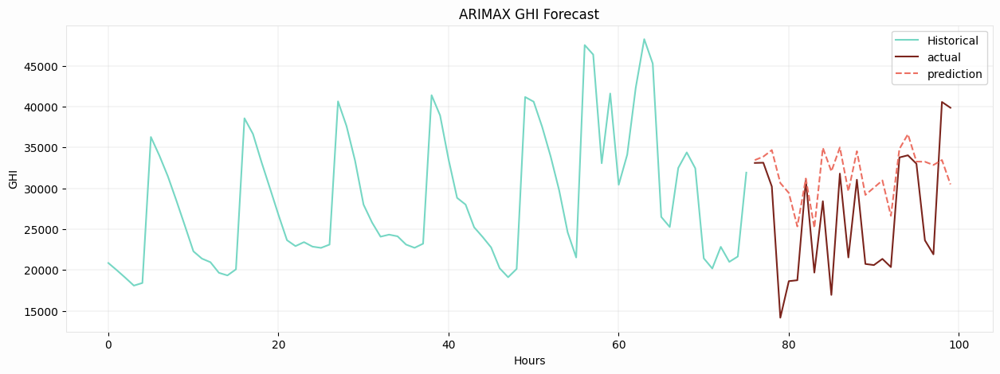

In [ ]:
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp[TARGET_FEATURES[0]].iloc[-100:-24])), temp[TARGET_FEATURES[0]].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp[TARGET_FEATURES[0]].iloc[-100:-24]),len(temp[TARGET_FEATURES[0]].iloc[-100:-24])+len(temp[TARGET_FEATURES[0]].iloc[-24:])), temp[TARGET_FEATURES[0]].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp[TARGET_FEATURES[0]].iloc[-100:-24]),len(temp[TARGET_FEATURES[0]].iloc[-100:-24])+len(temp[TARGET_FEATURES[0]].iloc[-24:])), predictions_arimax, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','GHI','ARIMAX GHI Forecast')
plt.legend()
plt.show()

<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_SARIMAA.pkl, None>
File GHI_0_forecast_SARIMA.pkl uploaded to avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_SARIMAA.pkl.


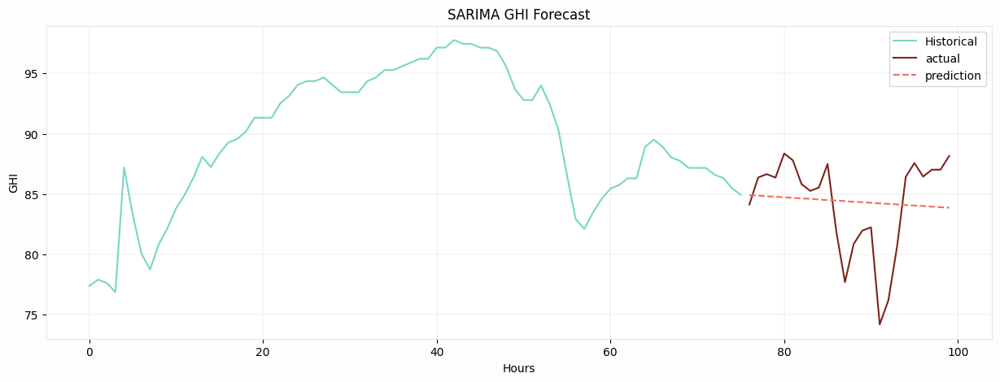

In [ ]:
# @title SARIMA modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data[weather_data['ll_label'] == ll]
  sarima_model = sm.tsa.SARIMAX(np.array(temp[TARGET_FEATURES[1]].iloc[:-24]),
                                order=(6, 0, 3),
                                seasonal_order=(0, 0, 0, int(1/0.001))
                                # exog=np.array(temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-2000:-24,:])
                                )
  sarimax_fit_sarima = sarima_model.fit(disp=True)

  with open(f'GHI_{ll}_forecast_SARIMA.pkl', 'wb') as file:
      pickle.dump(sarimax_fit_sarima, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_{ll}_forecast_SARIMAA.pkl'

  source_file_name = f'GHI_{ll}_forecast_SARIMA.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break
sarimax_fit_sarima.summary()
# Make predictions
predictions_sarima = sarimax_fit_sarima.forecast(steps=24)
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24])), temp[TARGET_FEATURES[1]].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), temp[TARGET_FEATURES[1]].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), predictions_sarima, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','GHI','SARIMA GHI Forecast')
plt.legend()
plt.show()

# Supply

In [ ]:
QUERY = f'''SELECT TIMESTAMP(a.utc_timestamp) AS utc_timestamp,
                    GB_GBN_load_actual_entsoe_transparency,
                    GB_GBN_load_forecast_entsoe_transparency,
                    GB_GBN_price_day_ahead,
                    GB_GBN_solar_capacity,
                    GB_GBN_solar_generation_actual,
                    GB_GBN_solar_profile,
                    GB_GBN_wind_capacity,
                    GB_GBN_wind_generation_actual,
                    GB_GBN_wind_profile,
                    GB_GBN_wind_offshore_capacity,
                    GB_GBN_wind_offshore_generation_actual,
                    GB_GBN_wind_offshore_profile,
                    GB_GBN_wind_onshore_capacity,
                    GB_GBN_wind_onshore_generation_actual,
                    GB_GBN_wind_onshore_profile,
                    b.*
FROM revx-259410.Avishek_Explore.load_supply_timeseries a
LEFT JOIN revx-259410.Avishek_Explore.weather_data_UK_overall b
ON TIMESTAMP(a.utc_timestamp) = b.date_hour; '''
query_job = client.query(QUERY)  # API request
weather_data = query_job.result().to_dataframe()
weather_data.sort_values('date_hour', ascending = True, inplace = True)

## Solar

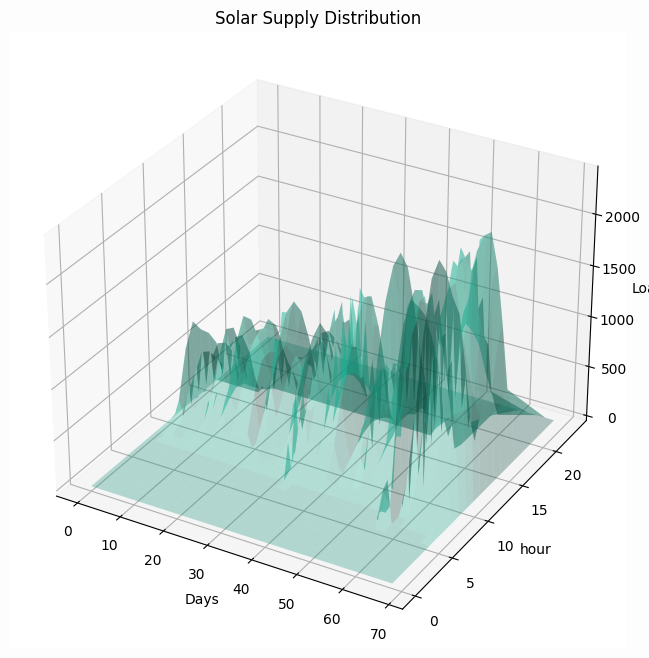

In [ ]:
# @title Supply Distribution UK

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import pandas as pd

from sklearn.preprocessing import LabelEncoder

# Initialize the LabelEncoder
label_encoder = LabelEncoder()
weather_data['date'] = weather_data['date_hour'].dt.date
# Encode 'color' column
weather_data['date_encoded'] = label_encoder.fit_transform(weather_data['date'])

# Pivot the data to get 2D arrays
pivot_table = weather_data.iloc[:24*30].pivot(index='hour', columns='date_encoded', values='GB_GBN_solar_generation_actual').fillna(0)

# Ensure X, Y, and Z are 2D arrays
X, Y = np.meshgrid(pivot_table.columns, pivot_table.index)
Z = pivot_table.values

X = np.asarray(X, dtype=int)
Y = np.asarray(Y, dtype=int)
Z = np.asarray(Z, dtype=float)

if np.isnan(Z).any():
    print("Warning: Data contains NaN values.")
    Z = np.nan_to_num(Z)  # Replace NaNs with zero

# Create figure and 3D axis
fig = plt.figure(figsize = (30,8))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
ax.plot_surface(X, Y, Z,  alpha = 0.3, color = '#1abc9c')

# Add labels
ax.set_xlabel('Date')
ax.set_ylabel('Hour')
ax.set_zlabel('Load')

# Optionally, add a title or custom function for additional customization
ax.set_title('Solar Supply Distribution')

plot_cosmos(ax,'Days','hour','Solar Supply Distribution')

# Show the plot
plt.show()

In [ ]:
weather_data.sort_values('date_hour',ascending = True, inplace = True)

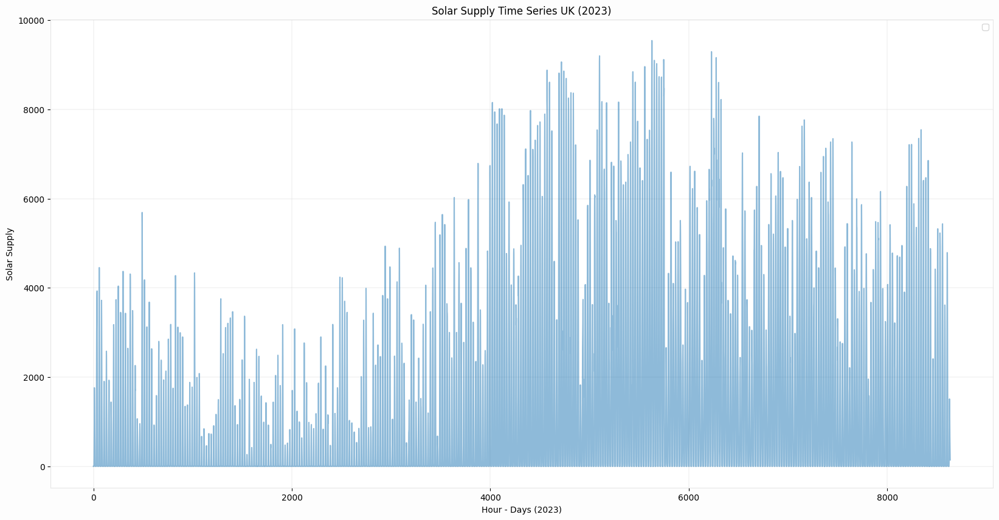

In [ ]:
fig = plt.figure(figsize = (20,10))
ax = plt.axes()



plt.plot(range(len(weather_data))[0:30*24*12],weather_data['GB_GBN_solar_generation_actual'].values[-30*12*24:], alpha = 0.5)
plt.legend()
plot_cosmos(ax,'Hour - Days (2023)','Solar Supply','Solar Supply Time Series UK (2023)')
plt.show()

In [ ]:
i = 0
for c in weather_data.columns:
  print(f"'{c}'",end = ', ')
  i += 1
  if i%6 == 0:
    print('\n')

'll_label', 'date_hour', 'temperature_2m', 'relative_humidity_2m', 'dew_point_2m', 'apparent_temperature', 

'precipitation', 'rain', 'snowfall', 'snow_depth', 'weather_code', 'pressure_msl', 

'surface_pressure', 'cloud_cover', 'cloud_cover_low', 'cloud_cover_mid', 'cloud_cover_high', 'et0_fao_evapotranspiration', 

'vapour_pressure_deficit', 'wind_speed_10m', 'wind_speed_100m', 'wind_direction_10m', 'wind_direction_100m', 'wind_gusts_10m', 

'soil_temperature_0_to_7cm', 'soil_temperature_7_to_28cm', 'soil_temperature_28_to_100cm', 'soil_temperature_100_to_255cm', 'soil_moisture_0_to_7cm', 'soil_moisture_7_to_28cm', 

'soil_moisture_28_to_100cm', 'soil_moisture_100_to_255cm', 'shortwave_radiation', 'direct_radiation', 'diffuse_radiation', 'direct_normal_irradiance', 

'global_tilted_irradiance', 'terrestrial_radiation', 'shortwave_radiation_instant', 'direct_radiation_instant', 'diffuse_radiation_instant', 'direct_normal_irradiance_instant', 

'global_tilted_irradiance_instant', 'terr

In [ ]:
weather_data.fillna(0,inplace = True)

In [ ]:
TIME_FEATURE = ['date_hour']
TARGET_FEATURES = ['GB_GBN_solar_generation_actual','shortwave_radiation']
FEATURES = [ 'temperature_2m', 'relative_humidity_2m', 'dew_point_2m', 'apparent_temperature',
'precipitation', 'rain', 'snowfall', 'snow_depth', 'weather_code', 'pressure_msl',
'surface_pressure', 'cloud_cover', 'cloud_cover_low', 'cloud_cover_mid', 'cloud_cover_high', 'et0_fao_evapotranspiration',
'vapour_pressure_deficit', 'wind_speed_10m', 'wind_speed_100m', 'wind_direction_10m', 'wind_direction_100m', 'wind_gusts_10m',
'soil_temperature_0_to_7cm', 'soil_temperature_7_to_28cm', 'soil_temperature_28_to_100cm', 'soil_temperature_100_to_255cm',
'soil_moisture_0_to_7cm', 'soil_moisture_7_to_28cm',
'soil_moisture_28_to_100cm', 'soil_moisture_100_to_255cm', 'shortwave_radiation',
'direct_radiation', 'diffuse_radiation', 'direct_normal_irradiance',
'global_tilted_irradiance', 'terrestrial_radiation', 'shortwave_radiation_instant',
'direct_radiation_instant', 'diffuse_radiation_instant', 'direct_normal_irradiance_instant',
'global_tilted_irradiance_instant', 'terrestrial_radiation_instant']

GEO_FEATURES = ['ll_label']

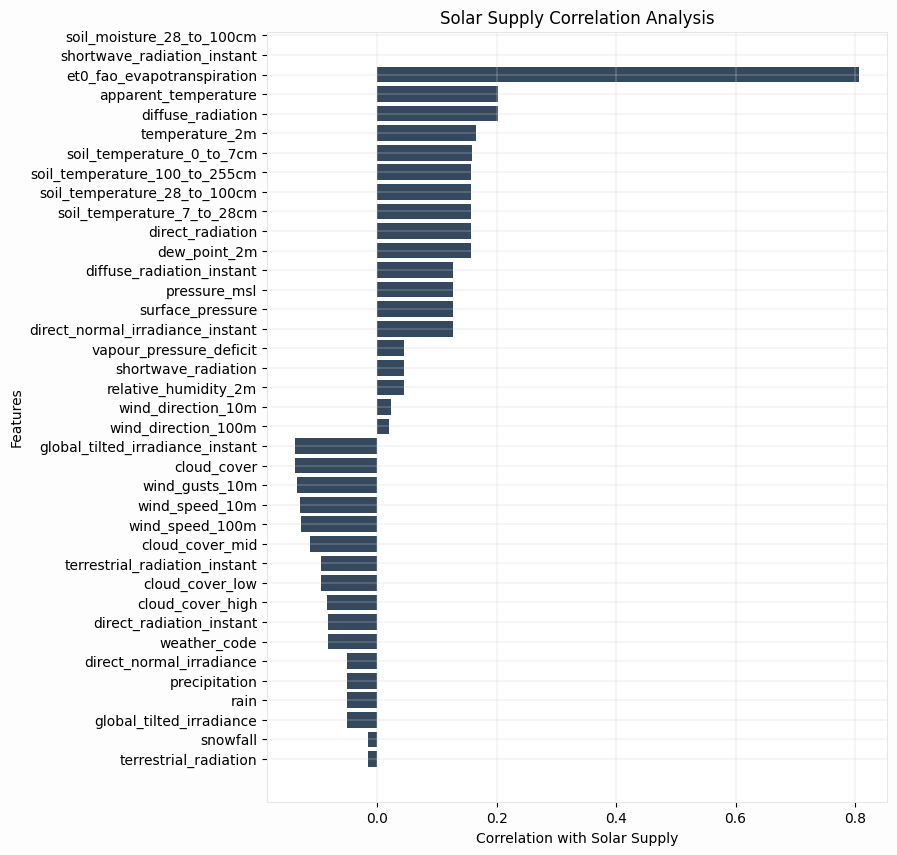

In [ ]:
# @title Features Importance Analysis
# @markdown Which features can help us determine GHI accuartely?

from scipy.stats import pearsonr

# # Calculate Pearson correlation coefficient
# pearson_correlation, p_value = pearsonr(x, y)

# print("Pearson Correlation Coefficient:", pearson_correlation)
# print("P-value:", p_value)

corr_list = []
corr_col = []

for col in FEATURES:
  corr_list.append(pearsonr(weather_data[col],weather_data[TARGET_FEATURES[0]])[0])
  corr_col.append(col)

corr_df = pd.DataFrame(np.array([corr_col,corr_list]).T , columns = ['Features','Correlation with Solar Supply'])
corr_df.sort_values('Correlation with Solar Supply',ascending = True,inplace = True)
corr_df['Correlation with Solar Supply'] = corr_df['Correlation with Solar Supply'].astype(float)

fig = plt.figure(figsize = (8,10))
ax = plt.axes()
plt.barh(corr_df['Features'],corr_df['Correlation with Solar Supply'], color = '#34495e')
plot_cosmos(ax,'Correlation with Solar Supply','Features','Solar Supply Correlation Analysis')

In [ ]:
corr_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 120 entries, 83 to 0
Data columns (total 2 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   Features                      120 non-null    object
 1   Correlation with Temperature  120 non-null    object
dtypes: object(2)
memory usage: 2.8+ KB


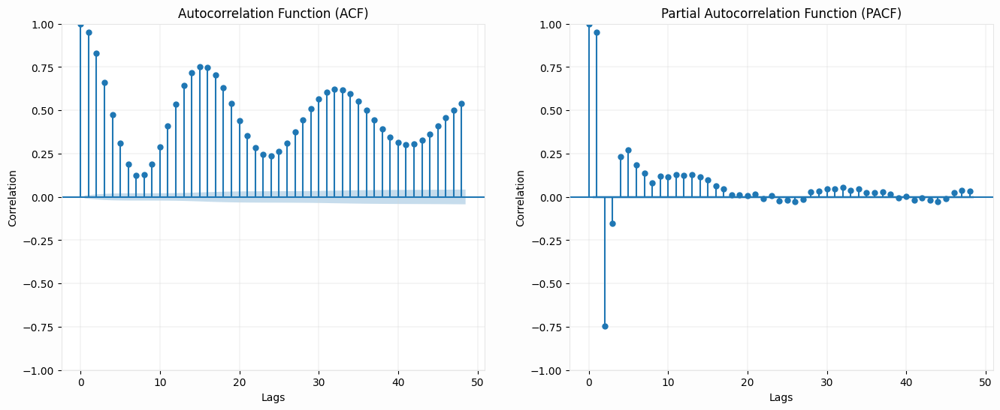

In [ ]:
# @title ACF and PACF

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

weather_data['ll_label'] = 0

# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()

# Loop through each unique location
for ll in unique_locations:
    # Filter the data for the specific location
    location_data = weather_data[(weather_data['ll_label'] == ll) ]

    # Extract the temperature_2m series for ACF and PACF
    temp_series = location_data['GB_GBN_solar_generation_actual'].dropna()

    # Plot ACF and PACF
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    # fig.suptitle(f'Location: ({ll})', fontsize=16)

    plot_acf(temp_series, ax=axes[0], lags=48)
    plot_cosmos(axes[0],'Lags','Correlation','Autocorrelation Function (ACF)')

    plot_pacf(temp_series, ax=axes[1], lags=48)
    plot_cosmos(axes[1],'Lags','Correlation','Partial Autocorrelation Function (PACF)')

    plt.show()

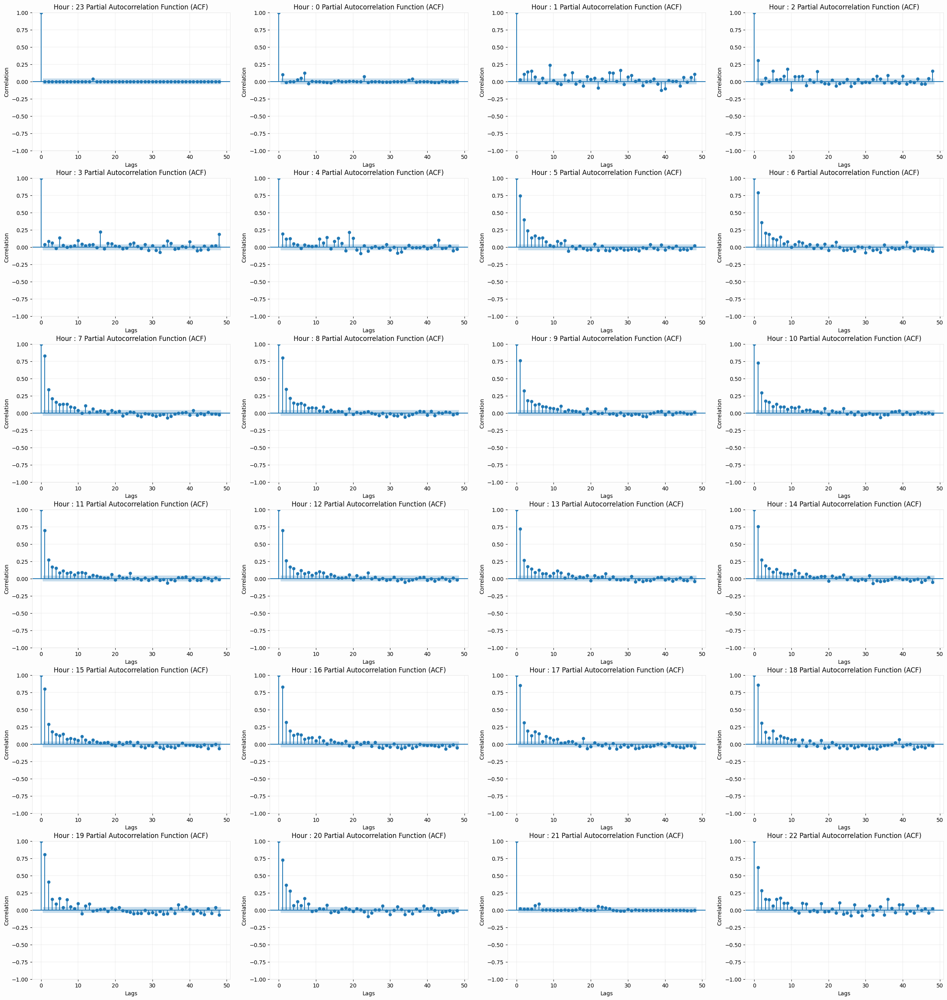

In [ ]:
# @title ACF and PACF

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

weather_data['ll_label'] = 0

# Get unique latitude and longitude combinations
hours = weather_data['hour'].unique()

fig, axes = plt.subplots(6, 4, figsize=(30, 32))
i = 0
j = 0

# Loop through each unique location
for h in hours:
    # Filter the data for the specific location
    location_data = weather_data[(weather_data['hour'] == h) ]

    # Extract the temperature_2m series for ACF and PACF
    temp_series = location_data['GB_GBN_solar_generation_actual'].dropna()

    # Plot ACF and PACF

    # fig.suptitle(f'Location: ({ll})', fontsize=16)

    plot_pacf(temp_series, ax=axes[i][j], lags=48)
    plot_cosmos(axes[i][j],'Lags','Correlation',f'Hour : {h} Partial Autocorrelation Function (ACF)')
    j+=1
    # plot_pacf(temp_series, ax=axes[i][j], lags=48)
    # plot_cosmos(axes[i][j],'Lags','Correlation',f'Hour : {h} Partial Autocorrelation Function (PACF)')

    if j > 3:
      i += 1
      j = 0

plt.show()

In [ ]:
# @title Stationarity Test (Augmented Dickey Fuller)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller

# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()

# Loop through each unique location
for ll in unique_locations:
    # Filter the data for the specific location
    location_data = weather_data[(weather_data['ll_label'] == ll) ]

    # Extract the temperature_2m series for ACF and PACF
    temp_series = location_data['GB_GBN_solar_generation_actual'].dropna()

    # # Plot ACF and PACF
    # fig, axes = plt.subplots(1, 1, figsize=(16, 6))
    # fig.suptitle(f'Location: ({ll})', fontsize=16)

    # # Plot the time series
    # plt.plot(range(len(temp_series)),temp_series, alpha = 0.3, color = 'tomato')

    # plot_cosmos(axes,'time','GHI',f'GHI Time Series')

    # Perform the Augmented Dickey-Fuller test
    result = adfuller(temp_series)

    # Output the results
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

    # Interpretation
    if result[1] > 0.05:
        print("Fail to reject the null hypothesis (non-stationary).")
    else:
        print("Reject the null hypothesis (stationary).")

    plt.show()


ADF Statistic: -6.435636265027602
p-value: 1.6555549358544495e-08
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567
Reject the null hypothesis (stationary).


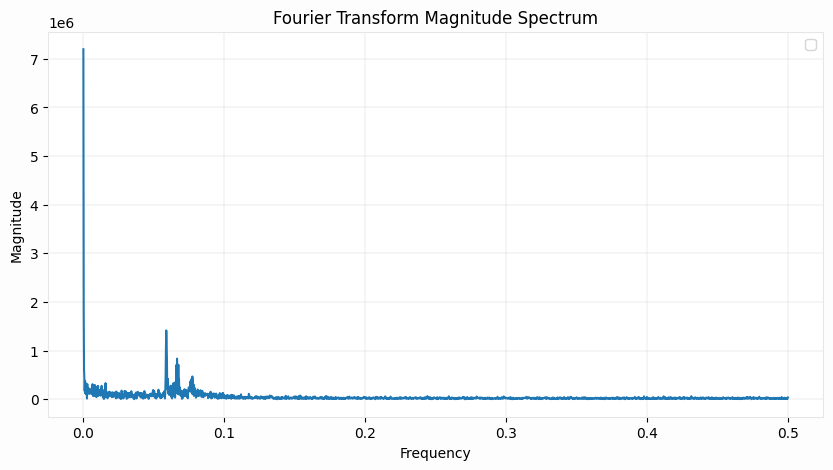

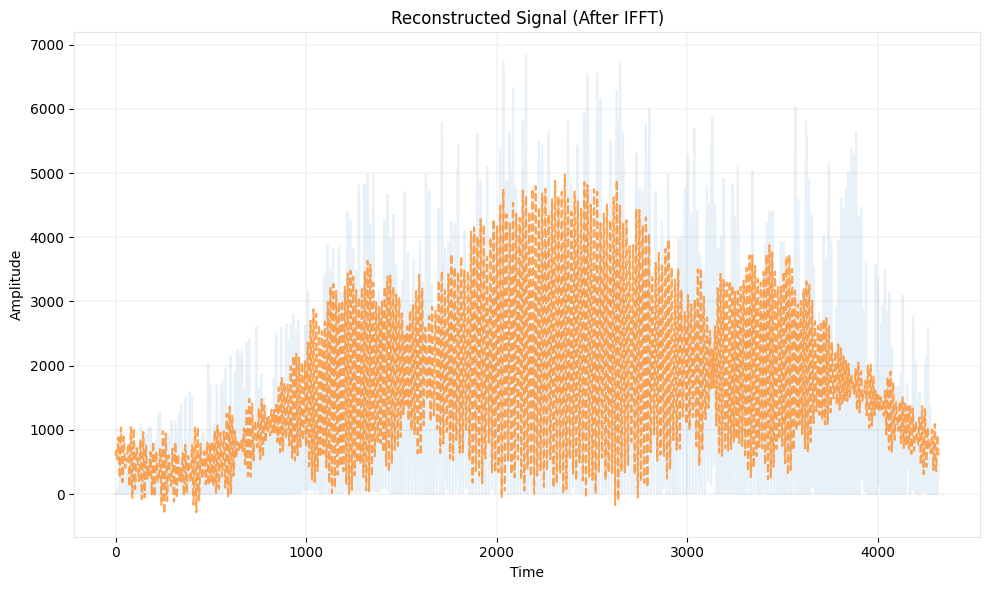

In [ ]:
# @title Seasonality Test using FFT
filtered_data = weather_data[(weather_data['country'] == 'UK')]

# Get unique latitude and longitude combinations
unique_locations = filtered_data['ll_label'].unique()

fourier_locs = dict()
fig,ax = plt.subplots(1,1,figsize=(10, 5))
# ax1 = plt.axes()
# Loop through each unique location
i = 0
j = 0
k = 0
for ll in unique_locations:

    # Filter the data for the specific location
    location_data = filtered_data[(filtered_data['ll_label'] == ll)]
    time_series = location_data['GB_GBN_solar_generation_actual'].dropna()[0:180*24]


    # Assuming `time_series` is your time series data
    fft_result = np.fft.fft(time_series)
    fft_freq = np.fft.fftfreq(len(time_series))

    # Only keep the positive frequencies (the FFT result is symmetric)
    positive_frequencies = fft_freq[:len(fft_freq)//2]
    positive_fft_result = np.abs(fft_result[:len(fft_result)//2])

    fourier_locs[ll] = {'fft_result': fft_result, 'fft_freq': fft_freq}

    # Plotting the magnitude spectrum

    plt.plot(positive_frequencies, positive_fft_result)
    plot_cosmos(ax,'Frequency','Magnitude',f'Fourier Transform Magnitude Spectrum')
    ax.legend()

    k += 1

    if k >= 2:
        k = 0
        j+=1


# plot_cosmos(ax1,'Frequency','Magnitude','Magnitude Spectrum')
plt.show()

magnitudes = np.abs(fft_result)

top_n = 30
# Find indices of the top N frequencies
top_indices = np.argsort(magnitudes)[-top_n:]

# Create a new FFT result array, keeping only the top frequencies
filtered_fft_result = np.zeros_like(fft_result)
filtered_fft_result[top_indices] = fft_result[top_indices]

# Perform Inverse Fast Fourier Transform (IFFT) using only the top frequencies
reconstructed_signal = np.fft.ifft(filtered_fft_result)


# Plot the original and reconstructed signals
plt.figure(figsize=(10, 6))
ax = plt.axes()

plt.plot(range(len(time_series)), time_series, label='Original Signal', alpha = 0.1)
plt.plot(range(len(reconstructed_signal)), reconstructed_signal.real, label='Reconstructed Signal', linestyle='--', alpha = 0.7)

plot_cosmos(ax,'Time','Amplitude',f'Reconstructed Signal (After IFFT)')

plt.tight_layout()
plt.show()

In [ ]:
for k,v in fourier_locs.items():
  top_indices = np.argpartition(-fourier_locs[k]['fft_result'], 3)[:3]
  print(top_indices)
  # print(np.argmax(fourier_locs[k]['fft_result'].real))
  # print(fourier_locs[k]['fft_result'].real)
  print(fourier_locs[k]['fft_freq'][top_indices])

[   0 4319    1]
[ 0.         -0.00023148  0.00023148]


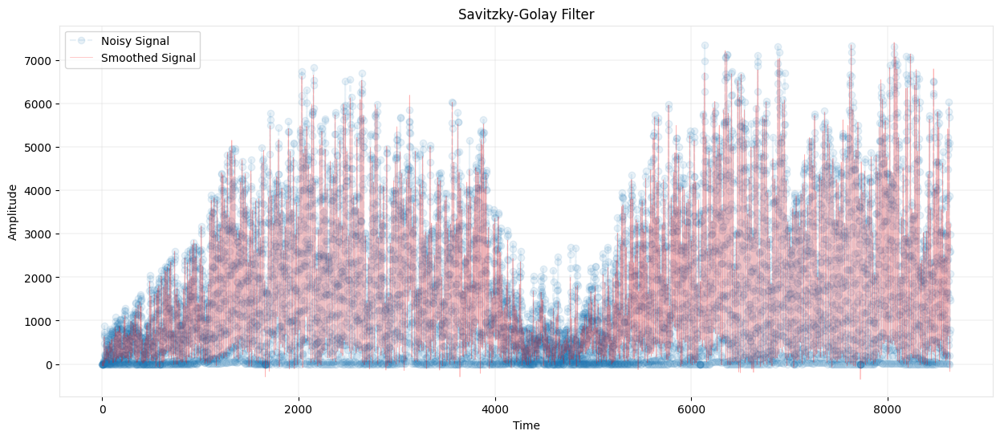

In [ ]:
# @title Savitzky-Golay

import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter

# Generate a noisy sine wave signal
np.random.seed(0)  # For reproducibility
t = range(len(weather_data.iloc[:12*30*24]))
signal = weather_data['GB_GBN_solar_generation_actual'].iloc[:12*30*24]

# Apply the Savitzky-Golay filter
window_length = 24  # Must be an odd number
polyorder = 6  # The degree of the polynomial used to fit the samples
smoothed_signal = savgol_filter(signal, window_length, polyorder)

# Plot the original and smoothed signals
plt.figure(figsize=(15, 6))
ax = plt.axes()
plt.plot(t, signal, label='Noisy Signal', linestyle='--', marker='o', alpha = 0.1)
plt.plot(t, smoothed_signal, label='Smoothed Signal', color='red', linewidth=0.5, alpha = 0.3)
plot_cosmos(ax,'Time','Amplitude',f'Savitzky-Golay Filter')
plt.title('Savitzky-Golay Filter')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()
plt.show()


In [ ]:
# @title SARIMAX modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data[weather_data['ll_label'] == ll]
  sarimax_model = sm.tsa.SARIMAX(np.array(temp[TARGET_FEATURES[0]].iloc[1:-24]),
                                order=(6, 2, 6),
                                seasonal_order=(0, 0, 0, int(1/0.00102646)),
                                enforce_stationarity=True,
                                enforce_invertibility=True,
                                time_varying_regression = True,
                                mle_regression = False,
                                exog=np.array(temp[['relative_humidity_2m','shortwave_radiation','vapour_pressure_deficit']].iloc[0:-25,:]))
  sarimax_fit = sarimax_model.fit(disp=True)

  with open(f'GHI_{ll}_forecast.pkl', 'wb') as file:
      pickle.dump(sarimax_model, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/GHI/models/temperature_sarimax_{ll}_forecast.pkl'

  source_file_name = f'GHI_{ll}_forecast.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break

<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/GHI/models/temperature_sarimax_0_forecast.pkl, None>
File GHI_0_forecast.pkl uploaded to avishek/body/Research/weather_forecast/experiment/GHI/models/temperature_sarimax_0_forecast.pkl.


In [ ]:
sarimax_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:               100775
Model:               SARIMAX(6, 2, 6)   Log Likelihood              -63023.060
Date:                Sat, 24 Aug 2024   AIC                         126078.121
Time:                        14:45:10   BIC                         126230.450
Sample:                             0   HQIC                        126124.333
                             - 100775                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1       4.852e-07      0.173    2.8e-06      1.000      -0.340       0.340
ar.L2       2.685e-06      0.453   5.92e-06      1.000      -0.889       0.889
ar.L3       3.555e-06      0.784   4.53e-06      1.000      -1.537       1.537
ar.L4       2.983e-06      1.131   2.64e-06      1.000      -2.216       2.216
ar.L5       4.365e-06      1.468   2.97e-06      1.000      -2.877       2.877
ar.L6       3.587e-06      1.766   2.03e-06      1.000      -3.462       3.462
ma.L1         -0.0088      0.328     -0.027      0.979      -0.652       0.634
ma.L2         -0.0086      0.365     -0.024      0.981      -0.725       0.707
ma.L3         -0.0085      0.326     -0.026      0.979      -0.648       0.631
ma.L4         -0.0089      0.340     -0.026      0.979      -0.674       0.657
ma.L5         -0.0089      0.354     -0.025      0.980      -0.703       0.686
ma.L6         -0.0088      0.329     -0.027      0.979      -0.653       0.635
var.x1      2.774e-05   2.82e-05      0.984      0.325   -2.75e-05     8.3e-05
var.x2      2.761e-05   2.82e-05      0.980      0.327   -2.76e-05    8.28e-05
var.x3         0.9991      0.069     14.579      0.000       0.865       1.133
sigma2         0.0427      0.023      1.866      0.062      -0.002       0.088
===================================================================================
Ljung-Box (L1) (Q):                 593.41   Jarque-Bera (JB):            815449.01
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               2.18   Skew:                            -0.18
Prob(H) (two-sided):                  0.00   Kurtosis:                        16.93
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 7.12e+17. Standard errors may be unstable.
"""

In [ ]:
res = sarimax_model.filter(sarimax_fit.params)
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()

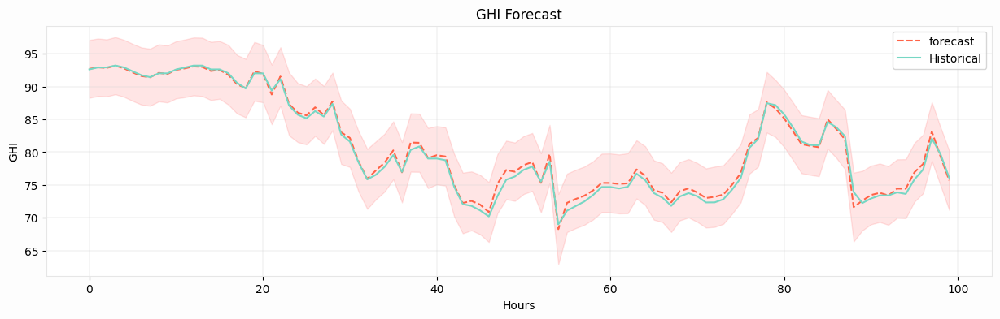

In [ ]:
# Graph
fig, ax = plt.subplots(figsize=(15,4))
npre = 4

# Plot predictions
# predict.predicted_mean[-100:].plot(ax=ax, style='r--', label='One-step-ahead forecast')
plt.plot(range(len(temp[TARGET_FEATURES[0]].iloc[-100:])), predict.predicted_mean[-100:], color = 'tomato', label = 'forecast', linestyle = '--')
ci = predict_ci[-100:]
ax.fill_between(range(len(temp[TARGET_FEATURES[1]].iloc[-100:])), ci[:,0], ci[:,1], color='r', alpha=0.1)
plt.plot(range(len(temp[TARGET_FEATURES[0]].iloc[-100:])), temp[TARGET_FEATURES[1]].iloc[-125:-25], color = '#76D7C4', label = 'Historical')
legend = ax.legend(loc='lower right')
plot_cosmos(ax,'Hours','GHI','GHI Forecast')
plt.legend()
plt.show()

In [ ]:
# Make predictions
predictions = sarimax_fit.forecast(steps=24, exog = temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-48:-24,:])
predict = sarimax_fit.predict(steps=24, exog = temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-48:-24,:])

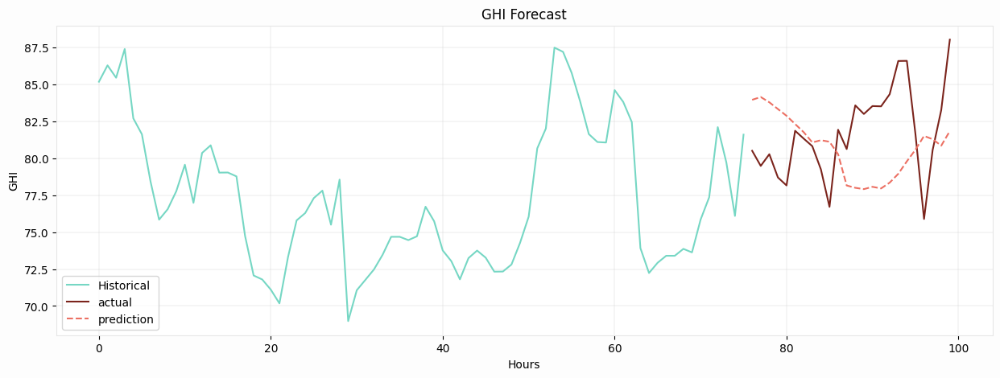

In [ ]:
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24])), temp[TARGET_FEATURES[1]].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), temp[TARGET_FEATURES[1]].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), predictions, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','GHI','GHI Forecast')
plt.legend()
plt.show()

In [ ]:
# @title ARIMAX modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data[weather_data['ll_label'] == ll]
  arimax_model = sm.tsa.SARIMAX(np.array(temp[TARGET_FEATURES[1]].iloc[-2000:-24]),
                                order=(6, 0, 3),
                                # seasonal_order=(0, 0, 0, int(1/0.001)),
                                exog=np.array(temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-2000:-24,:]))
  sarimax_fit_arimax = arimax_model.fit(disp=True)

  with open(f'GHI_{ll}_forecast_ARIMAX.pkl', 'wb') as file:
      pickle.dump(sarimax_fit_arimax, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_{ll}_forecast_ARIMAX.pkl'

  source_file_name = f'GHI_{ll}_forecast_ARIMAX.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break

<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_ARIMAX.pkl, None>
File GHI_0_forecast_ARIMAX.pkl uploaded to avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_ARIMAX.pkl.


In [ ]:
sarimax_fit_arimax.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 1976
Model:               SARIMAX(6, 0, 3)   Log Likelihood               23308.505
Date:                Tue, 09 Jul 2024   AIC                         -46591.010
Time:                        15:45:26   BIC                         -46518.355
Sample:                             0   HQIC                        -46564.316
                               - 1976                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             1.0000   9.29e-08   1.08e+07      0.000       1.000       1.000
x2         -8.574e-07   8.95e-08     -9.580      0.000   -1.03e-06   -6.82e-07
x3         -1.463e-06   1.54e-07     -9.481      0.000   -1.77e-06   -1.16e-06
ar.L1        3.26e-19   4.97e-13   6.57e-07      1.000   -9.73e-13    9.73e-13
ar.L2       6.303e-19      5e-13   1.26e-06      1.000   -9.79e-13    9.79e-13
ar.L3       9.563e-19   4.92e-13   1.94e-06      1.000   -9.65e-13    9.65e-13
ar.L4       1.239e-18   4.65e-13   2.66e-06      1.000   -9.12e-13    9.12e-13
ar.L5       1.565e-18   4.38e-13   3.58e-06      1.000   -8.58e-13    8.58e-13
ar.L6       1.869e-18    3.9e-13    4.8e-06      1.000   -7.63e-13    7.63e-13
ma.L1       -3.26e-19   4.97e-13  -6.57e-07      1.000   -9.73e-13    9.73e-13
ma.L2      -6.303e-19      5e-13  -1.26e-06      1.000   -9.79e-13    9.79e-13
ma.L3      -9.563e-19   4.92e-13  -1.94e-06      1.000   -9.65e-13    9.65e-13
sigma2      2.307e-12   5.11e-11      0.045      0.964   -9.78e-11    1.02e-10
===================================================================================
Ljung-Box (L1) (Q):                1749.68   Jarque-Bera (JB):                52.20
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.75   Skew:                            -0.40
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.01
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 7.18e+27. Standard errors may be unstable.
"""

In [ ]:
# Make predictions
predictions_arimax = sarimax_fit_arimax.forecast(steps=24, exog = temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-24:,:])

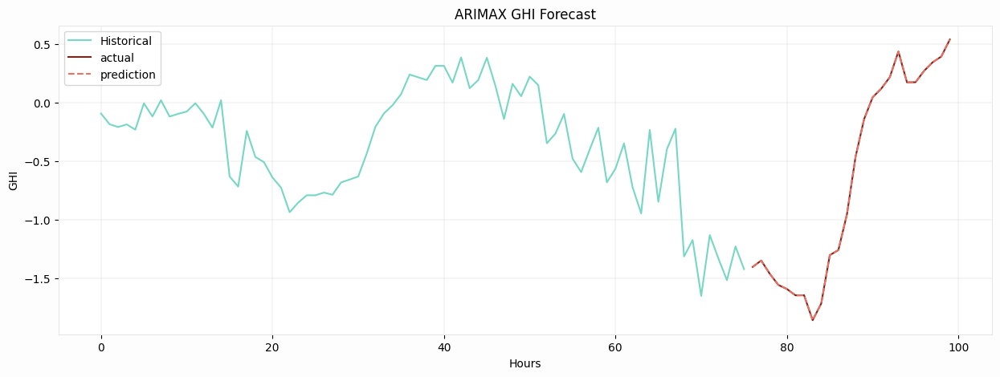

In [ ]:
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24])), temp[TARGET_FEATURES[1]].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), temp[TARGET_FEATURES[1]].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), predictions_arimax, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','GHI','ARIMAX GHI Forecast')
plt.legend()
plt.show()

<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_SARIMAA.pkl, None>
File GHI_0_forecast_SARIMA.pkl uploaded to avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_SARIMAA.pkl.


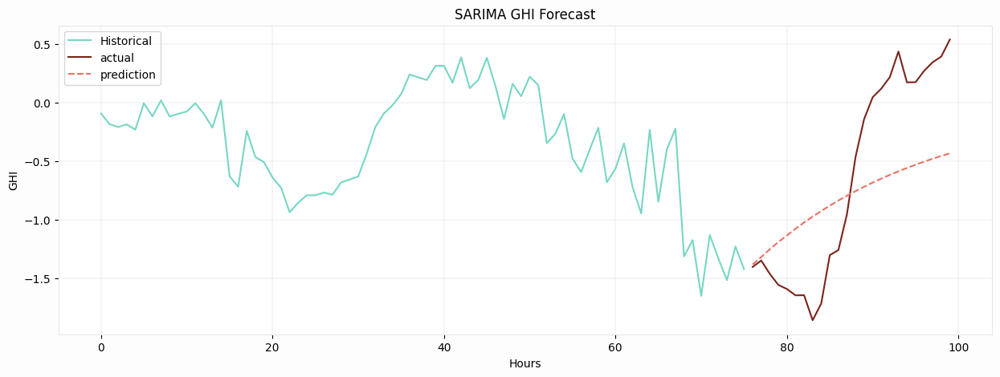

In [ ]:
# @title SARIMA modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data[weather_data['ll_label'] == ll]
  sarima_model = sm.tsa.SARIMAX(np.array(temp[TARGET_FEATURES[1]].iloc[:-24]),
                                order=(6, 0, 3),
                                seasonal_order=(0, 0, 0, int(1/0.001))
                                # exog=np.array(temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-2000:-24,:])
                                )
  sarimax_fit_sarima = sarima_model.fit(disp=True)

  with open(f'GHI_{ll}_forecast_SARIMA.pkl', 'wb') as file:
      pickle.dump(sarimax_fit_sarima, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_{ll}_forecast_SARIMAA.pkl'

  source_file_name = f'GHI_{ll}_forecast_SARIMA.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break
sarimax_fit_sarima.summary()
# Make predictions
predictions_sarima = sarimax_fit_sarima.forecast(steps=24)
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24])), temp[TARGET_FEATURES[1]].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), temp[TARGET_FEATURES[1]].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), predictions_sarima, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','GHI','SARIMA GHI Forecast')
plt.legend()
plt.show()

## Wind

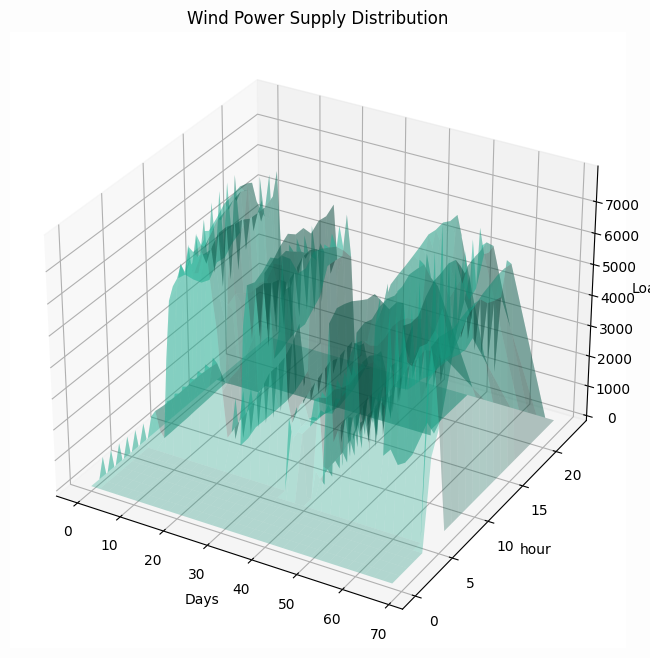

In [ ]:
# @title Wind Supply Distribution UK

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import pandas as pd

from sklearn.preprocessing import LabelEncoder

# Initialize the LabelEncoder
label_encoder = LabelEncoder()
weather_data['date'] = weather_data['date_hour'].dt.date
# Encode 'color' column
weather_data['date_encoded'] = label_encoder.fit_transform(weather_data['date'])

# Pivot the data to get 2D arrays
pivot_table = weather_data.iloc[:24*30].pivot(index='hour', columns='date_encoded', values='GB_GBN_wind_generation_actual').fillna(0)

# Ensure X, Y, and Z are 2D arrays
X, Y = np.meshgrid(pivot_table.columns, pivot_table.index)
Z = pivot_table.values

X = np.asarray(X, dtype=int)
Y = np.asarray(Y, dtype=int)
Z = np.asarray(Z, dtype=float)

if np.isnan(Z).any():
    print("Warning: Data contains NaN values.")
    Z = np.nan_to_num(Z)  # Replace NaNs with zero

# Create figure and 3D axis
fig = plt.figure(figsize = (30,8))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
ax.plot_surface(X, Y, Z,  alpha = 0.3, color = '#1abc9c')

# Add labels
ax.set_xlabel('Date')
ax.set_ylabel('Hour')
ax.set_zlabel('Load')

# Optionally, add a title or custom function for additional customization
ax.set_title('Wind Power Supply Distribution')

plot_cosmos(ax,'Days','hour','Wind Power Supply Distribution')

# Show the plot
plt.show()

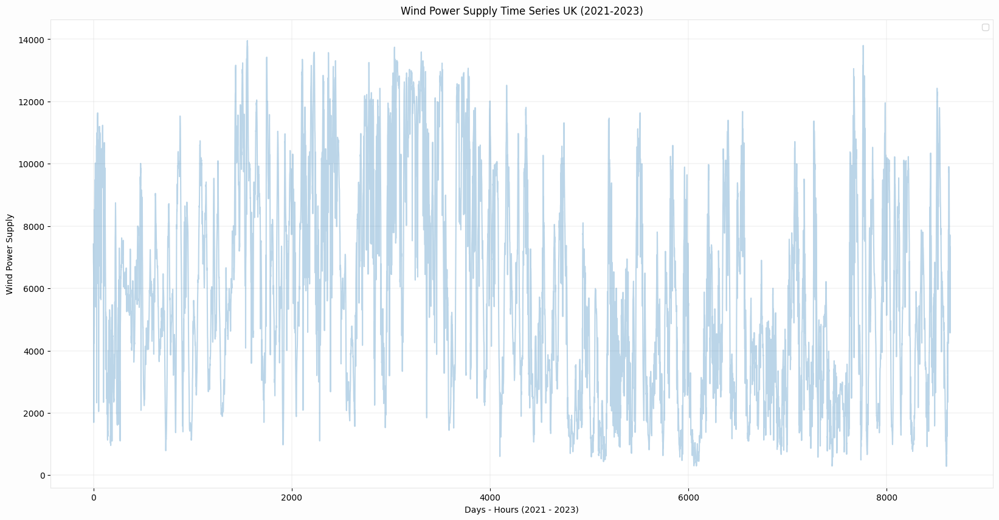

In [ ]:
fig = plt.figure(figsize = (20,10))
ax = plt.axes()

plt.plot(range(len(weather_data))[0:30*24*12],weather_data['GB_GBN_wind_generation_actual'].values[-30*12*24:], alpha = 0.3)
plt.legend()
plot_cosmos(ax,'Days - Hours (2021 - 2023)','Wind Power Supply','Wind Power Supply Time Series UK (2021-2023)')
plt.show()

In [ ]:
i = 0
for c in weather_data.columns:
  print(f"'{c}'",end = ', ')
  i += 1
  if i%6 == 0:
    print('\n')

'll_label', 'date_hour', 'temperature_2m', 'relative_humidity_2m', 'dew_point_2m', 'apparent_temperature', 

'precipitation', 'rain', 'snowfall', 'snow_depth', 'weather_code', 'pressure_msl', 

'surface_pressure', 'cloud_cover', 'cloud_cover_low', 'cloud_cover_mid', 'cloud_cover_high', 'et0_fao_evapotranspiration', 

'vapour_pressure_deficit', 'wind_speed_10m', 'wind_speed_100m', 'wind_direction_10m', 'wind_direction_100m', 'wind_gusts_10m', 

'soil_temperature_0_to_7cm', 'soil_temperature_7_to_28cm', 'soil_temperature_28_to_100cm', 'soil_temperature_100_to_255cm', 'soil_moisture_0_to_7cm', 'soil_moisture_7_to_28cm', 

'soil_moisture_28_to_100cm', 'soil_moisture_100_to_255cm', 'shortwave_radiation', 'direct_radiation', 'diffuse_radiation', 'direct_normal_irradiance', 

'global_tilted_irradiance', 'terrestrial_radiation', 'shortwave_radiation_instant', 'direct_radiation_instant', 'diffuse_radiation_instant', 'direct_normal_irradiance_instant', 

'global_tilted_irradiance_instant', 'terr

In [ ]:
weather_data.fillna(0,inplace = True)

In [ ]:
TIME_FEATURE = ['date_hour']
TARGET_FEATURES = ['GB_GBN_wind_generation_actual','shortwave_radiation']
FEATURES = [ 'temperature_2m', 'relative_humidity_2m', 'dew_point_2m', 'apparent_temperature',
'precipitation', 'rain', 'snowfall', 'snow_depth', 'weather_code', 'pressure_msl',
'surface_pressure', 'cloud_cover', 'cloud_cover_low', 'cloud_cover_mid', 'cloud_cover_high', 'et0_fao_evapotranspiration',
'vapour_pressure_deficit', 'wind_speed_10m', 'wind_speed_100m', 'wind_direction_10m', 'wind_direction_100m', 'wind_gusts_10m',
'soil_temperature_0_to_7cm', 'soil_temperature_7_to_28cm', 'soil_temperature_28_to_100cm', 'soil_temperature_100_to_255cm',
'soil_moisture_0_to_7cm', 'soil_moisture_7_to_28cm',
'soil_moisture_28_to_100cm', 'soil_moisture_100_to_255cm', 'shortwave_radiation',
'direct_radiation', 'diffuse_radiation', 'direct_normal_irradiance',
'global_tilted_irradiance', 'terrestrial_radiation', 'shortwave_radiation_instant',
'direct_radiation_instant', 'diffuse_radiation_instant', 'direct_normal_irradiance_instant',
'global_tilted_irradiance_instant', 'terrestrial_radiation_instant']

GEO_FEATURES = ['ll_label']

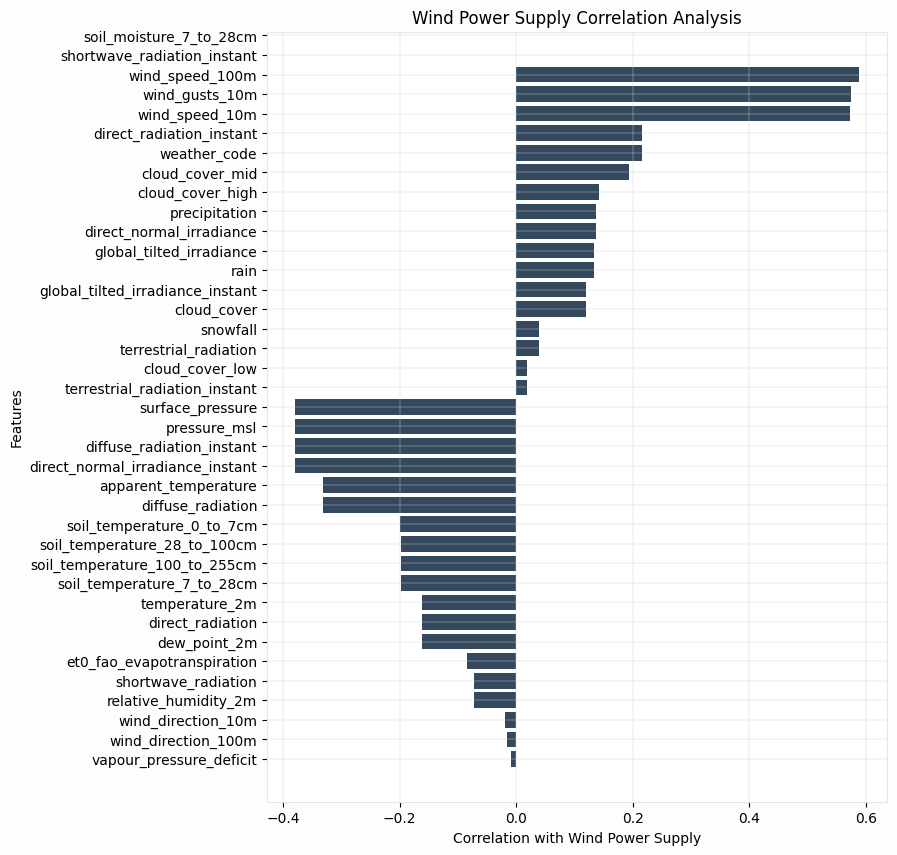

In [ ]:
# @title Features Importance Analysis
# @markdown Which features can help us determine GHI accuartely?

from scipy.stats import pearsonr

# # Calculate Pearson correlation coefficient
# pearson_correlation, p_value = pearsonr(x, y)

# print("Pearson Correlation Coefficient:", pearson_correlation)
# print("P-value:", p_value)

corr_list = []
corr_col = []

for col in FEATURES:
  corr_list.append(pearsonr(weather_data[col],weather_data[TARGET_FEATURES[0]])[0])
  corr_col.append(col)

corr_df = pd.DataFrame(np.array([corr_col,corr_list]).T , columns = ['Features','Correlation with Wind Power Supply'])
corr_df.sort_values('Correlation with Wind Power Supply',ascending = True,inplace = True)
corr_df['Correlation with Wind Power Supply'] = corr_df['Correlation with Wind Power Supply'].astype(float)

fig = plt.figure(figsize = (8,10))
ax = plt.axes()
plt.barh(corr_df['Features'],corr_df['Correlation with Wind Power Supply'], color = '#34495e')
plot_cosmos(ax,'Correlation with Wind Power Supply','Features','Wind Power Supply Correlation Analysis')

In [ ]:
corr_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 120 entries, 83 to 0
Data columns (total 2 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   Features                      120 non-null    object
 1   Correlation with Temperature  120 non-null    object
dtypes: object(2)
memory usage: 2.8+ KB


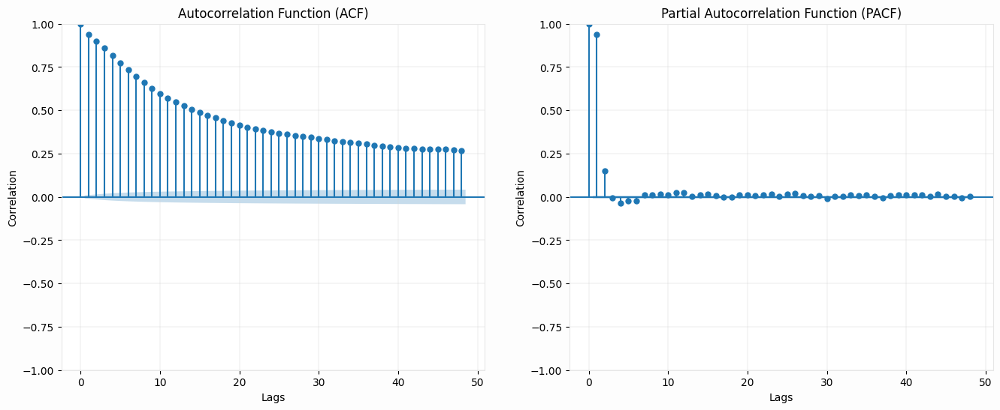

In [ ]:
# @title ACF and PACF

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

weather_data['ll_label'] = 0

# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()

# Loop through each unique location
for ll in unique_locations:
    # Filter the data for the specific location
    location_data = weather_data[(weather_data['ll_label'] == ll) ]

    # Extract the temperature_2m series for ACF and PACF
    temp_series = location_data['GB_GBN_wind_generation_actual'].dropna()

    # Plot ACF and PACF
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    # fig.suptitle(f'Location: ({ll})', fontsize=16)

    plot_acf(temp_series, ax=axes[0], lags=48)
    plot_cosmos(axes[0],'Lags','Correlation','Autocorrelation Function (ACF)')

    plot_pacf(temp_series, ax=axes[1], lags=48)
    plot_cosmos(axes[1],'Lags','Correlation','Partial Autocorrelation Function (PACF)')

    plt.show()

In [ ]:
len(hours)

24

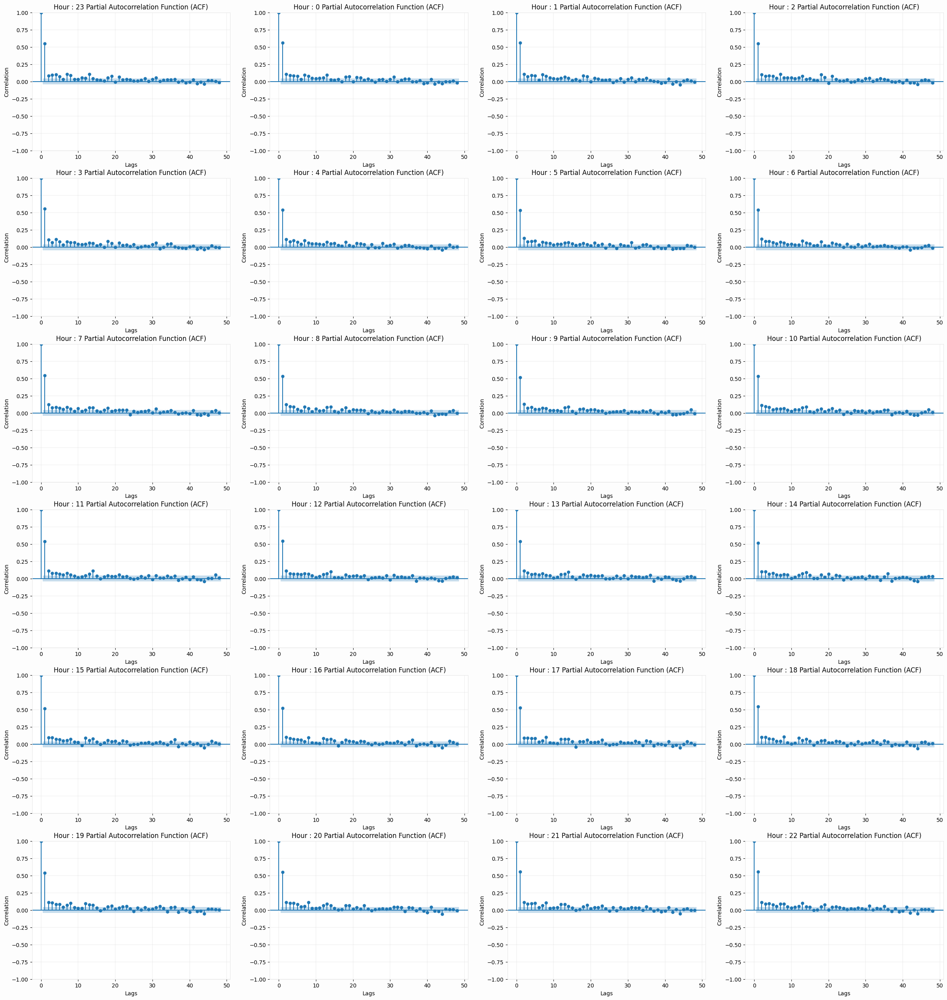

In [ ]:
# @title ACF and PACF

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

weather_data['ll_label'] = 0

# Get unique latitude and longitude combinations
hours = weather_data['hour'].unique()

fig, axes = plt.subplots(6, 4, figsize=(30, 32))
i = 0
j = 0

# Loop through each unique location
for h in hours:
    # Filter the data for the specific location
    location_data = weather_data[(weather_data['hour'] == h) ]

    # Extract the temperature_2m series for ACF and PACF
    temp_series = location_data['GB_GBN_wind_generation_actual'].dropna()

    # Plot ACF and PACF

    # fig.suptitle(f'Location: ({ll})', fontsize=16)

    plot_pacf(temp_series, ax=axes[i][j], lags=48)
    plot_cosmos(axes[i][j],'Lags','Correlation',f'Hour : {h} Partial Autocorrelation Function (ACF)')
    j+=1
    # plot_pacf(temp_series, ax=axes[i][j], lags=48)
    # plot_cosmos(axes[i][j],'Lags','Correlation',f'Hour : {h} Partial Autocorrelation Function (PACF)')

    if j > 3:
      i += 1
      j = 0

plt.show()

In [ ]:
# @title Stationarity Test (Augmented Dickey Fuller)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller

# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()

# Loop through each unique location
for ll in unique_locations:
    # Filter the data for the specific location
    location_data = weather_data[(weather_data['ll_label'] == ll) ]

    # Extract the temperature_2m series for ACF and PACF
    temp_series = location_data['GB_GBN_wind_generation_actual'].dropna()

    # # Plot ACF and PACF
    # fig, axes = plt.subplots(1, 1, figsize=(16, 6))
    # fig.suptitle(f'Location: ({ll})', fontsize=16)

    # # Plot the time series
    # plt.plot(range(len(temp_series)),temp_series, alpha = 0.3, color = 'tomato')

    # plot_cosmos(axes,'time','GHI',f'GHI Time Series')

    # Perform the Augmented Dickey-Fuller test
    result = adfuller(temp_series)

    # Output the results
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

    # Interpretation
    if result[1] > 0.05:
        print("Fail to reject the null hypothesis (non-stationary).")
    else:
        print("Reject the null hypothesis (stationary).")

    plt.show()


ADF Statistic: -17.59075405915105
p-value: 3.965058726902537e-30
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567
Reject the null hypothesis (stationary).


In [ ]:
weather_data['hour']

,hour
0,23
1,0
2,1
3,2
4,3
...,...
50352,19
50353,20
50354,21
50355,22


In [ ]:
# @title Hourly Stationarity Test (Augmented Dickey Fuller)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller

# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()

# Loop through each unique location
for h in weather_data['hour'].unique():
    # Filter the data for the specific location
    location_data = weather_data[(weather_data['hour'] == h) ].sort_values('date_hour',ascending = True)

    # Extract the temperature_2m series for ACF and PACF
    temp_series = location_data['GB_GBN_wind_generation_actual'].dropna()

    # # Plot ACF and PACF
    # fig, axes = plt.subplots(1, 1, figsize=(16, 6))
    # fig.suptitle(f'Location: ({ll})', fontsize=16)

    # # Plot the time series
    # plt.plot(range(len(temp_series)),temp_series, alpha = 0.3, color = 'tomato')

    # plot_cosmos(axes,'time','GHI',f'GHI Time Series')

    # Perform the Augmented Dickey-Fuller test
    result = adfuller(temp_series)

    # Output the results
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

    # Interpretation
    if result[1] > 0.05:
        print("Fail to reject the null hypothesis (non-stationary).")
    else:
        print("Reject the null hypothesis (stationary).")

    plt.show()


ADF Statistic: -4.462861030809903
p-value: 0.00022936350516324756
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
Reject the null hypothesis (stationary).
ADF Statistic: -3.97605587197432
p-value: 0.0015412119947907411
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
Reject the null hypothesis (stationary).
ADF Statistic: -4.3233972028365635
p-value: 0.00040454681496670695
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
Reject the null hypothesis (stationary).
ADF Statistic: -4.162596184144705
p-value: 0.0007618308455382183
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
Reject the null hypothesis (stationary).
ADF Statistic: -4.088723653335843
p-value: 0.0010109367726791043
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
Reject the null hypothesis (stationary).
ADF Statistic: -4.006817095178669
p-value: 0.0013752326130597832
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
Reject the null hypothesis (stationary).
ADF Statistic: -3.985812562801239
p-va

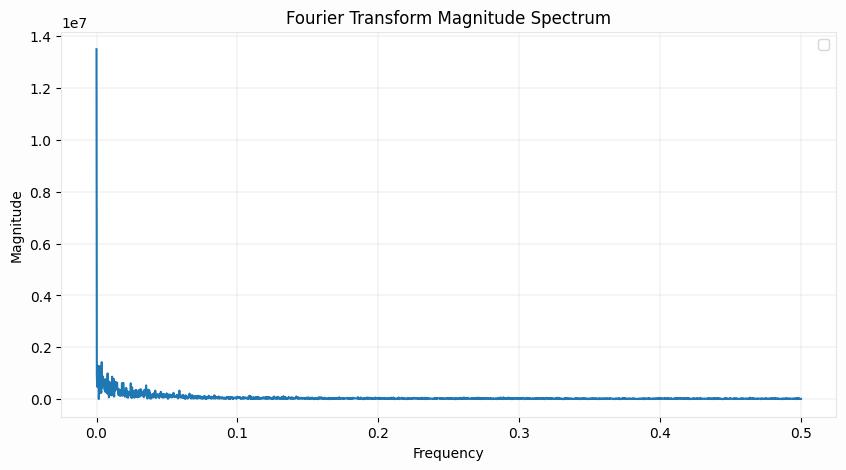

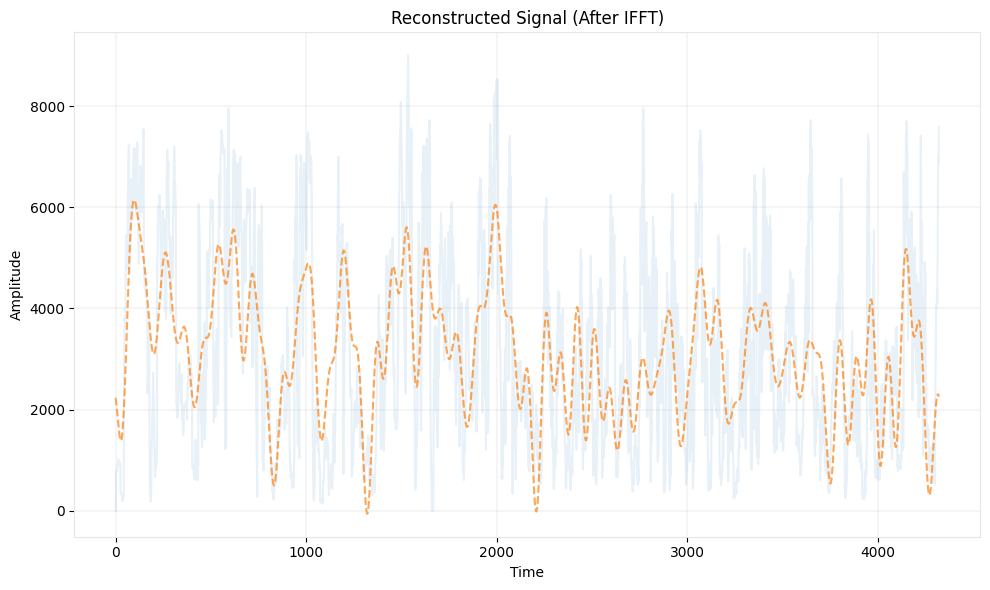

In [ ]:
# @title Seasonality Test using FFT
filtered_data = weather_data[(weather_data['country'] == 'UK')]

# Get unique latitude and longitude combinations
unique_locations = filtered_data['ll_label'].unique()

fourier_locs = dict()
fig,ax = plt.subplots(1,1,figsize=(10, 5))
# ax1 = plt.axes()
# Loop through each unique location
i = 0
j = 0
k = 0
for ll in unique_locations:

    # Filter the data for the specific location
    location_data = filtered_data[(filtered_data['ll_label'] == ll)]
    time_series = location_data['GB_GBN_wind_generation_actual'].dropna()[0:180*24]


    # Assuming `time_series` is your time series data
    fft_result = np.fft.fft(time_series)
    fft_freq = np.fft.fftfreq(len(time_series))

    # Only keep the positive frequencies (the FFT result is symmetric)
    positive_frequencies = fft_freq[:len(fft_freq)//2]
    positive_fft_result = np.abs(fft_result[:len(fft_result)//2])

    fourier_locs[ll] = {'fft_result': fft_result, 'fft_freq': fft_freq}

    # Plotting the magnitude spectrum

    plt.plot(positive_frequencies, positive_fft_result)
    plot_cosmos(ax,'Frequency','Magnitude',f'Fourier Transform Magnitude Spectrum')
    ax.legend()

    k += 1

    if k >= 2:
        k = 0
        j+=1


# plot_cosmos(ax1,'Frequency','Magnitude','Magnitude Spectrum')
plt.show()

magnitudes = np.abs(fft_result)

top_n = 30
# Find indices of the top N frequencies
top_indices = np.argsort(magnitudes)[-top_n:]

# Create a new FFT result array, keeping only the top frequencies
filtered_fft_result = np.zeros_like(fft_result)
filtered_fft_result[top_indices] = fft_result[top_indices]

# Perform Inverse Fast Fourier Transform (IFFT) using only the top frequencies
reconstructed_signal = np.fft.ifft(filtered_fft_result)


# Plot the original and reconstructed signals
plt.figure(figsize=(10, 6))
ax = plt.axes()

plt.plot(range(len(time_series)), time_series, label='Original Signal', alpha = 0.1)
plt.plot(range(len(reconstructed_signal)), reconstructed_signal.real, label='Reconstructed Signal', linestyle='--', alpha = 0.7)

plot_cosmos(ax,'Time','Amplitude',f'Reconstructed Signal (After IFFT)')

plt.tight_layout()
plt.show()

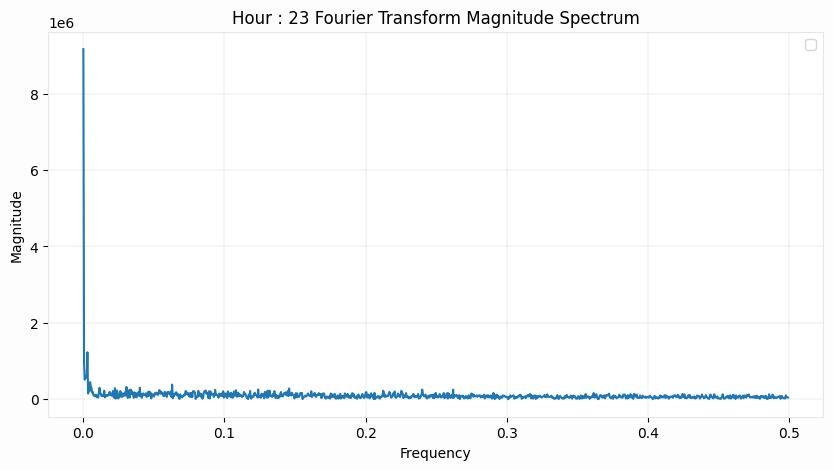

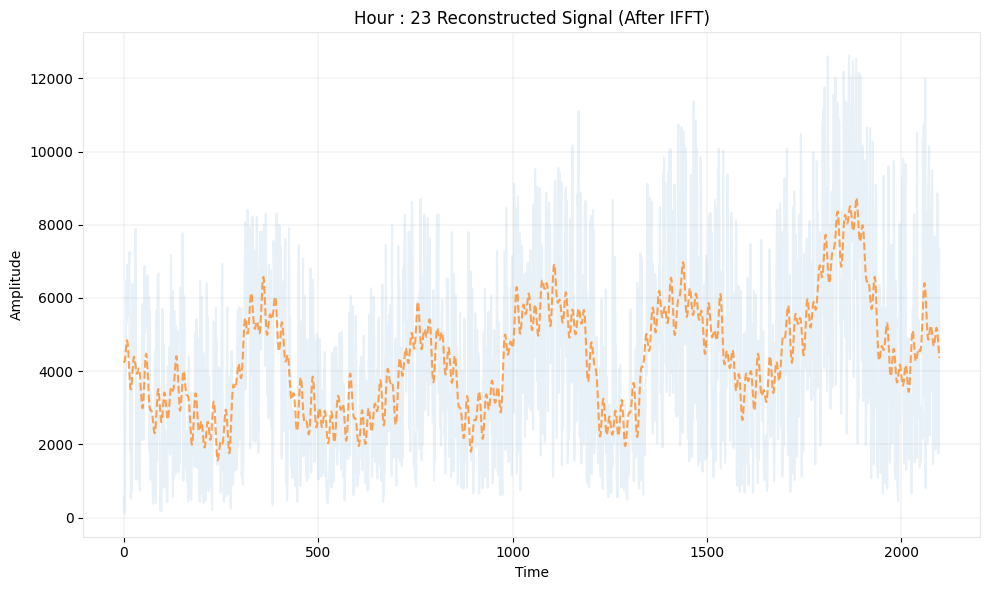

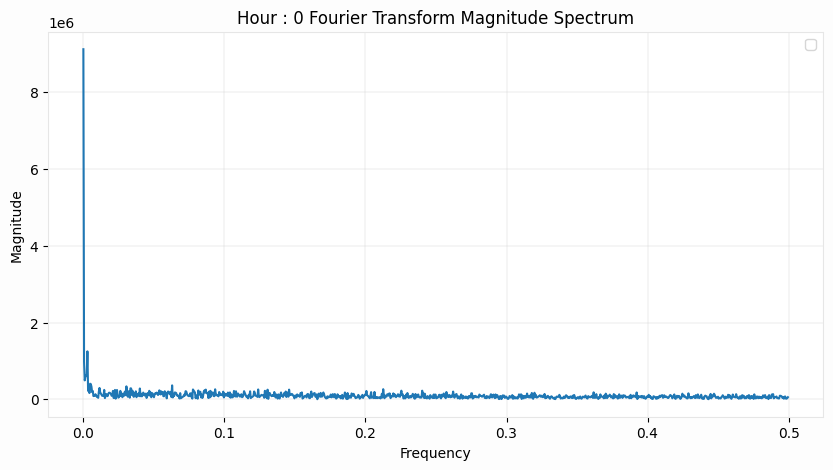

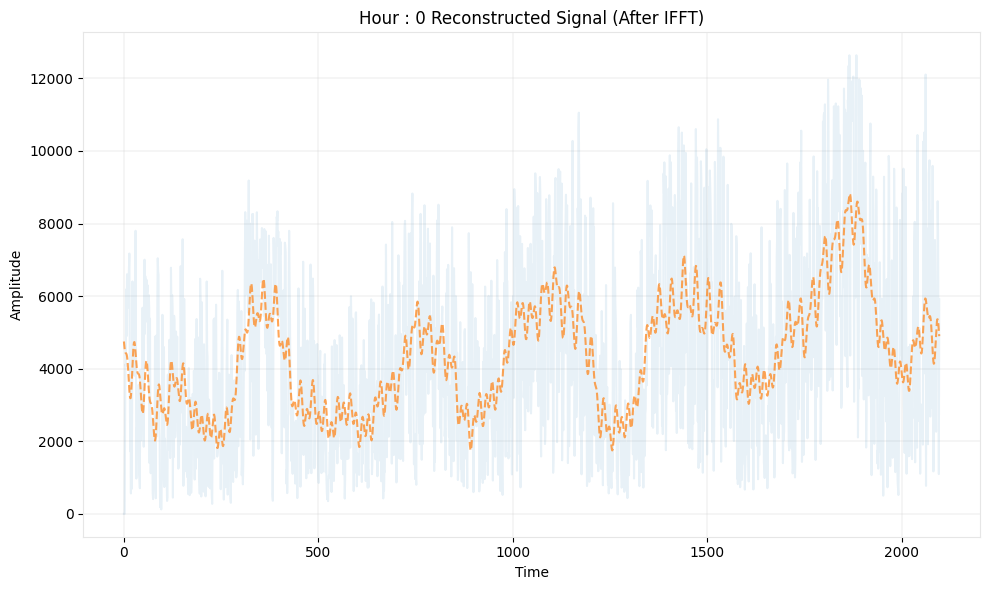

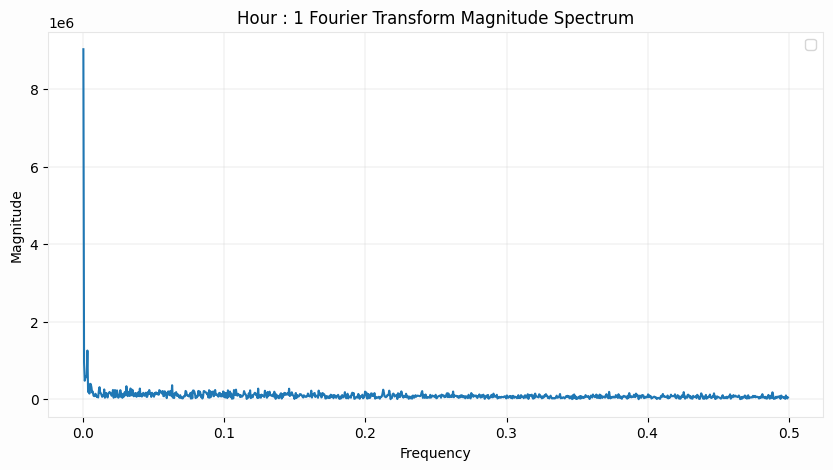

...

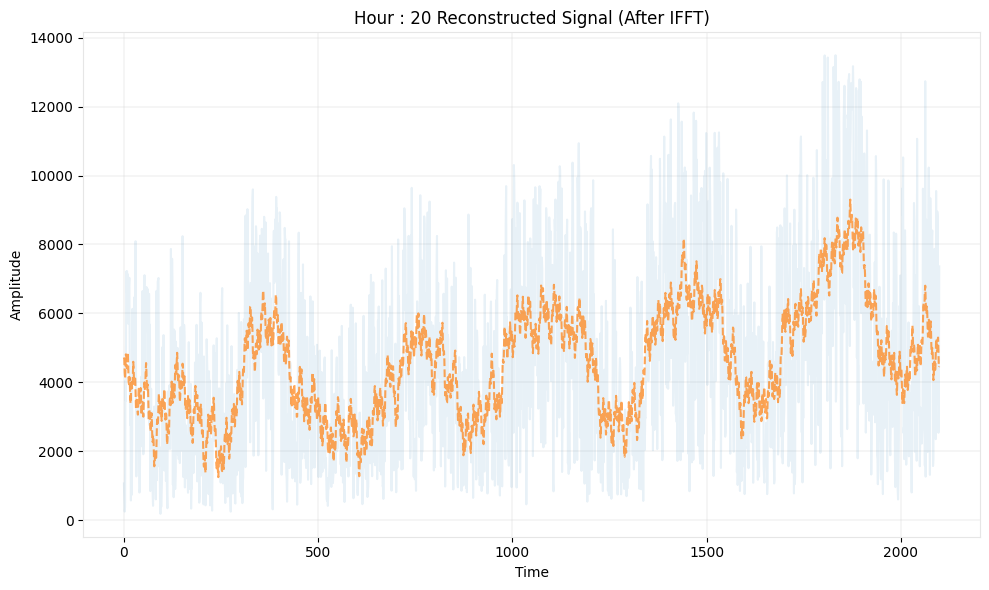

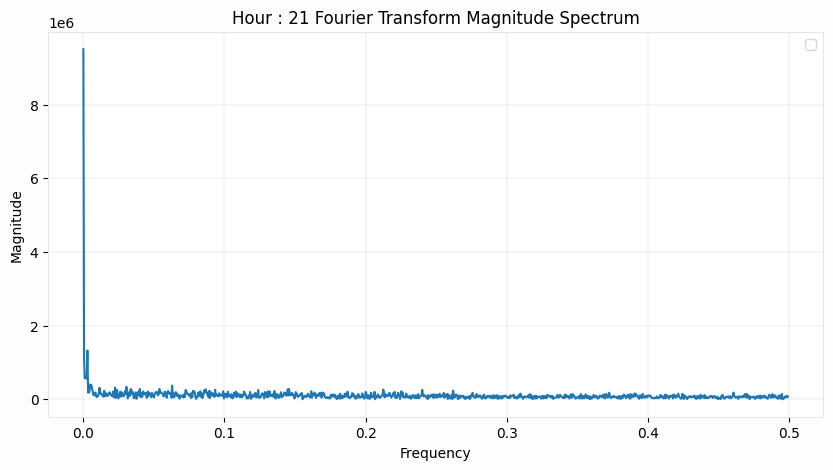

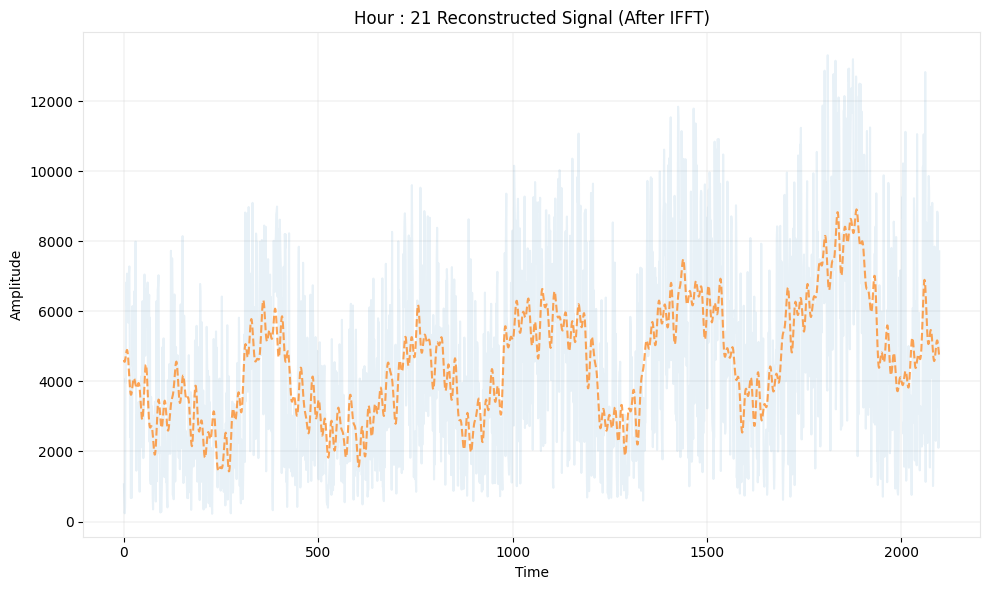

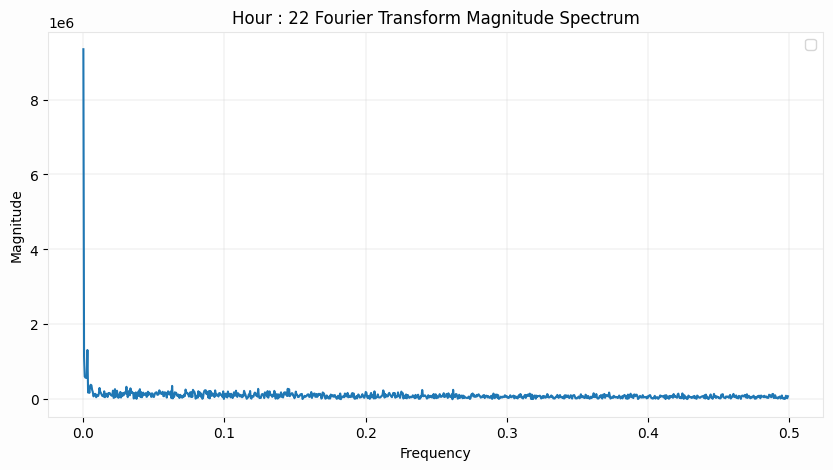

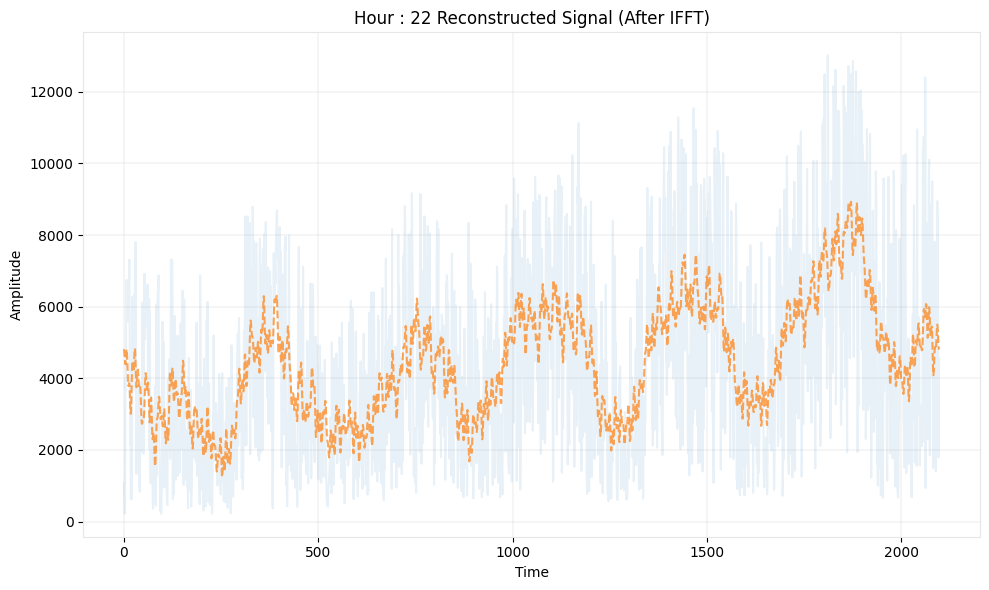

In [ ]:
# @title Hourly Seasonality Test using FFT
filtered_data = weather_data[(weather_data['country'] == 'UK')]

# Get unique latitude and longitude combinations
hours = filtered_data['hour'].unique()

fourier_locs = dict()

# ax1 = plt.axes()
# Loop through each unique location
i = 0
j = 0
k = 0
for h in hours:

    # Filter the data for the specific location
    location_data = filtered_data[(filtered_data['hour'] == h)]
    time_series = location_data['GB_GBN_wind_generation_actual'].dropna()[0:180*24]


    # Assuming `time_series` is your time series data
    fft_result = np.fft.fft(time_series)
    fft_freq = np.fft.fftfreq(len(time_series))

    # Only keep the positive frequencies (the FFT result is symmetric)
    positive_frequencies = fft_freq[:len(fft_freq)//2]
    positive_fft_result = np.abs(fft_result[:len(fft_result)//2])

    fourier_locs[h] = {'fft_result': fft_result, 'fft_freq': fft_freq}

    # Plotting the magnitude spectrum
    fig,ax = plt.subplots(1,1,figsize=(10, 5))
    plt.plot(positive_frequencies, positive_fft_result)
    plot_cosmos(ax,'Frequency','Magnitude',f'Hour : {h} Fourier Transform Magnitude Spectrum')
    ax.legend()

    k += 1

    if k >= 2:
        k = 0
        j+=1


    # plot_cosmos(ax1,'Frequency','Magnitude','Magnitude Spectrum')
    plt.show()

    magnitudes = np.abs(fft_result)

    top_n = 30
    # Find indices of the top N frequencies
    top_indices = np.argsort(magnitudes)[-top_n:]

    # Create a new FFT result array, keeping only the top frequencies
    filtered_fft_result = np.zeros_like(fft_result)
    filtered_fft_result[top_indices] = fft_result[top_indices]

    # Perform Inverse Fast Fourier Transform (IFFT) using only the top frequencies
    reconstructed_signal = np.fft.ifft(filtered_fft_result)


    # Plot the original and reconstructed signals
    plt.figure(figsize=(10, 6))
    ax = plt.axes()

    plt.plot(range(len(time_series)), time_series, label='Original Signal', alpha = 0.1)
    plt.plot(range(len(reconstructed_signal)), reconstructed_signal.real, label='Reconstructed Signal', linestyle='--', alpha = 0.7)

    plot_cosmos(ax,'Time','Amplitude',f'Hour : {h} Reconstructed Signal (After IFFT)')

    plt.tight_layout()
    plt.show()

In [ ]:
for k,v in fourier_locs.items():
  top_indices = np.argpartition(-fourier_locs[k]['fft_result'], 3)[:3]
  print(top_indices)
  # print(np.argmax(fourier_locs[k]['fft_result'].real))
  # print(fourier_locs[k]['fft_result'].real)
  print(fourier_locs[k]['fft_freq'][top_indices])

[   0 4319    1]
[ 0.         -0.00023148  0.00023148]


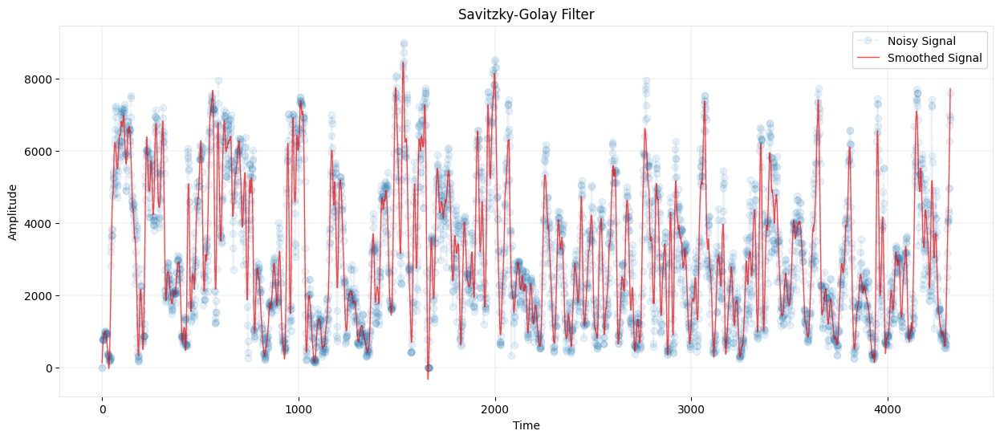

In [ ]:
# @title Savitzky-Golay

import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter

# Generate a noisy sine wave signal
np.random.seed(0)  # For reproducibility
t = range(len(weather_data.iloc[:180*24]))
signal = weather_data['GB_GBN_wind_generation_actual'].iloc[:180*24]

# Apply the Savitzky-Golay filter
window_length = 24  # Must be an odd number
polyorder = 3  # The degree of the polynomial used to fit the samples
smoothed_signal = savgol_filter(signal, window_length, polyorder)

# Plot the original and smoothed signals
plt.figure(figsize=(15, 6))
ax = plt.axes()
plt.plot(t, signal, label='Noisy Signal', linestyle='--', marker='o', alpha = 0.1)
plt.plot(t, smoothed_signal, label='Smoothed Signal', color='red', linewidth=1, alpha = 0.7)
plot_cosmos(ax,'Time','Amplitude',f'Savitzky-Golay Filter')
plt.title('Savitzky-Golay Filter')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()
plt.show()


In [ ]:
# @title SARIMAX modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data[weather_data['ll_label'] == ll]
  sarimax_model = sm.tsa.SARIMAX(np.array(temp[TARGET_FEATURES[0]].iloc[1:-24]),
                                order=(6, 2, 6),
                                seasonal_order=(0, 0, 0, int(1/0.00102646)),
                                enforce_stationarity=True,
                                enforce_invertibility=True,
                                time_varying_regression = True,
                                mle_regression = False,
                                exog=np.array(temp[['relative_humidity_2m','shortwave_radiation','vapour_pressure_deficit']].iloc[0:-25,:]))
  sarimax_fit = sarimax_model.fit(disp=True)

  with open(f'GHI_{ll}_forecast.pkl', 'wb') as file:
      pickle.dump(sarimax_model, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/GHI/models/temperature_sarimax_{ll}_forecast.pkl'

  source_file_name = f'GHI_{ll}_forecast.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break

<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/GHI/models/temperature_sarimax_0_forecast.pkl, None>
File GHI_0_forecast.pkl uploaded to avishek/body/Research/weather_forecast/experiment/GHI/models/temperature_sarimax_0_forecast.pkl.


In [ ]:
sarimax_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:               100775
Model:               SARIMAX(6, 2, 6)   Log Likelihood              -63023.060
Date:                Sat, 24 Aug 2024   AIC                         126078.121
Time:                        14:45:10   BIC                         126230.450
Sample:                             0   HQIC                        126124.333
                             - 100775                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1       4.852e-07      0.173    2.8e-06      1.000      -0.340       0.340
ar.L2       2.685e-06      0.453   5.92e-06      1.000      -0.889       0.889
ar.L3       3.555e-06      0.784   4.53e-06      1.000      -1.537       1.537
ar.L4       2.983e-06      1.131   2.64e-06      1.000      -2.216       2.216
ar.L5       4.365e-06      1.468   2.97e-06      1.000      -2.877       2.877
ar.L6       3.587e-06      1.766   2.03e-06      1.000      -3.462       3.462
ma.L1         -0.0088      0.328     -0.027      0.979      -0.652       0.634
ma.L2         -0.0086      0.365     -0.024      0.981      -0.725       0.707
ma.L3         -0.0085      0.326     -0.026      0.979      -0.648       0.631
ma.L4         -0.0089      0.340     -0.026      0.979      -0.674       0.657
ma.L5         -0.0089      0.354     -0.025      0.980      -0.703       0.686
ma.L6         -0.0088      0.329     -0.027      0.979      -0.653       0.635
var.x1      2.774e-05   2.82e-05      0.984      0.325   -2.75e-05     8.3e-05
var.x2      2.761e-05   2.82e-05      0.980      0.327   -2.76e-05    8.28e-05
var.x3         0.9991      0.069     14.579      0.000       0.865       1.133
sigma2         0.0427      0.023      1.866      0.062      -0.002       0.088
===================================================================================
Ljung-Box (L1) (Q):                 593.41   Jarque-Bera (JB):            815449.01
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               2.18   Skew:                            -0.18
Prob(H) (two-sided):                  0.00   Kurtosis:                        16.93
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 7.12e+17. Standard errors may be unstable.
"""

In [ ]:
res = sarimax_model.filter(sarimax_fit.params)
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()

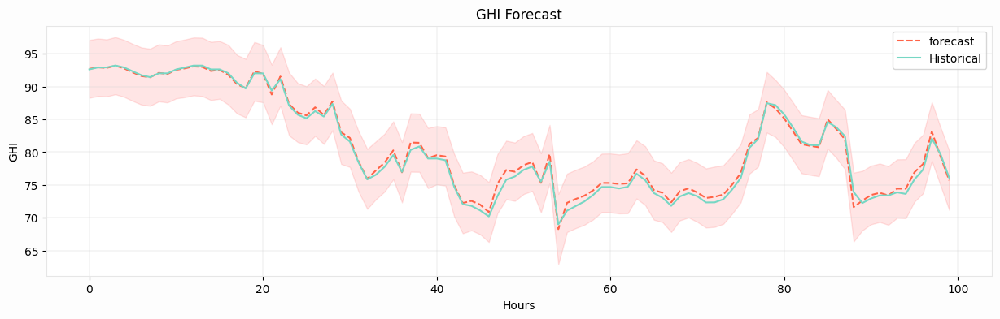

In [ ]:
# Graph
fig, ax = plt.subplots(figsize=(15,4))
npre = 4

# Plot predictions
# predict.predicted_mean[-100:].plot(ax=ax, style='r--', label='One-step-ahead forecast')
plt.plot(range(len(temp[TARGET_FEATURES[0]].iloc[-100:])), predict.predicted_mean[-100:], color = 'tomato', label = 'forecast', linestyle = '--')
ci = predict_ci[-100:]
ax.fill_between(range(len(temp[TARGET_FEATURES[1]].iloc[-100:])), ci[:,0], ci[:,1], color='r', alpha=0.1)
plt.plot(range(len(temp[TARGET_FEATURES[0]].iloc[-100:])), temp[TARGET_FEATURES[1]].iloc[-125:-25], color = '#76D7C4', label = 'Historical')
legend = ax.legend(loc='lower right')
plot_cosmos(ax,'Hours','GHI','GHI Forecast')
plt.legend()
plt.show()

In [ ]:
# Make predictions
predictions = sarimax_fit.forecast(steps=24, exog = temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-48:-24,:])
predict = sarimax_fit.predict(steps=24, exog = temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-48:-24,:])

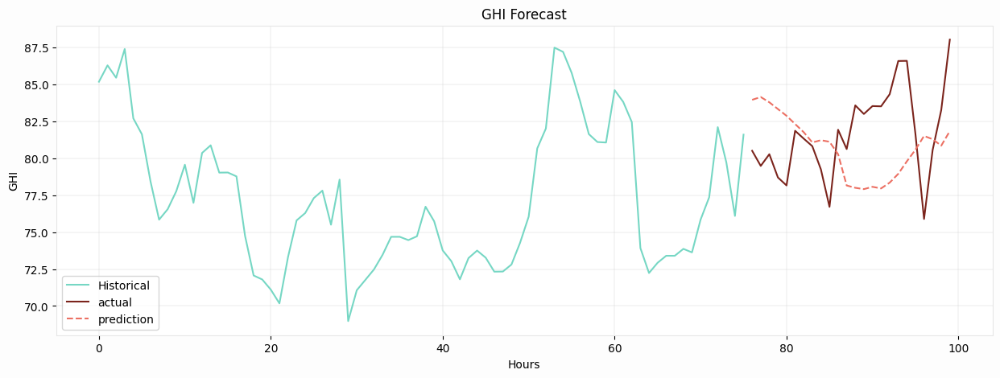

In [ ]:
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24])), temp[TARGET_FEATURES[1]].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), temp[TARGET_FEATURES[1]].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), predictions, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','GHI','GHI Forecast')
plt.legend()
plt.show()

In [ ]:
# @title ARIMAX modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data[weather_data['ll_label'] == ll]
  arimax_model = sm.tsa.SARIMAX(np.array(temp[TARGET_FEATURES[1]].iloc[-2000:-24]),
                                order=(6, 0, 3),
                                # seasonal_order=(0, 0, 0, int(1/0.001)),
                                exog=np.array(temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-2000:-24,:]))
  sarimax_fit_arimax = arimax_model.fit(disp=True)

  with open(f'GHI_{ll}_forecast_ARIMAX.pkl', 'wb') as file:
      pickle.dump(sarimax_fit_arimax, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_{ll}_forecast_ARIMAX.pkl'

  source_file_name = f'GHI_{ll}_forecast_ARIMAX.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break

<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_ARIMAX.pkl, None>
File GHI_0_forecast_ARIMAX.pkl uploaded to avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_ARIMAX.pkl.


In [ ]:
sarimax_fit_arimax.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 1976
Model:               SARIMAX(6, 0, 3)   Log Likelihood               23308.505
Date:                Tue, 09 Jul 2024   AIC                         -46591.010
Time:                        15:45:26   BIC                         -46518.355
Sample:                             0   HQIC                        -46564.316
                               - 1976                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             1.0000   9.29e-08   1.08e+07      0.000       1.000       1.000
x2         -8.574e-07   8.95e-08     -9.580      0.000   -1.03e-06   -6.82e-07
x3         -1.463e-06   1.54e-07     -9.481      0.000   -1.77e-06   -1.16e-06
ar.L1        3.26e-19   4.97e-13   6.57e-07      1.000   -9.73e-13    9.73e-13
ar.L2       6.303e-19      5e-13   1.26e-06      1.000   -9.79e-13    9.79e-13
ar.L3       9.563e-19   4.92e-13   1.94e-06      1.000   -9.65e-13    9.65e-13
ar.L4       1.239e-18   4.65e-13   2.66e-06      1.000   -9.12e-13    9.12e-13
ar.L5       1.565e-18   4.38e-13   3.58e-06      1.000   -8.58e-13    8.58e-13
ar.L6       1.869e-18    3.9e-13    4.8e-06      1.000   -7.63e-13    7.63e-13
ma.L1       -3.26e-19   4.97e-13  -6.57e-07      1.000   -9.73e-13    9.73e-13
ma.L2      -6.303e-19      5e-13  -1.26e-06      1.000   -9.79e-13    9.79e-13
ma.L3      -9.563e-19   4.92e-13  -1.94e-06      1.000   -9.65e-13    9.65e-13
sigma2      2.307e-12   5.11e-11      0.045      0.964   -9.78e-11    1.02e-10
===================================================================================
Ljung-Box (L1) (Q):                1749.68   Jarque-Bera (JB):                52.20
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.75   Skew:                            -0.40
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.01
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 7.18e+27. Standard errors may be unstable.
"""

In [ ]:
# Make predictions
predictions_arimax = sarimax_fit_arimax.forecast(steps=24, exog = temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-24:,:])

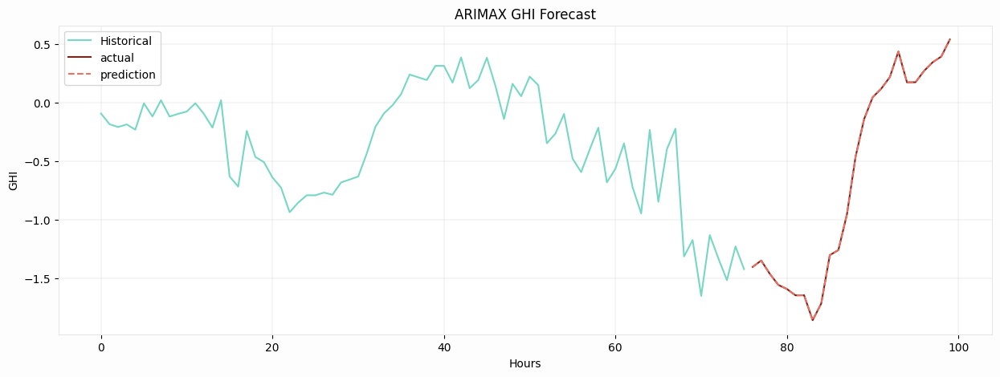

In [ ]:
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24])), temp[TARGET_FEATURES[1]].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), temp[TARGET_FEATURES[1]].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), predictions_arimax, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','GHI','ARIMAX GHI Forecast')
plt.legend()
plt.show()

<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_SARIMAA.pkl, None>
File GHI_0_forecast_SARIMA.pkl uploaded to avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_SARIMAA.pkl.


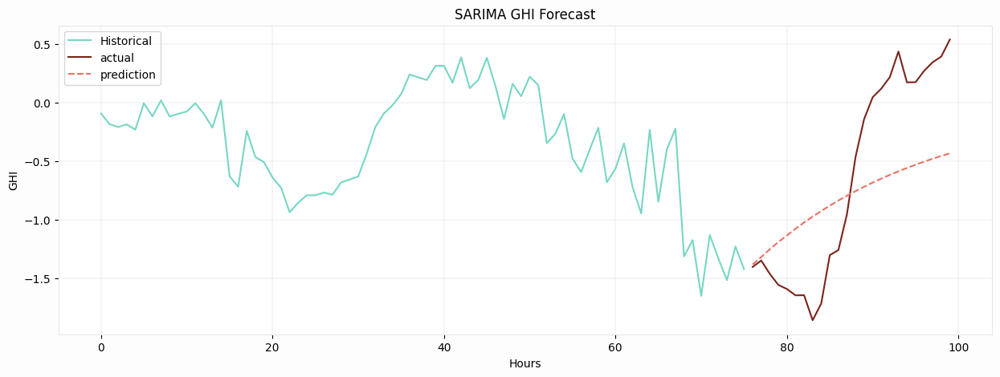

In [ ]:
# @title SARIMA modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data[weather_data['ll_label'] == ll]
  sarima_model = sm.tsa.SARIMAX(np.array(temp[TARGET_FEATURES[1]].iloc[:-24]),
                                order=(6, 0, 3),
                                seasonal_order=(0, 0, 0, int(1/0.001))
                                # exog=np.array(temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-2000:-24,:])
                                )
  sarimax_fit_sarima = sarima_model.fit(disp=True)

  with open(f'GHI_{ll}_forecast_SARIMA.pkl', 'wb') as file:
      pickle.dump(sarimax_fit_sarima, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_{ll}_forecast_SARIMAA.pkl'

  source_file_name = f'GHI_{ll}_forecast_SARIMA.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break
sarimax_fit_sarima.summary()
# Make predictions
predictions_sarima = sarimax_fit_sarima.forecast(steps=24)
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24])), temp[TARGET_FEATURES[1]].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), temp[TARGET_FEATURES[1]].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp[TARGET_FEATURES[1]].iloc[-100:-24]),len(temp[TARGET_FEATURES[1]].iloc[-100:-24])+len(temp[TARGET_FEATURES[1]].iloc[-24:])), predictions_sarima, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','GHI','SARIMA GHI Forecast')
plt.legend()
plt.show()

In [ ]:
from sklearn.preprocessing import StandardScaler
for col in [c for c in weather_data.columns]:
  if col in ['utc_timestamp','hour','date_hour','lat', 'lon', 'country']:
    pass
  else:
    t_ss_r = StandardScaler()
    # feature_ss_r[col] = t_ss_r
    t_ss_r.fit(np.array(weather_data[f"{col}"]).reshape(-1,1))
    scaled_data = t_ss_r.transform(np.array(weather_data[f"{col}"]).reshape(-1,1))
    weather_data[f"{col}_normalized"] = scaled_data
weather_data['ll_label'] = 0
weather_data['date'] = weather_data['utc_timestamp'].dt.date

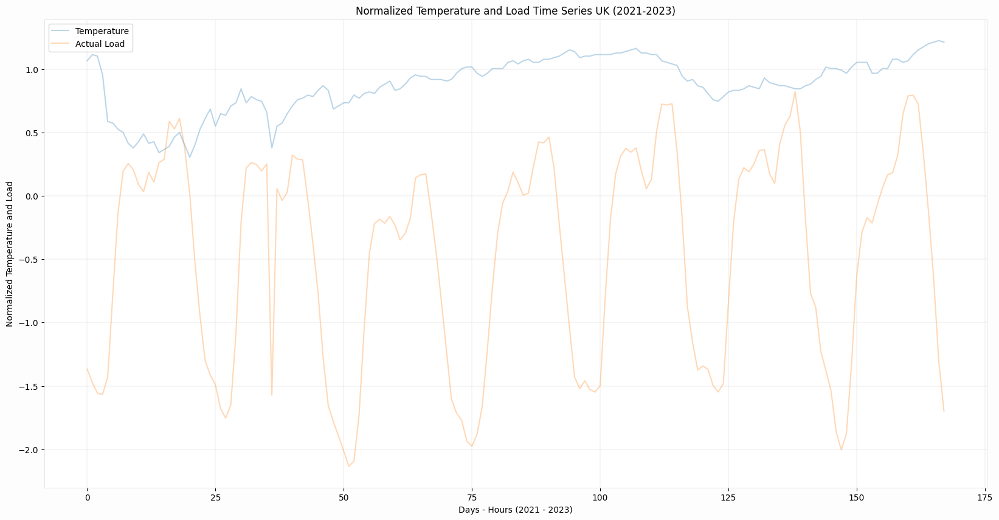

In [ ]:
fig = plt.figure(figsize = (20,10))
ax = plt.axes()

plt.plot(range(len(weather_data))[0:24*7],weather_data['temperature_2m_normalized'].values[-7*24:], alpha = 0.3, label = 'Temperature')
plt.plot(range(len(weather_data))[0:24*7],weather_data['GB_GBN_load_actual_entsoe_transparency_normalized'].values[-7*24:], alpha = 0.3, label = 'Actual Load')
plt.legend()
plot_cosmos(ax,'Days - Hours (2021 - 2023)','Normalized Temperature and Load','Normalized Temperature and Load Time Series UK (2021-2023)')
plt.show()

In [ ]:
weather_data.columns

Index(['utc_timestamp', 'GB_GBN_load_actual_entsoe_transparency',
       'GB_GBN_load_forecast_entsoe_transparency', 'GB_GBN_price_day_ahead',
       'GB_GBN_solar_capacity', 'GB_GBN_solar_generation_actual',
       'GB_GBN_solar_profile', 'GB_GBN_wind_capacity',
       'GB_GBN_wind_generation_actual', 'GB_GBN_wind_profile',
       ...
       'global_tilted_irradiance_normalized',
       'terrestrial_radiation_normalized',
       'shortwave_radiation_instant_normalized',
       'direct_radiation_instant_normalized',
       'diffuse_radiation_instant_normalized',
       'direct_normal_irradiance_instant_normalized',
       'global_tilted_irradiance_instant_normalized',
       'terrestrial_radiation_instant_normalized', 'll_label', 'date'],
      dtype='object', length=122)

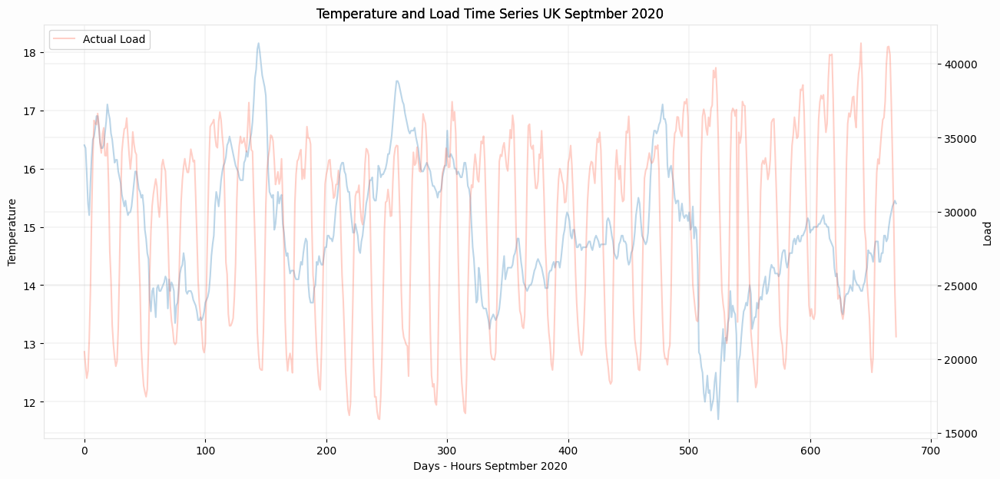

In [ ]:
fig, ax1 = plt.subplots(figsize = (15,7))

# Create a secondary y-axis
ax2 = ax1.twinx()  # Create a twin Axes sharing the xaxis

ax1.plot(range(len(weather_data))[0:24*4*7],weather_data['temperature_2m'].values[-7*24*4:], alpha = 0.3, label = 'Temperature')
ax2.plot(range(len(weather_data))[0:24*4*7],weather_data['GB_GBN_load_actual_entsoe_transparency'].values[-7*24*4:], alpha = 0.3, label = 'Actual Load', color = 'tomato')
plt.legend()
plot_cosmos(ax1,'Days - Hours Septmber 2020','Temperature','Temperature and Load Time Series UK Septmber 2020')
plot_cosmos(ax2,'Days - Hours Septmber 2020','Load','Temperature and Load Time Series UK Septmber 2020')
plt.show()

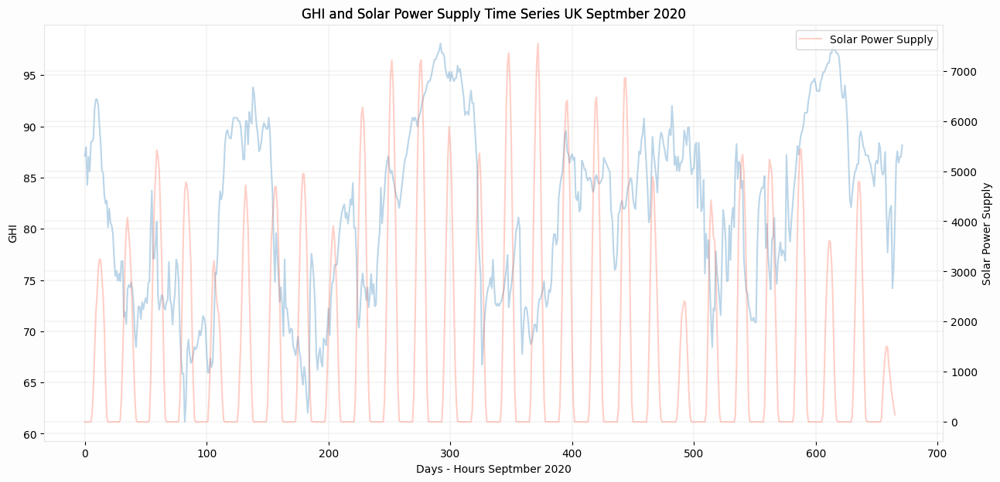

In [ ]:
fig, ax1 = plt.subplots(figsize = (15,7))

# Create a secondary y-axis
ax2 = ax1.twinx()  # Create a twin Axes sharing the xaxis

ax1.plot(range(len(weather_data))[0:24*4*7],weather_data['shortwave_radiation'].values[-7*24*4:], alpha = 0.3, label = 'GHI')
ax2.plot(range(len(weather_data))[0:24*4*7],weather_data['GB_GBN_solar_generation_actual'].values[-7*24*4:], alpha = 0.3, label = 'Solar Power Supply', color = 'tomato')
plt.legend()
plot_cosmos(ax1,'Days - Hours Septmber 2020','GHI','GHI and Solar Power Supply Time Series UK Septmber 2020')
plot_cosmos(ax2,'Days - Hours Septmber 2020','Solar Power Supply','GHI and Solar Power Supply Time Series UK Septmber 2020')
plt.show()

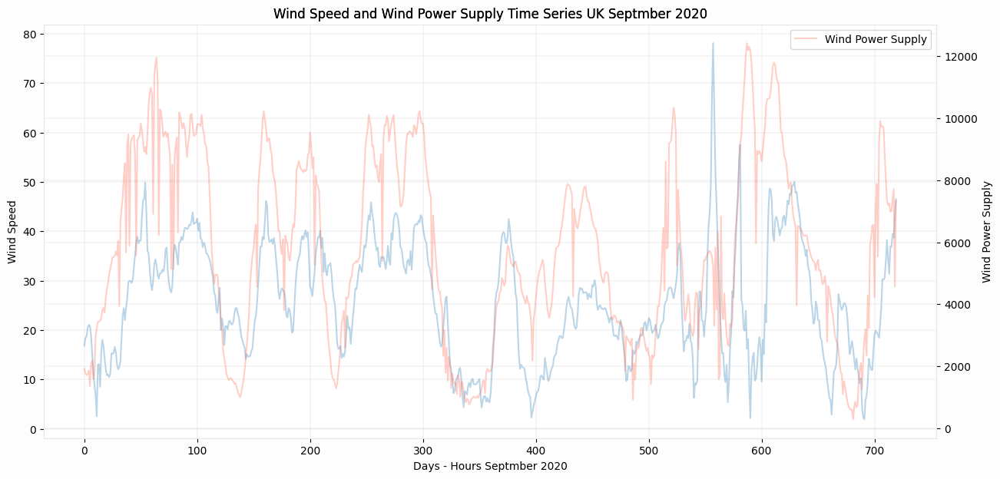

In [ ]:
fig, ax1 = plt.subplots(figsize = (15,7))

# Create a secondary y-axis
ax2 = ax1.twinx()  # Create a twin Axes sharing the xaxis

ax1.plot(range(len(weather_data))[0:24*30],weather_data['wind_speed_10m'].values[-30*24:], alpha = 0.3, label = 'Wind Speed')
ax2.plot(range(len(weather_data))[0:24*30],weather_data['GB_GBN_wind_generation_actual'].values[-30*24:], alpha = 0.3, label = 'Wind Power Supply', color = 'tomato')
plt.legend()
plot_cosmos(ax1,'Days - Hours Septmber 2020','Wind Speed','Wind Speed and Wind Power Supply Time Series UK Septmber 2020')
plot_cosmos(ax2,'Days - Hours Septmber 2020','Wind Power Supply','Wind Speed and Wind Power Supply Time Series UK Septmber 2020')
plt.show()

In [ ]:
 weather_data['date_hour'].values[-30*24:].min()

numpy.datetime64('2020-09-01T00:00:00.000000')